In [3]:
# Importing required libraries for data analysis and visualization
import numpy as np  # Numerical operations and arrays
import pandas as pd  # Data manipulation and analysis
import matplotlib.pyplot as plt  # Plotting library
import seaborn as sns  # Data visualization library based on matplotlib
from datetime import datetime, timedelta
import re

# 1. Analysing data science from linkedin

## 1.1 Exploratory Analysis about data science

The first dataset used in the study was obtained by crawling LinkedIn, a professional social networking platform, with the keyword ‘data science’. A total of 5138 job postings related to this keyword were successfully collected through crawling techniques. The dataset covers the core fields such as job title, posting date, company information, job requirements, geographic location and so on.

In [4]:
#read data
file_path = r"C:\Users\WANG XIAOQIN\Desktop\data backup\c drive\Desktop\P2数据集\processed_jobs.xlsx"
df = pd.read_excel(file_path, engine="openpyxl")

In [11]:
df['Job Description'].apply(lambda x: len(x.split())).sum()

1626528

In [17]:
from scipy.stats import poisson, kstest
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

In [18]:
doc_lengths = [len(str(doc).split()) for doc in df["Job Description"]]
# 示例：拟合负二项分布
mean_len = np.mean(doc_lengths)
var_len = np.var(doc_lengths)
print(f"Mean: {mean_len:.2f}, Variance: {var_len:.2f}")

# 拟合负二项（粗略估计参数）
r = (mean_len**2) / (var_len - mean_len)
p = mean_len / var_len
print(f"Estimated Negative Binomial Parameters: r={r:.2f}, p={p:.2f}")

Mean: 411.05, Variance: 53022.87
Estimated Negative Binomial Parameters: r=3.21, p=0.01


In the crawled dataset of LinkedIn platform, the ‘Job Description’ field contains a total of 2,125,581 words, reflecting the high richness of job description text.

From knowledge of using linkedin, there are times where companies or recruiters can post the same role leading to duplicates. Therefore 2 methods will be used to remove duplicates:

Removing documents that contain the same text in the job description; 
Using cosine similarities to remove documents very closely worded

In [6]:
df = df.drop_duplicates(subset =['Location', 'Job Description']).reset_index(drop=True)

#Replace missing values so reg expressions can be used for contract and salary
df = df.fillna('-')

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import pandas as pd

# Cleaning function (standardised)
def clean_title(title):
    title = str(title).lower()
    title = re.sub(r'[^a-z\s]', '', title)
    title = re.sub(r'\s+', ' ', title).strip()
    return title

df['Job Title Clean'] = df['Job Title'].apply(clean_title)
df.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Job Description Tokenized,Job Title Clean
0,Digital Marketer Intern,CTOS,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/digital-mark...,Are you passionate about digital marketing and...,Are you passionate about digital marketing and...,digital marketer intern
1,MySTEP Career Acceleration Programme 2025,Bank Pembangunan Malaysia Berhad,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/mystep-caree...,Elevate Your Banking Career with us! Be part o...,Elevate Your Banking Career with us Be part of...,mystep career acceleration programme
2,"Data Analytics & Science Intern, HQ","Love, Bonito","Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/data-analyti...,Are you passionate about using data to solve r...,Are you passionate about using data to solve r...,data analytics science intern hq
3,"Intern, HR Learning Development",ZUS Coffee,"Subang Jaya, Selangor, Malaysia",1 month ago,https://my.linkedin.com/jobs/view/intern-hr-le...,Position ResponsibilitiesTo support the Talent...,Position ResponsibilitiesTo support the Talent...,intern hr learning development
4,Internship - Product Management (Mobility) [RI...,Setel,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 week ago,https://my.linkedin.com/jobs/view/internship-p...,About Setel:The Future of MobilityIntroduced i...,About Setel The Future of MobilityIntroduced i...,internship product management mobility rid


In [15]:
# Ensure that the cleaned Job Title Clean columns are consistent in the original df and clustered_titles
df['Job Title Clean'] = df['Job Title'].apply(clean_title)
unique_titles = df['Job Title Clean'].dropna().unique()

# TF-IDF Vector
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(unique_titles)

# Cluster
kmeans = KMeans(n_clusters=20, random_state=42, n_init='auto')
clusters = kmeans.fit_predict(X)

# Establish DataFrame
clustered_titles = pd.DataFrame({
    'Job Title Clean': unique_titles,
    'Cluster': clusters
})

# Merge
df = df.merge(clustered_titles, on='Job Title Clean', how='left')

# Check if merge successfully
assert 'Cluster' in df.columns, "Merge failed: 'Cluster' not found."

In [16]:
df.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Job Description Tokenized,Job Title Clean,Cluster
0,Digital Marketer Intern,CTOS,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/digital-mark...,Are you passionate about digital marketing and...,Are you passionate about digital marketing and...,digital marketer intern,3
1,MySTEP Career Acceleration Programme 2025,Bank Pembangunan Malaysia Berhad,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/mystep-caree...,Elevate Your Banking Career with us! Be part o...,Elevate Your Banking Career with us Be part of...,mystep career acceleration programme,14
2,"Data Analytics & Science Intern, HQ","Love, Bonito","Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/data-analyti...,Are you passionate about using data to solve r...,Are you passionate about using data to solve r...,data analytics science intern hq,3
3,"Intern, HR Learning Development",ZUS Coffee,"Subang Jaya, Selangor, Malaysia",1 month ago,https://my.linkedin.com/jobs/view/intern-hr-le...,Position ResponsibilitiesTo support the Talent...,Position ResponsibilitiesTo support the Talent...,intern hr learning development,3
4,Internship - Product Management (Mobility) [RI...,Setel,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 week ago,https://my.linkedin.com/jobs/view/internship-p...,About Setel:The Future of MobilityIntroduced i...,About Setel The Future of MobilityIntroduced i...,internship product management mobility rid,4


In [17]:
# Grouping the number of posts and representative posts in each cluster
cluster_stats = df.groupby('Cluster').agg({
    'Job Title': ['count', lambda x: x.mode().iloc[0] if not x.mode().empty else '']
}).reset_index()

# Setting Column Names
cluster_stats.columns = ['Cluster', 'Number of Posts', 'Representative Title']

# Sort to view the top 10 categories
top19_clusters = cluster_stats.sort_values(by='Number of Posts', ascending=False).head(19)
top19_clusters

,Cluster,Number of Posts,Representative Title
3,3,723,Data Engineer
14,14,707,Data Scientist
7,7,318,Java Developer
15,15,251,Marketing Executive
9,9,244,Software Engineer
6,6,227,Data Analyst
1,1,226,Product Manager
16,16,209,Billing Support Specialist
17,17,183,Business Analyst
10,10,166,Account Assistant


In [10]:
# Set image size and style
plt.figure(figsize=(12, 8))
sns.set(style='whitegrid', font_scale=1.1)  # Increase font size scale

# Create a horizontal bar plot
ax = sns.barplot(
    data=top3_clusters,
    y='Representative Title',
    x='Number of Posts',
    hue='Representative Title',  # Required to use palette properly
    palette='Blues_d',
    dodge=False,                 # Keep it as a single bar per row
    legend=False,                # Don't show the legend
    edgecolor='black',
    linewidth=0.5
)

# Add title and axis labels
plt.title('Top 3 Job Clusters by Number of Posts', fontsize=16, pad=20)
plt.xlabel('Number of Posts', fontsize=12)
plt.ylabel('Representative Job Title', fontsize=12)

# Add data labels at the end of each bar
for p in ax.patches:
    width = p.get_width()
    ax.annotate(f'{width:.0f}',
                xy=(width, p.get_y() + p.get_height() / 2),
                xytext=(5, 0),  # Adjust text offset
                textcoords="offset points",
                ha='left',
                va='center',
                fontsize=10,
                bbox=dict(boxstyle='round,pad=0.2',
                          fc='white',
                          ec='grey',
                          alpha=0.7))

# Add vertical grid lines (dashed style)
ax.xaxis.grid(True, linestyle='--', alpha=0.4)

# Adjust axis spines
ax.spines['top'].set_visible(False)    # Remove top border
ax.spines['right'].set_visible(False)  # Remove right border
ax.spines['left'].set_color('gray')    # Set left border color
ax.spines['bottom'].set_color('gray')  # Set bottom border color

# Adjust bar border thickness uniformly
plt.setp(ax.patches, linewidth=0.5)

# Display the chart
plt.tight_layout()
plt.show()

NameError: name 'top3_clusters' is not defined

<Figure size 1200x800 with 0 Axes>

### 1.1.1 Most frequent companies

When analysing LinkedIn Malaysia job posting data, identifying high-frequency recruiters is important to understand the dominant players in the local job market. These companies are typically large or in constant demand for talent, and their hiring activity measures industry dynamism, labour mobility and job supply, revealing the source of employment opportunities and providing empirical evidence for job seekers and policy makers.

In [10]:
SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 16

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize

C:\Users\王晓琴\AppData\Local\Temp\ipykernel_13008\2932754604.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


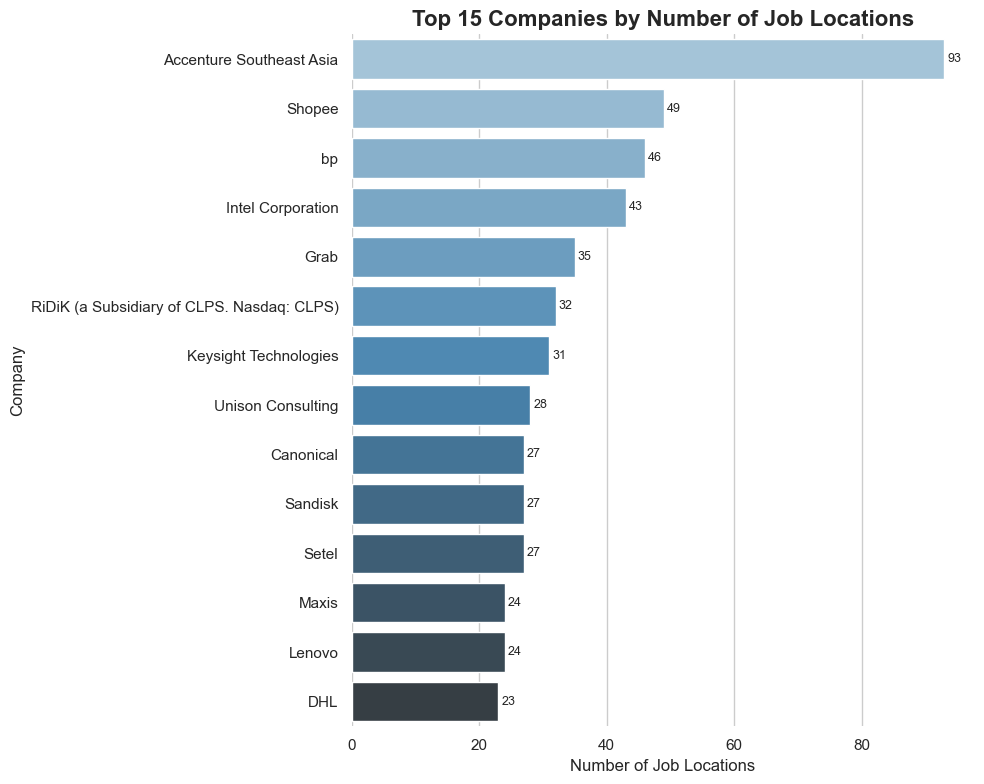

In [11]:
# Group by company and count the number of job locations
rec_df = df.groupby('Company').count().sort_values(by='Location', ascending=False).reset_index()[['Company', 'Location']].copy()

# Take the top 14 companies
top15 = rec_df.head(14)

# Set plot style
sns.set(style="whitegrid")
plt.figure(figsize=(10, 8))

# Create the bar plot with an improved color palette
barplot = sns.barplot(
    x="Location", 
    y="Company", 
    data=top15, 
    palette="Blues_d"
)

# Add value labels to the bars
for index, value in enumerate(top15["Location"]):
    plt.text(value + 0.5, index, str(value), va='center', fontsize=9)

# Add title and axis labels
plt.title('Top 15 Companies by Number of Job Locations', fontsize=16, fontweight='bold')
plt.xlabel('Number of Job Locations', fontsize=12)
plt.ylabel('Company', fontsize=12)

# Remove top and right spines
sns.despine(left=True, bottom=True)

# Optimize layout
plt.tight_layout()
plt.show()

1. By analysing the job distribution data of the top companies in Malaysia, and based on the attributes of the companies and the number of distribution points, the companies on the list are clearly divided into three major industry clusters.

2. 
Technology and digital services industry, as the dominant demand, is represented by Accenture, Shopee, Grab, Canonical, etc., which account for 40% (6/15) of the Top 15 companies and two of the top three companies, with an average of 47.5 points of distribution, widely covering IT services, e-commerce, the sharing economy and other core areas of the digital economy


3. 
Energy and high-end manufacturing constitute the basic demand, typical enterprises including bp, Intel, Keysight, SanDisk, etc., the average distribution point 36.8, stable layout, semiconductor companies accounted for 50%, energy companies have the largest single-point scal
e
4. .
Professional services and logistics industry, as a supporting demand, is typified by RIDIK, Unison and DHL, with an average of 29.7 distribution points and a service radius covering the whole region; IT consulting enterprises have achieved an annual job growth of 15 per cent, and logistics giant DHL supports cross-border logistics through numerous hu
b
5. s.
From the analysis of industry demand tiers, in terms of absolute number of jobs, technology accounts for 47%, manufacturing 33% and services 20%.
In summary, the Malaysian job market is characterised by a triadic structure of ‘technology-led - manufacturing-based - service-supported’, with the digital technology services industry becoming the core engine of regional talent demand with a 47% share of jobs.

### 1.1.2 regional distribution

In [12]:
list(df[(df['Location'].str.contains('Selangor'))  & (df['Company']=='ZUS Coffee')]['Location'].values)

['Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Shah Alam, Selangor, Malaysia',
 'Shah Alam, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Kuala Kubu Baharu, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia',
 'Subang Jaya, Selangor, Malaysia']

By grouping jobs by ‘Location’ and counting the number of jobs corresponding to each location, we identify recurring workplaces and analyse the distribution and concentration of jobs in different locations.

In [13]:
#Set to lower case so capitalised titles don't get counted separately
df['Location'] = df['Location'].apply(lambda x: x.lower())

#Group by Role to investigate different types
df_grp = df.groupby('Location').count().reset_index().sort_values(by='Company', ascending=False)[['Location', 'Company']]

print("Number of unique job locations:", df_grp.shape[0])

print("Number of titles used more than once:", df_grp[df_grp.Company > 1].shape[0])

df_grp[df_grp.Company > 1]

Number of unique job locations: 139
Number of titles used more than once: 90


,Location,Company
65,"kuala lumpur, federal territory of kuala lumpu...",1116
99,"petaling jaya, selangor, malaysia",460
36,"federal territory of kuala lumpur, malaysia",390
138,"wp. kuala lumpur, federal territory of kuala l...",268
41,greater kuala lumpur,236
...,...,...
25,"bukit raja, selangor, malaysia",2
125,"sungai petani, kedah, malaysia",2
71,"kulai, johore, malaysia",2
114,"serdang, selangor, malaysia",2


In [14]:
# Define city classification mapping (keywords mapped to standardized city names)
city_mapping = {
    "kuala lumpur": "Kuala Lumpur", "federal territory of kuala lumpur": "Kuala Lumpur", "wp.": "Kuala Lumpur", "bukit jalil": "Kuala Lumpur",
    "kl eco city": "Kuala Lumpur", "bangsar south": "Kuala Lumpur", "bukit persekutuan": "Kuala Lumpur", "taman wilayah": "Kuala Lumpur",
    "greater kuala lumpur": "Kuala Lumpur", "selangor": "Selangor", "damansara": "Selangor", "petaling": "Selangor", "subang": "Selangor", "shah alam": "Selangor",
    "cyberjaya": "Selangor", "kajang": "Selangor", "klang": "Selangor", "ampang": "Selangor", "seri kembangan": "Selangor",
    "semenyih": "Selangor", "batu caves": "Selangor", "puncak alam": "Selangor", "pelabuhan klang": "Selangor", "penang": "Penang", 
    "bayan lepas": "Penang", "georgetown": "Penang", "butterworth": "Penang", "bukit mertajam": "Penang",
    "batu kawan": "Penang", "taman pulau pinang": "Penang", "perai": "Penang", "seberang perai": "Penang", "george town": "Penang",
    
    "johor": "Johor", "johore": "Johor", "iskandar": "Johor", "masai": "Johor", "pasir gudang": "Johor", "senai": "Johor", "bandar banang jaya": "Johor",
    "greater johor bahru": "Johor", "negri sembilan": "Negeri Sembilan", "negeri sembilan": "Negeri Sembilan", "seremban": "Negeri Sembilan",
    "nilai": "Negeri Sembilan", "port dickson": "Negeri Sembilan", "kedah": "Kedah", "kulim": "Kedah", "langkawi": "Kedah",
    "perak": "Perak", "ipoh": "Perak", "sarawak": "Sarawak", "kuching": "Sarawak",
    "bintulu": "Sarawak", "melaka": "Melaka", "malacca": "Melaka", "putrajaya": "Putrajaya", "pahang": "Pahang", "kuantan": "Pahang"
}

# Convert all location strings to lowercase for matching
df_grp["Location_cleaned"] = df_grp["Location"].str.lower()

# Define a function to classify cities based on keyword matching
def classify_city(location):
    for keyword, city in city_mapping.items():
        if keyword in location:
            return city
    return "Other"  # Assign "Other" if no match is found

# Apply classification function
df_grp["City"] = df_grp["Location_cleaned"].apply(classify_city)

# Aggregate by city
city_summary = df_grp.groupby("City")["Company"].sum().reset_index().sort_values(by="Company", ascending=False)

# Display result
print(city_summary)

               City  Company
2      Kuala Lumpur     2215
11         Selangor     1070
7            Penang      317
0             Johor      131
5             Other       98
1             Kedah       35
4   Negeri Sembilan       22
3            Melaka       21
8             Perak       21
10          Sarawak       13
6            Pahang       10
9         Putrajaya        4


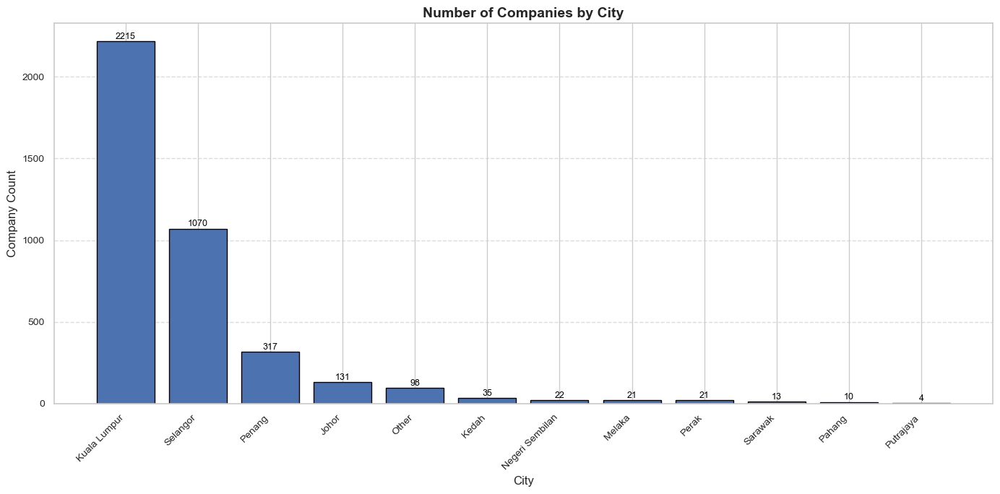

In [15]:
# Sort by Company count (descending)
city_summary_sorted = city_summary.sort_values(by="Company", ascending=False)

# Create the bar chart
plt.figure(figsize=(14, 7))
bars = plt.bar(city_summary_sorted["City"], city_summary_sorted["Company"], color="#4C72B0", edgecolor="black")

# Add data labels above each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        yval + 1,  # Slight upward offset
        f"{int(yval)}",  # Display as integer
        ha="center",
        va="bottom",
        fontsize=9,
        color="black"
    )

# Chart styling
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.title("Number of Companies by City", fontsize=14, weight='bold')
plt.xlabel("City", fontsize=12)
plt.ylabel("Company Count", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

The chart shows significant differences in the distribution of the number of companies among different cities in Malaysia. Kuala Lumpur has 2,215 companies and Selangor has 1,070 companies, ranking top two with a high concentration of enterprises. Penang has 317 companies and Johor has 131 companies, leading relatively among the remaining cities and potentially serving as secondary centers for regional economic development. Most cities such as Perak and Melaka have around 20 - 25 companies, while cities like Perlis, Sarawak, Pahang, and Putrajaya have even fewer than 20 companies, showing relatively weak activity and influence in the regional economy. 

In [16]:
# # result = pd.merge(region_counts[Region], df_grp[Company], on='Region', how='left')
# result = region_counts.merge(df_grp[['City', 'Company']], on='City')
# result

In [17]:
# # 导入所需库
# import pandas as pd

# # 筛选公司数大于2的地点
# df_export = df_grp[df_grp['Company'] > 2]

# # 导出为 Excel 文件
# df_export.to_excel('job_locations_over_2.xlsx', index=False)

# print("已成功导出 job_locations_over_2.xlsx")

The purpose of drawing regional heat maps is to visualise the spatial distribution characteristics, density differences and concentration trends of data within a region.

In [18]:
from geopy.geocoders import Nominatim
import pandas as pd
import time

# Initialize the geolocator with a user agent
geolocator = Nominatim(user_agent="location_mapper")

# Define a function to get latitude and longitude from a location string
def get_lat_lon(location):
    try:
        loc = geolocator.geocode(location)
        if loc:
            return pd.Series([loc.latitude, loc.longitude])
    except:
        return pd.Series([None, None])
    return pd.Series([None, None])

# Filter locations with more than 2 companies
df_map = df_grp[df_grp['Company'] > 2].copy()

# Get latitude and longitude for each location
df_map[['lat', 'lon']] = df_map['Location'].apply(get_lat_lon)

# Pause for 1 second between requests to avoid rate limiting
time.sleep(1)

In [19]:
import folium
from folium.plugins import HeatMap

# Create a map centered at the median latitude and longitude
m = folium.Map(location=[df_map['lat'].median(), df_map['lon'].median()], zoom_start=6)

# Prepare heatmap data: [latitude, longitude, weight]
heat_data = [
    [row['lat'], row['lon'], row['Company']]
    for index, row in df_map.iterrows()
    if not pd.isnull(row['lat']) and not pd.isnull(row['lon'])
]

# Add the heatmap layer
HeatMap(heat_data).add_to(m)

# Display the map
m

Kuala Lumpur and the surrounding areas are in the red with high levels of heat, which is the core concentration of jobs, while George Town and the neighbourhood of Johor are also in high levels of heat, indicating that there is some demand for jobs in these places.

### 1.1.3 Average Lengths of Job Descriptions in the Dataset

Let's find out average lengths of available job descriptions in the dataset.

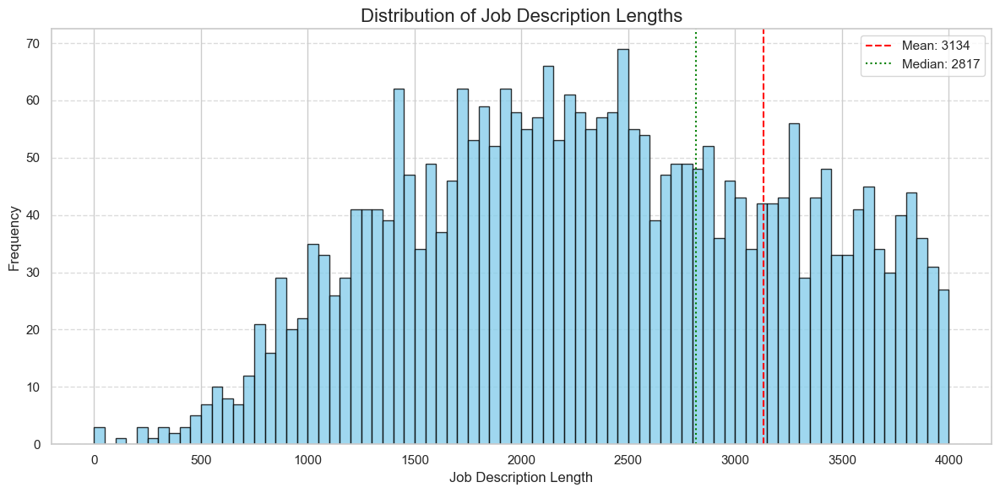

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the length of each job description
desc_len = [len(desc) for desc in df['Job Description']]

# Set figure size and style
plt.figure(figsize=(12, 6))
plt.hist(desc_len, bins=80, range=(0, 4000), color='skyblue', edgecolor='black', alpha=0.8)

# Add title and axis labels
plt.title('Distribution of Job Description Lengths', fontsize=16)
plt.xlabel('Job Description Length', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add mean and median lines
mean_len = np.mean(desc_len)
median_len = np.median(desc_len)
plt.axvline(mean_len, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {int(mean_len)}')
plt.axvline(median_len, color='green', linestyle='dotted', linewidth=1.5, label=f'Median: {int(median_len)}')

# Add legend and grid
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Optimize layout and display the plot
plt.tight_layout()
plt.show()

This chart shows the distribution of job description lengths. It can be seen that the distribution of job description lengths is somewhat skewed, with the majority of job description lengths clustered between 1000 - 3500. The Mean is 3134, marked by a red dotted line, and the Median is 2817, marked by a green dotted line. The fact that the Mean is greater than the Median indicates that the data is right skewed, i.e., some of the longer job descriptions are pulling up the Mean. This suggests that although the majority of job descriptions in the dataset are concentrated in a certain range of lengths, there are also some that are significantly longer, making the overall distribution not completely symmetrical.

## 1.2 Time series about data science

Doing jobs over time can reflect factors such as industry heat, seasonal employment fluctuations, and the impact of economic cycles.

#### 1.2.1 Overall trends in job postings

Preprocessing Time Series Data

In [21]:
from datetime import datetime, timedelta

def process_date_to_days(date_str):
    today = datetime(2025, 4, 9)

    date_str = str(date_str).lower().strip()

    if 'month' in date_str:
        num_months = int(date_str.split()[0])
        return (today - timedelta(days=num_months * 30)).date()

    elif 'week' in date_str:
        num_weeks = int(date_str.split()[0])
        return (today - timedelta(weeks=num_weeks)).date()

    elif 'day' in date_str:
        num_days = int(date_str.split()[0])
        return (today - timedelta(days=num_days)).date()

    elif 'yesterday' in date_str:
        return (today - timedelta(days=1)).date()

    elif 'today' in date_str:
        return today.date()

    return None  # Return None for unknown formats

# Example: Apply to a DataFrame
# df = pd.DataFrame({'Published Date': ['2 months ago', '3 weeks ago', '5 days ago', 'yesterday', 'today']})
df['Published Date'] = df['Published Date'].apply(process_date_to_days)

print(df.head(50))

                                            Job Title  \
0                             Digital Marketer Intern   
1           MySTEP Career Acceleration Programme 2025   
2                 Data Analytics & Science Intern, HQ   
3                     Intern, HR Learning Development   
4   Internship - Product Management (Mobility) [RI...   
5                            Intern, Growth Marketing   
6                            Quality Assurance Intern   
7            Data Analyst Intern (March/April Intake)   
8                             Data Analyst Internship   
9           Protégé Trainee - Business Transformation   
10  PROTÉGÉ Graduate Trainee, Internal Audit (Kual...   
11  Product Analysis Associate Specialist: Campus ...   
12                     SR&T Analyst (Fresh Graduates)   
13               Intern, Data Scientist | TNG Digital   
14                           Quality Assurance Intern   
15                      [Internship] - Data Scientist   
16                             

In [22]:
# Sort the dataframe by the 'Published Date Parsed' column
df = df.sort_values(by='Published Date')

# Count the number of job postings for each date to create a time series
time_series = df.groupby('Published Date').size()

# Apply forward fill method to fill any missing values
time_series = time_series.fillna(method='ffill')

# # Detect and remove outliers using the Z-score method
# Q1 = time_series.quantile(0.25)  # First quartile
# Q3 = time_series.quantile(0.75)  # Third quartile
# IQR = Q3 - Q1  # Interquartile range
# lower_bound = Q1 - 1.5 * IQR  # Lower bound for outlier detection
# upper_bound = Q3 + 1.5 * IQR  # Upper bound for outlier detection

# # Filter the time series to remove entries outside of the bounds
# filtered_entries = (time_series >= lower_bound) & (time_series <= upper_bound)
# time_series = time_series[filtered_entries]
# time_series.head()
# # Print the processed time series data (after removing outliers)
# print("Processed time series data (after removing outliers):", time_series)

C:\Users\王晓琴\AppData\Local\Temp\ipykernel_13008\6623437.py:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  time_series = time_series.fillna(method='ffill')


In [23]:
time_series

Published Date
2024-05-14     10
2024-06-13      5
2024-07-13     11
2024-08-12     21
2024-09-11     30
2024-10-11     20
2024-11-10     81
2024-12-10     75
2025-01-09     96
2025-02-08    143
2025-03-10    387
2025-03-12     72
2025-03-19    401
2025-03-26    765
2025-04-02    910
2025-04-03    110
2025-04-04    184
2025-04-05    179
2025-04-06    206
2025-04-07    138
2025-04-08    113
dtype: int64

In [24]:
# 创建新的 DataFrame
# new_df = pd.DataFrame({'Published Date': aggregated_time_series.index, 'JobPostings': aggregated_time_series.values})
# new_df

In [25]:
# create new DataFrame
new_df = pd.DataFrame({'Published Date': time_series.index, 'JobPostings': time_series.values})
new_df

,Published Date,JobPostings
0,2024-05-14,10
1,2024-06-13,5
2,2024-07-13,11
3,2024-08-12,21
4,2024-09-11,30
5,2024-10-11,20
6,2024-11-10,81
7,2024-12-10,75
8,2025-01-09,96
9,2025-02-08,143


In [26]:
# lets see the shape of our data
new_df.shape

(21, 2)

In [27]:
# lets set the date into the index
new_df = new_df.set_index('Published Date')

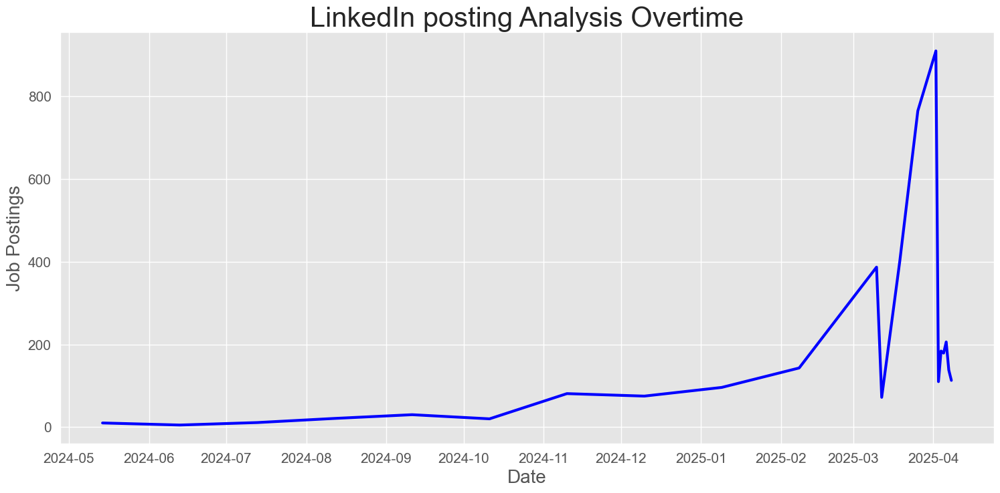

In [28]:
# lets make the plot more readable
plt.style.use('ggplot')
plt.figure(figsize=(18,8))
plt.grid(True)
plt.xlabel('Date', fontsize=(20))
plt.xticks(fontsize=15)
plt.ylabel('Job Postings', fontsize=20)
plt.yticks(fontsize=15)
plt.plot(new_df.JobPostings, linewidth = 3, color = 'blue')
plt.title('LinkedIn posting Analysis Overtime', fontsize = 30)
plt.show()

The trend of job posting shown in the figure shows a significant ‘spike-fall’ characteristic, especially around March 2025, when the number of jobs suddenly jumps up sharply and then falls down rapidly, such non-linear jumps may be due to anomalies in the data recording or processing process. Specifically, possible reasons include that some of the job postings are incorrectly clustered in a certain time period (e.g., web crawler recording errors, timestamp default value bias, etc.), or that the data source undergoes formatting or structural adjustments at a specific point in time (e.g., platform updates, classification changes, etc.). In addition, distortions may also be caused by delayed updates, duplicate records or data caching.

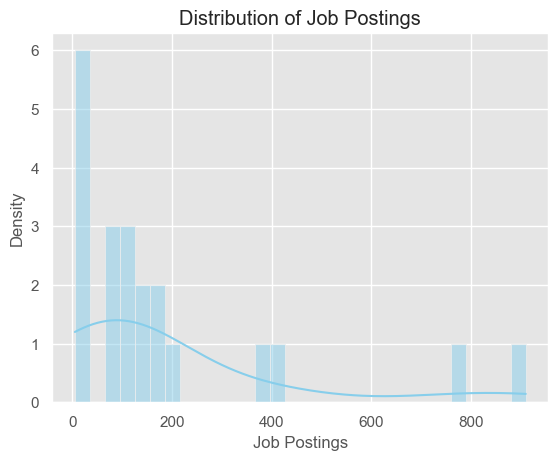

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of job postings
sns.histplot(new_df['JobPostings'], kde=True, bins=30, color='skyblue')

# Add title and axis labels
plt.title('Distribution of Job Postings')
plt.xlabel('Job Postings')
plt.ylabel('Density')

# Display the plot
plt.show()

As can be seen from the distribution graph of the number of job postings, the data shows an obvious right-skewed distribution characteristic, i.e., most of the number of job postings are concentrated in the lower range (e.g., 0-200), while only a small number of extremes occur in the high value region (e.g., above 800). This distribution pattern suggests that job postings are relatively sparse at most time points, with concentrated surges occurring at only a few points in time, which may be related to data collection batches, changes in platform behaviour or special events.

In [30]:
# lets plot the rolling mean and rolling standard deviation of the time series data
new_df['JobPostings']

Published Date
2024-05-14     10
2024-06-13      5
2024-07-13     11
2024-08-12     21
2024-09-11     30
2024-10-11     20
2024-11-10     81
2024-12-10     75
2025-01-09     96
2025-02-08    143
2025-03-10    387
2025-03-12     72
2025-03-19    401
2025-03-26    765
2025-04-02    910
2025-04-03    110
2025-04-04    184
2025-04-05    179
2025-04-06    206
2025-04-07    138
2025-04-08    113
Name: JobPostings, dtype: int64

In [31]:
# rolling mean
new_df['JobPostings'].rolling(window=3)

Rolling [window=3,center=False,axis=0,method=single]

In [32]:
# check the rolling mean
rolmean = new_df['JobPostings'].rolling(window=3).mean()
rolmean

Published Date
2024-05-14           NaN
2024-06-13           NaN
2024-07-13      8.666667
2024-08-12     12.333333
2024-09-11     20.666667
2024-10-11     23.666667
2024-11-10     43.666667
2024-12-10     58.666667
2025-01-09     84.000000
2025-02-08    104.666667
2025-03-10    208.666667
2025-03-12    200.666667
2025-03-19    286.666667
2025-03-26    412.666667
2025-04-02    692.000000
2025-04-03    595.000000
2025-04-04    401.333333
2025-04-05    157.666667
2025-04-06    189.666667
2025-04-07    174.333333
2025-04-08    152.333333
Name: JobPostings, dtype: float64

In [33]:
# lets check the rolling standard deviation
rolstd = new_df['JobPostings'].rolling(window=3).std()
rolstd

Published Date
2024-05-14           NaN
2024-06-13           NaN
2024-07-13      3.214550
2024-08-12      8.082904
2024-09-11      9.504385
2024-10-11      5.507571
2024-11-10     32.715949
2024-12-10     33.620430
2025-01-09     10.816654
2025-02-08     34.818577
2025-03-10    156.218864
2025-03-12    165.228125
2025-03-19    186.038526
2025-03-26    346.647275
2025-04-02    262.234628
2025-04-03    426.233504
2025-04-04    442.069376
2025-04-05     41.356176
2025-04-06     14.364308
2025-04-07     34.239354
2025-04-08     48.128301
Name: JobPostings, dtype: float64

### Plotting Before smoothing

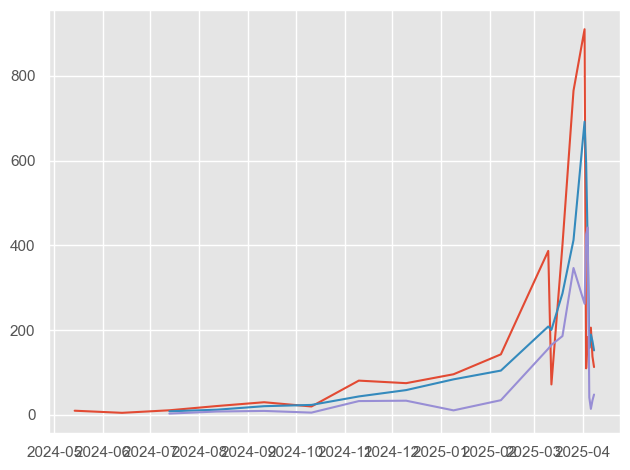

In [34]:
# lets plot those values
plt.plot(new_df.JobPostings)   ##time series data
plt.plot(rolmean)   ## rolling mean
plt.plot(rolstd)      ## rolling std
plt.tight_layout()  # Automatic margin adjustment
plt.show()

### plotting After smoothening

In [35]:
# lets plot after smoothing
rolmean = new_df['JobPostings'].rolling(5).mean()  ## smoothning by changing the rolling mean values

rolstd = new_df['JobPostings'].rolling(5).std()    ## smothning by changing the rolling standard deviation values

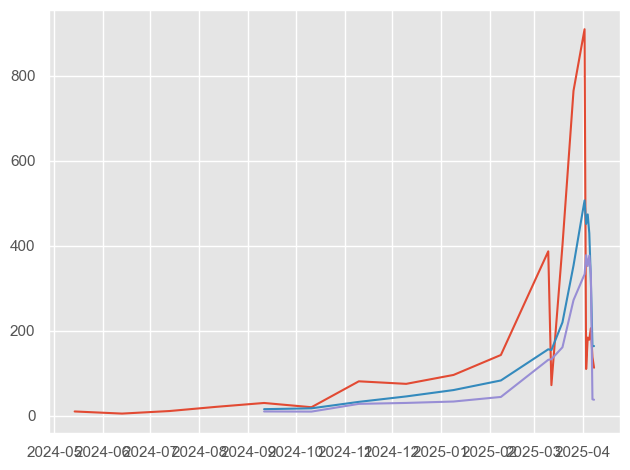

In [36]:
# now plot those values after smoothening
plt.plot(new_df.JobPostings)   ##time series data
plt.plot(rolmean)   ## rolling mean
plt.plot(rolstd)      ## rolling std
plt.tight_layout()  # Automatic margin adjustment
plt.show()

### Stationarity check

In [37]:
# importing the adfuller for checking the stationarity
from statsmodels.tsa.stattools import adfuller
diff_series = new_df['JobPostings'].diff().dropna()
adft = adfuller(diff_series)
adft[0:4]

(-1.322537574476914, 0.618799315618857, 8, 11)

In [38]:
# lets index on adft values
pd.Series(adft[0:4], index= ['test stats', 'P-value', 'lag', 'data points'])

test stats     -1.322538
P-value         0.618799
lag             8.000000
data points    11.000000
dtype: float64

In [39]:
# lets create a function where all stationarity details shuould be present

# Test for staionarity
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(12).mean() # rolling mean
    rolstd = timeseries.rolling(12).std() # rolling standard deviation

    # Plot rolling statistics:
    plt.figure(figsize = (18,8))
    plt.grid('both')
    plt.plot(timeseries, color='blue',label='Original', linewidth = 3)
    plt.plot(rolmean, color='red', label='Rolling Mean',linewidth = 3)
    plt.plot(rolstd, color='black', label = 'Rolling Std',linewidth = 4)
    plt.legend(loc='best', fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
    plt.title('Rolling Mean and Standard Deviation', fontsize = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show(block=False)

    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)

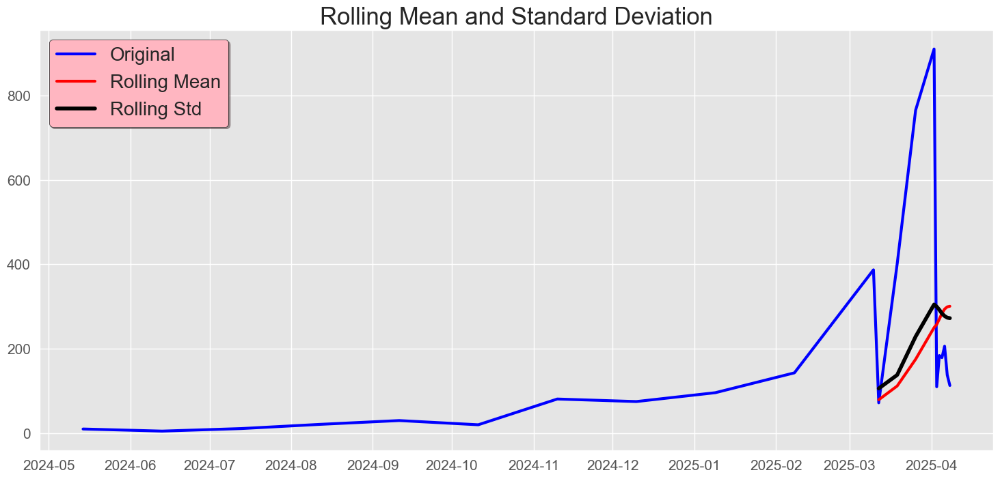

Results of dickey fuller test
Test Statistics                -2.298453
p-value                         0.172468
No. of lags used                8.000000
Number of observations used    12.000000
critical value (1%)            -4.137829
critical value (5%)            -3.154972
critical value (10%)           -2.714477
dtype: float64


In [40]:
# Lets test for stationarity
test_stationarity(new_df.JobPostings)

1. Blue line - Original data.
- During the period May 2024-October 2024, the raw data remained at a low level, with values close to zero and very little fluctuation, indicating that the observed indicators were at a very stable low level during this period.
From October 2024 onwards, the raw data gradually increased, indicating an increasing trend in the indicator.
Between February and March 2025, the raw data fluctuates dramatically, especially towards March 2025, when the values rise sharply to extreme highs and then fall sharply, indicating instability and large variations in the data over this time period.
2. Red Line - Rolling Mean
- The Rolling Mean is a curve obtained by averaging the raw data over a certain time window. Its role is to smooth the raw data, reduce the impact of short-term fluctuations and reflect the long-term trend of the data.
In the early part of the period, the rolling average is similar to the raw data and is at a lower level, and as the raw data starts to rise from October 2024, the rolling average rises slowly.
During the February - March 2025 period when the raw data fluctuated dramatically, the change in the rolling average was relatively flat. This is because the rolling average is the result of averaging multiple data points, which has a smoothing effect on the extremes of the raw data, making the trend more stable and discernible, demonstrating its ability to filter out noise and highlight trends.
3. Black Line - Rolling Standard Deviation (Rolling Std)
- The Rolling Std measures the degree of dispersion or volatility of the raw data within a certain time window.
Low and relatively stable rolling standard deviation values in the early part of the period indicate that the data is less discrete and more concentrated in the early part of the period.
As time progresses, especially during the period of severe fluctuations in the raw data in February - March 2025, the rolling standard deviation increases significantly, indicating that the degree of dispersion of the raw data has increased significantly during this period, with larger differences between data points and increased fluctuations.

In [41]:
# smoothening on linkedin data

# lets create a function where all stationarity details shuould be present

# Test for staionarity
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(6).mean() # rolling mean
    rolstd = timeseries.rolling(6).std() # rolling standard deviation

    # Plot rolling statistics:
    plt.figure(figsize = (18,8))
    plt.grid('both')
    plt.plot(timeseries, color='blue',label='Original', linewidth = 3)
    plt.plot(rolmean, color='red', label='Rolling Mean',linewidth = 3)
    plt.plot(rolstd, color='black', label = 'Rolling Std',linewidth = 4)
    plt.legend(loc='best', fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
    plt.title('Rolling Mean and Standard Deviation', fontsize = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show(block=False)

    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)

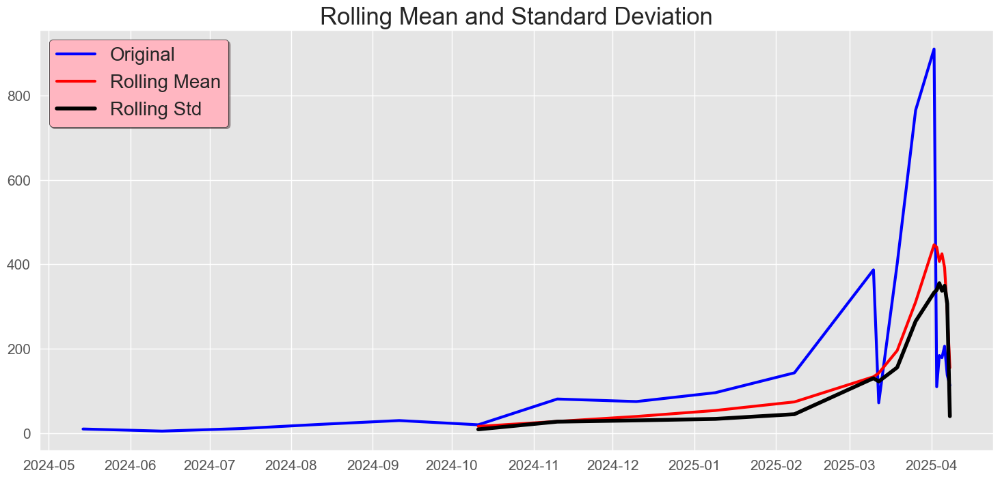

Results of dickey fuller test
Test Statistics                -2.298453
p-value                         0.172468
No. of lags used                8.000000
Number of observations used    12.000000
critical value (1%)            -4.137829
critical value (5%)            -3.154972
critical value (10%)           -2.714477
dtype: float64


In [42]:
# performing the stationaruty test on our linkedin data
test_stationarity(new_df.JobPostings)

### Time series Decomposition

In [43]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(new_df[['JobPostings']], period= 3)
result

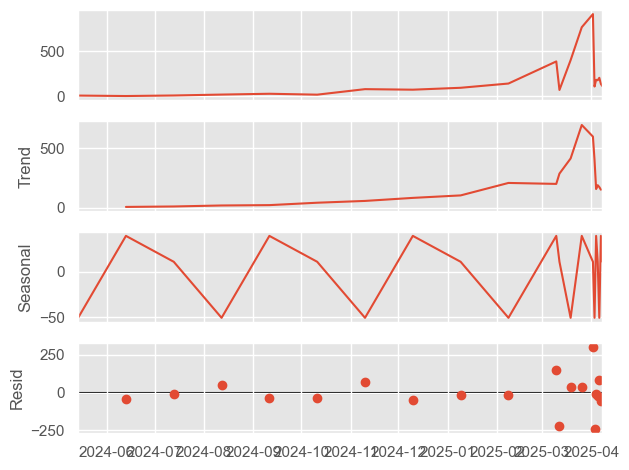

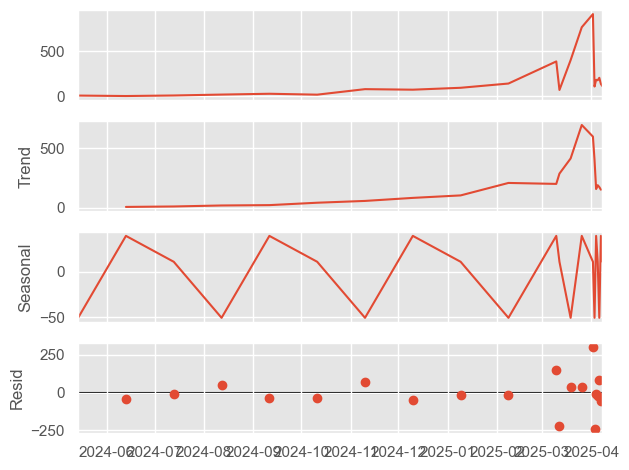

In [44]:
# plot the result
result.plot()

As can be seen from the figure, the time series decomposition model fits the data better in the early period, with small and stable residuals; however, the explanatory power of the model decreases in early 2025

 Observation
-  Here we got two plots: one for additive and second for multiplicative, we can go with one also but default this
go will both perametter, we can chage it with our conviniant.

-  We also check seperatly the trend, seasonl, resid values with graph

### ACF AND PACF

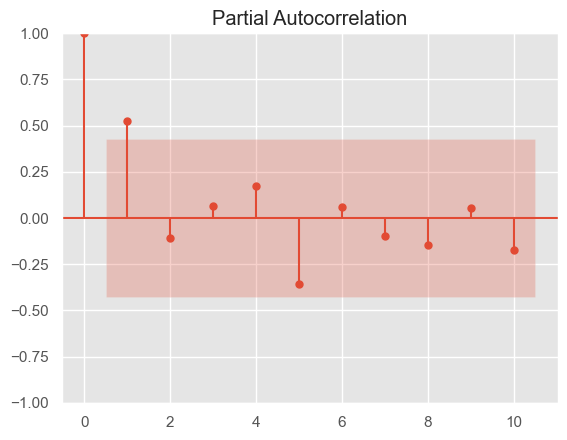

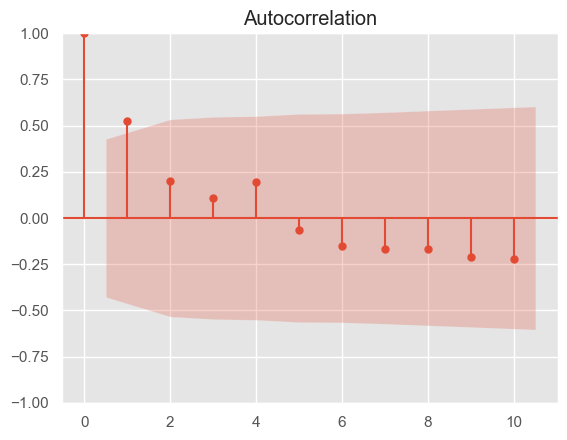

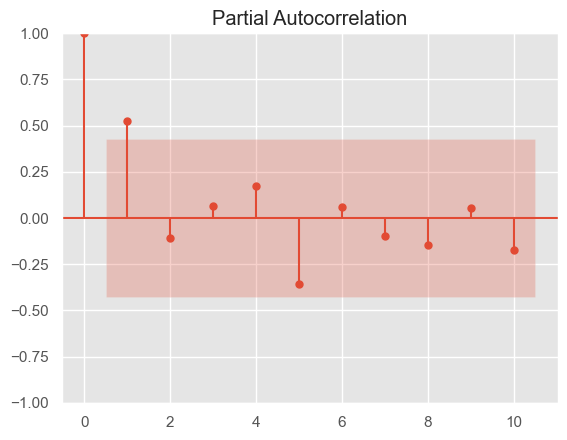

In [45]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(new_df.JobPostings)
plot_pacf(new_df.JobPostings)

- Autocorrelation： In the given plot of the autocorrelation function, we see that the autocorrelation coefficient is 1 at lag order 0, which is inevitable because a time series is perfectly correlated with itself at the same moment in time. As the lag order increases, the autocorrelation coefficient decreases rapidly, and after a lag order greater than a certain value (roughly after lag order 3 in the graph), the autocorrelation coefficient falls into the red confidence interval. This indicates that after this lag order, the linear correlation between neighbouring observations in the time series becomes insignificant, i.e., after a certain lag order, the linear correlation between the current values of the time series and the more distant past values is weak.
- Partial Autocorrelation: In the plot of the partial autocorrelation function, again the partial autocorrelation coefficient is 1 at a lag order of 0 . At lag order 1, the partial autocorrelation coefficient has a significant non-zero value, which indicates that the current value of the time series has a significant direct linear relationship with the value of the previous period. As the lag order increases further, the partial autocorrelation coefficient decreases and falls into the red confidence interval, indicating that beyond a certain lag order (probably after lag order 3 in the figure), the direct linear correlation between the current value of the time series and the past value of a more distant period becomes insignificant.
- Conclusion: The rapid decay to within the confidence interval shown in the figure is characteristic of a time series that does not have strong long-term autocorrelation, i.e., the current value of the series is mainly influenced by the values of more recent periods and less by the values of more distant periods .

 Preprocessing of the data

- 1. fill the miss(here not required)

- 2. convert data into stationary time series

- 3. if necessary then normalize the data(here not required)

- 4. split the data into train and test

- 5. clean the data by removing the outlier

In [46]:
# non stationary to stationary
df_imp = new_df[['JobPostings']]
df_imp

,JobPostings
Published Date,
2024-05-14,10
2024-06-13,5
2024-07-13,11
2024-08-12,21
2024-09-11,30
2024-10-11,20
2024-11-10,81
2024-12-10,75
2025-01-09,96


In [47]:
df_imp.diff(1)      ## changing values in diff

,JobPostings
Published Date,
2024-05-14,NaN
2024-06-13,-5.0
2024-07-13,6.0
2024-08-12,10.0
2024-09-11,9.0
2024-10-11,-10.0
2024-11-10,61.0
2024-12-10,-6.0
2025-01-09,21.0


In [48]:
df_imp = df_imp.diff()
df_imp = df_imp.dropna()

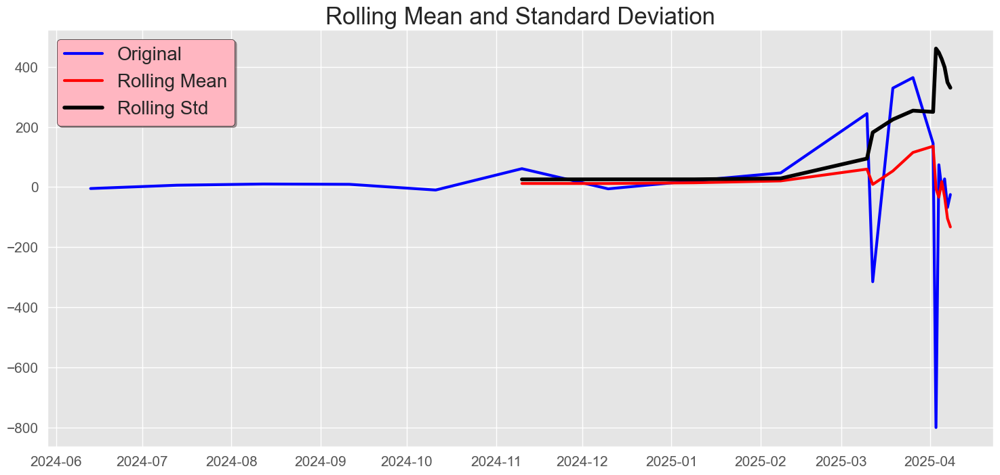

Results of dickey fuller test
Test Statistics                -1.322538
p-value                         0.618799
No. of lags used                8.000000
Number of observations used    11.000000
critical value (1%)            -4.223238
critical value (5%)            -3.189369
critical value (10%)           -2.729839
dtype: float64


In [49]:
from statsmodels.tsa.stattools import adfuller

# now passing df-imp data into test-stationary function
test_stationarity(df_imp)

In [50]:
# train test split our data
df_imp[0:-10]   ##training data

,JobPostings
Published Date,
2024-06-13,-5.0
2024-07-13,6.0
2024-08-12,10.0
2024-09-11,9.0
2024-10-11,-10.0
2024-11-10,61.0
2024-12-10,-6.0
2025-01-09,21.0
2025-02-08,47.0


In [51]:
df_imp[-10:]   ##testing data

,JobPostings
Published Date,
2025-03-12,-315.0
2025-03-19,329.0
2025-03-26,364.0
2025-04-02,145.0
2025-04-03,-800.0
2025-04-04,74.0
2025-04-05,-5.0
2025-04-06,27.0
2025-04-07,-68.0


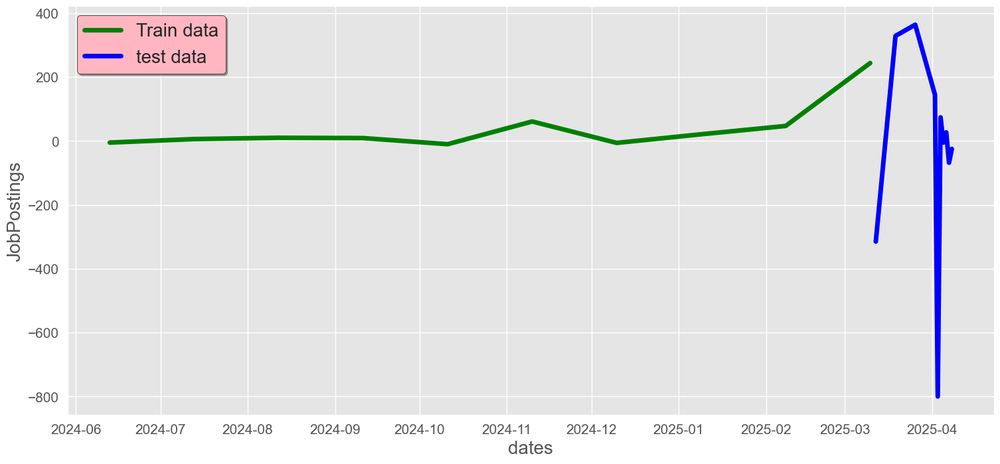

In [52]:
##ploting the train test splitted data into graph

# split data into train and testing data
train_data = df_imp[0:-10]
test_data = df_imp[-10:]
plt.figure(figsize= (18,8))
plt.grid(True)
plt.xlabel('dates', fontsize = 20 )
plt.ylabel('JobPostings', fontsize = 20)
plt.xticks(fontsize = 15 )
plt.yticks(fontsize = 15 )
plt.plot(train_data, 'green', label = 'Train data', linewidth = 5)
plt.plot(test_data, 'blue', label = 'test data', linewidth = 5)
plt.legend(fontsize = 20, shadow = True, facecolor = 'lightpink', edgecolor = 'k')

### Model Building

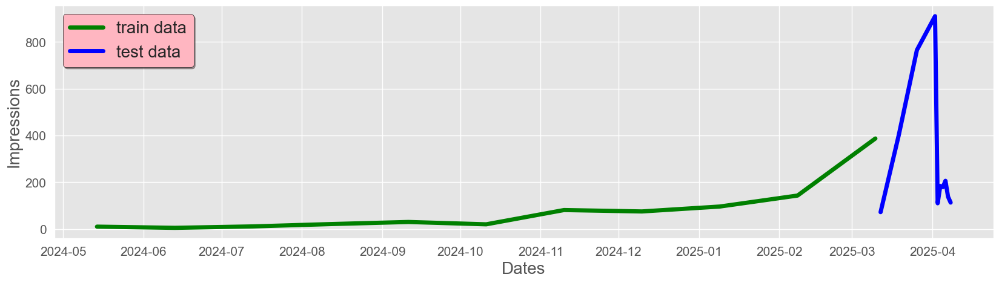

In [53]:
train_data = new_df['JobPostings'][0:-10]       ##train data
test_data = new_df['JobPostings'][-10:]           ## testing data
plt.figure(figsize=(20,5))
plt.grid(True)
plt.xlabel('Dates', fontsize = 20)
plt.ylabel('Impressions', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.plot(train_data, 'green', label = 'train data', linewidth = 5)
plt.plot(test_data, 'blue', label = 'test data', linewidth = 5)
plt.legend(fontsize = 20, shadow = True, facecolor = 'lightpink', edgecolor = 'k')

In [54]:
 new_df[['JobPostings']]

,JobPostings
Published Date,
2024-05-14,10
2024-06-13,5
2024-07-13,11
2024-08-12,21
2024-09-11,30
2024-10-11,20
2024-11-10,81
2024-12-10,75
2025-01-09,96


In [55]:
# importing the libraries
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

In [56]:
train_data

Published Date
2024-05-14     10
2024-06-13      5
2024-07-13     11
2024-08-12     21
2024-09-11     30
2024-10-11     20
2024-11-10     81
2024-12-10     75
2025-01-09     96
2025-02-08    143
2025-03-10    387
Name: JobPostings, dtype: int64

In [57]:
history = [x for x in train_data]

In [58]:
# passing train data into the arima model
model = ARIMA(history, order= (1,1,1) )  ## p,d,q Values == lags values

In [59]:
model = model.fit()  # fitting the model

C:\Users\王晓琴\AppData\Roaming\Python\Python312\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


In [60]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   11
Model:                 ARIMA(1, 1, 1)   Log Likelihood                 -57.445
Date:                Tue, 20 May 2025   AIC                            120.890
Time:                        11:01:10   BIC                            121.798
Sample:                             0   HQIC                           119.895
                                 - 11                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7422      1.771      0.419      0.675      -2.729       4.213
ma.L1         -0.1260      3.006     -0.042      0.967      -6.017       5.765
sigma2      5377.9775   2826.857      1.902      0.057    -162.561    1.09e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 9.23
Prob(Q):                              1.00   Prob(JB):                         0.01
Heteroskedasticity (H):             322.22   Skew:                             1.89
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.79
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Now we want to Forecast the Next values

In [61]:
model.forecast()

array([541.20277142])

In [62]:
# getting the MSE values
mean_squared_error([test_data[2]], model.forecast())

C:\Users\王晓琴\AppData\Local\Temp\ipykernel_13008\4138536501.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  mean_squared_error([test_data[2]], model.forecast())


50085.19952080428

In [63]:
# getting the RMSE value
np.sqrt(mean_squared_error([test_data[2]], model.forecast()))

C:\Users\王晓琴\AppData\Local\Temp\ipykernel_13008\4119278220.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  np.sqrt(mean_squared_error([test_data[2]], model.forecast()))


223.79722858159857

In [64]:
def train_arima_model(X, y, arima_order):
    history = [x for x in X]  ## prepare training dataset
    predictions = list()     ## make prediction list

    for t in range(len(y)):
        model  = ARIMA(history, order= arima_order)
        model_fit = model.fit()
        yhat  = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(y[t])

    # calculate out of sample error
    rmse = np.sqrt(mean_squared_error(y, predictions))
    return rmse

In [65]:
# evaluate different combinations of p,d,q values for an ARIMA model to get the best order for ARIMA model
def evaluate_models(dataset, test, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float('inf'), None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    rmse = train_arima_model(dataset, test, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    print('ARIMA%s RMSE= %.3f'  %(order, rmse))
                except:
                    continue
    print('Best ARIMA%s RMSE= %.3f'  %(best_cfg, best_score))

In [66]:
import warnings
warnings.filterwarnings('ignore')

p_values = range(0,3)
d_values = range(0,3)
q_values = range(0,3)

evaluate_models(train_data, test_data, p_values, d_values, q_values)

ARIMA(0, 0, 0) RMSE= 336.863
ARIMA(0, 0, 1) RMSE= 322.558
ARIMA(0, 0, 2) RMSE= 349.791
ARIMA(0, 1, 0) RMSE= 318.193
ARIMA(0, 1, 1) RMSE= 352.056
ARIMA(0, 1, 2) RMSE= 392.540
ARIMA(0, 2, 0) RMSE= 495.120
ARIMA(0, 2, 1) RMSE= 369.271
ARIMA(0, 2, 2) RMSE= 432.025
ARIMA(1, 0, 0) RMSE= 338.198
ARIMA(1, 0, 1) RMSE= 340.885
ARIMA(1, 0, 2) RMSE= 354.227
ARIMA(1, 1, 0) RMSE= 368.585
ARIMA(1, 1, 1) RMSE= 375.767
ARIMA(1, 1, 2) RMSE= 373.746
ARIMA(1, 2, 0) RMSE= 496.536
ARIMA(1, 2, 1) RMSE= 400.098
ARIMA(1, 2, 2) RMSE= 379.846
ARIMA(2, 0, 0) RMSE= 374.704
ARIMA(2, 0, 1) RMSE= 387.054
ARIMA(2, 0, 2) RMSE= 366.761
ARIMA(2, 1, 0) RMSE= 414.867
ARIMA(2, 1, 1) RMSE= 435.631
ARIMA(2, 1, 2) RMSE= 405.094
ARIMA(2, 2, 0) RMSE= 488.315
ARIMA(2, 2, 1) RMSE= 460.719
ARIMA(2, 2, 2) RMSE= 474.675
Best ARIMA(0, 1, 0) RMSE= 318.193


In [67]:
# now with best arima values lets create our final model
history = [x for x in train_data]
predictions = list()
conf_list = list()
for t in range(len(test_data)):
    model = ARIMA(history,order=(0,1,2))
    model_fit = model.fit()
    fc = model_fit.forecast(alpha = 0.05)
    predictions.append(fc)
    history.append(test_data[t])
print('RMSE of ARIMA Model:', np.sqrt(mean_squared_error(test_data, predictions)))

RMSE of ARIMA Model: 392.5398943951022


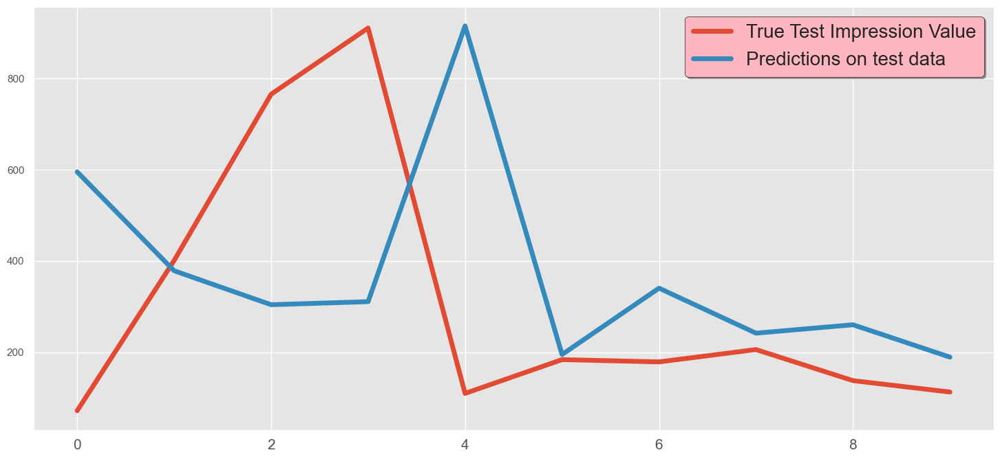

In [68]:
# now plotting the predicted data

plt.figure(figsize=(18,8))
plt.grid(True)
plt.plot(range(len(test_data)),test_data, label = 'True Test Impression Value', linewidth = 5)
plt.plot(range(len(predictions)), predictions, label = 'Predictions on test data', linewidth = 5)
plt.xticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.legend(fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
plt.show()

- Red line: Vigorous fluctuations: The true value curve fluctuates very widely. At the starting point, the true value is at a low level, then rises rapidly to reach a high peak, then falls sharply, rises again to another peak and then falls back sharply, showing obvious instability and randomness. Such sharp fluctuations may reflect many uncertainties in the actual business scenarios, such as sudden changes in the market environment, the impact of unforeseen events or frequent adjustments in business strategies. 
            Trend is hard to find: it is hard to find obvious regularity in terms of the overall trend. The numerical changes in different time periods do not show stable rising, falling or cyclical characteristics, indicating that the real display volume is subject to the combined effect of many complex factors, and it is difficult to accurately describe its changing law with a simple model.
- Blue line: Relatively smooth: the curve of predicted values is relatively smooth, with significantly smaller fluctuations than the true values. At the starting point, the predicted value is relatively high, then gradually decreases, with some small fluctuations in the middle part, but the overall trend is more moderate. This suggests that the prediction model may be deficient in capturing dramatic changes in the data and tends to give relatively smooth predictions. At some points in time, the predicted values deviate significantly from the true values. For example, during phases of sharp increases and decreases in the true values, the predicted values fail to keep up with the changes in a timely manner, and there is a certain lag. This indicates that the model performs poorly in coping with rapid changes in data, and may not be able to accurately capture key factors and contingencies that affect changes in display volume.
- Conclusion: The performance of the forecasting model may be somewhat problematic. The model does not fit the fluctuations in the real data well, especially during time periods when the data change dramatically.

In [69]:
# now convert forecast values into series
fc_series = pd.Series(predictions, index= test_data.index)

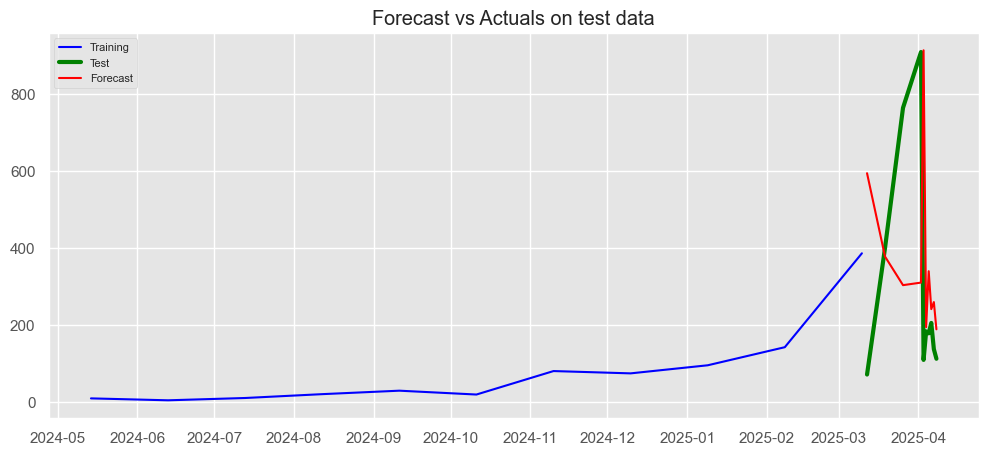

In [70]:
# now plot the fc-series
# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train_data, label='Training', color = 'blue')
plt.plot(test_data, label='Test', color = 'green', linewidth = 3)
plt.plot(fc_series, label='Forecast', color = 'red')
plt.title('Forecast vs Actuals on test data')
plt.legend(loc='upper left', fontsize=8)
plt.show()

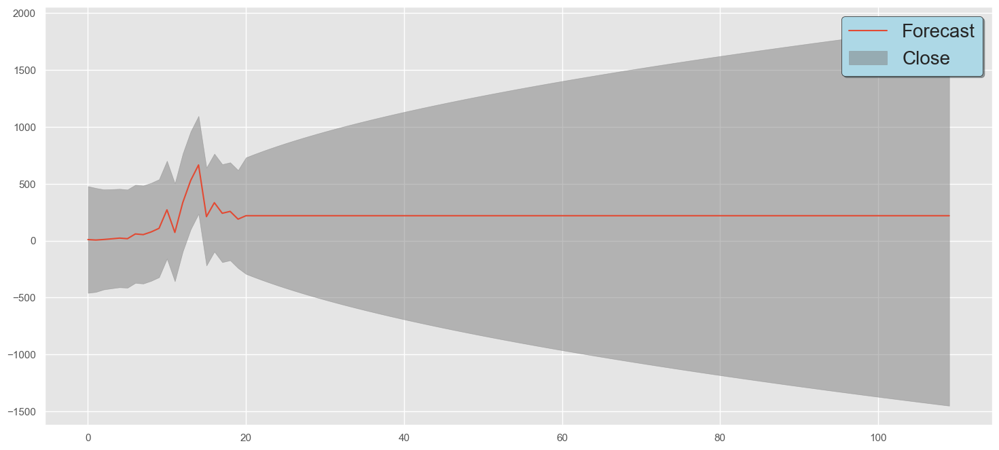

In [71]:
# now ploting  forecaset the next 90 days future values in the plot
from statsmodels.graphics.tsaplots import plot_predict
fig = plt.figure(figsize=(18,8))
ax1 = fig.add_subplot(111)
plot_predict(result=model_fit,start=1, end=len(df_imp)+90, ax = ax1)
plt.grid("both")
plt.legend(['Forecast','Close','95% confidence interval'],fontsize = 20, shadow=True,facecolor='lightblue',edgecolor = 'k')
plt.show()

- Red line: Pre-period fluctuations: in the beginning part of the left side of the graph, the forecasts show some fluctuations with upward and downward changes. This indicates that in the early period, the model's prediction of the time series captures some dynamic features of the data, but the fluctuation is relatively small. Smooth in the later period: as time advances, the forecasts level off and remain almost on a horizontal line. This may mean that the model believes that after the fluctuations in the early period, the time series has entered a relatively stable state, and there will not be much fluctuation in the future trend of change. From a professional point of view, if the forecast is based on a time series model (e.g. ARIMA, etc.), this smooth state may be a judgement made by the model based on the historical data patterns that have been learnt, e.g. the model believes that factors such as the trend and seasonality of the time series will no longer change significantly at a later stage.
- Close: Higher fluctuations in the preceding period: On the left side of the figure, the grey shaded area has a higher range of fluctuations and the upper and lower boundaries are farther apart, indicating that the actual values have a higher degree of uncertainty and variability in the preceding period. This may reflect the fact that the actual phenomenon represented by the time series is affected by a variety of complex factors in the early period, resulting in frequent and wide range of fluctuations in the values. Posterior divergence: as time advances to the right, the grey shaded area gradually becomes wider, showing a tendency to diverge. This indicates that the model's uncertainty estimate of future actual values is increasing, i.e., the model believes that the range of possible actual values is getting wider and wider over time, making it difficult to predict accurately. Statistically, this may be explained by the gradual accumulation of the model's prediction error as the prediction period lengthens, leading to wider and wider estimates of the range of actual values.
- Conclusion: As can be seen from the figure, the model is able to follow the fluctuations of the actual values to a certain extent in the early stages, but in the later stages, the smoothness of the predicted values contrasts with the dispersion of the range of the actual values, which indicates the limitations of the model in long-term prediction.

### SARIMA

In [72]:
# evaluate parameters for sarimax
import warnings
warnings.filterwarnings('ignore')

history = [x for x in train_data]
predictions = list()
conf_list = list()
for t in range(len(test_data)):
    model = sm.tsa.statespace.SARIMAX(history, order = (0,1,0), seasonal_order = (1,1,1,3))
    model_fit = model.fit()
    fc = model_fit.forecast()
    predictions.append(fc)
    history.append(test_data[t])
print('RMSE of SARIMA Model:', np.sqrt(mean_squared_error(test_data, predictions)))

RMSE of SARIMA Model: 467.8355735259233


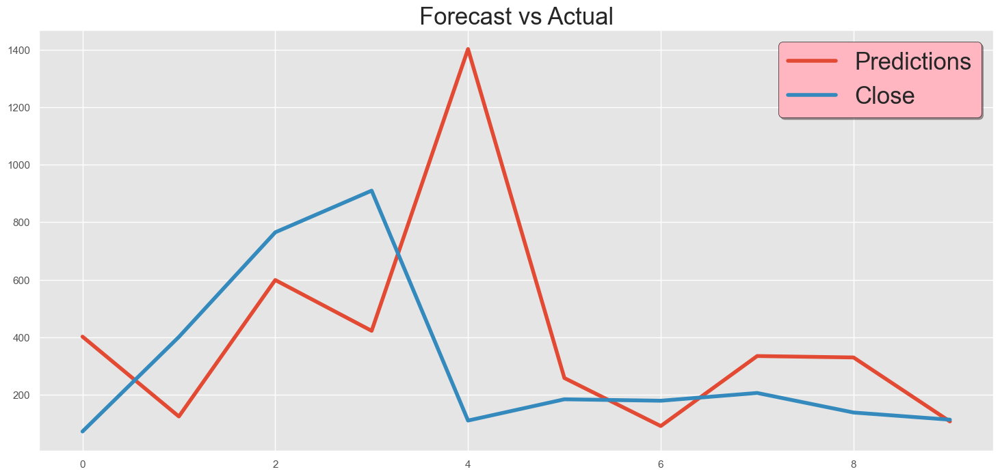

In [73]:
plt.figure(figsize=(18,8))
plt.title('Forecast vs Actual', fontsize = 25)
plt.plot(range(10), predictions, label = 'Predictions', linewidth = 4)
plt.plot(range(10), test_data, label = 'Close', linewidth = 4)
plt.legend(fontsize = 25, shadow=True,facecolor='lightpink',edgecolor = 'k')

## 1.3 Analysis hard skills and soft skills of Data Science

### 1.3.1 Analysis hard skills 

In [74]:
#读取数据
file_path = r"C:\Users\王晓琴\processed_jobs.xlsx"
df = pd.read_excel(file_path, engine="openpyxl")

# Let's collect some most common technical skills
# The technical_skills list contains a collection of technical skills.
# technical_skills = ['PYTHON', 'C++', 'JAVA', 'HADOOP', 'SCALA', 
#                     'FLASK', 'PANDAS', 'SPARK', 'NUMPY', 
#                     'PHP', 'SQL', 'MYSQL', 'CSS', 'MONGODB', 'NLTK', 'KERAS', 
#                     'PYTORCH', 'TENSORFLOW', 'LINUX', 'RUBY', 'JAVASCRIPT', 
#                     'DJANGO', 'REACT', 'REACTJS', 'AI', 'UI', 'TABLEAU', 
#                     'NODEJS', 'EXCEL', 'POWER BI', 'SELENIUM', 'HTML', 'ML']

technical_skills = [
# PROGRAMMING
'PYTHON', 'SQL',

# DATA WRANGLING & ANALYSIS
'PANDAS', 'NUMPY', 'DASK', 'DATA WRANGLING', 'DATA CLEANING',
'EDA', 'EXPLORATORY DATA ANALYSIS', 'OUTLIER DETECTION',

# STATISTICS & TESTING
'STATISTICS', 'PROBABILITY', 'HYPOTHESIS TESTING', 'A/B TESTING',
'REGRESSION ANALYSIS', 'TIME SERIES ANALYSIS',

# MACHINE LEARNING
'SCIKIT-LEARN', 'XGBOOST', 'LIGHTGBM', 'CATBOOST',
'TENSORFLOW', 'PYTORCH', 'KERAS',
'FEATURE ENGINEERING', 'HYPERPARAMETER TUNING', 'MODEL EVALUATION',

# VISUALIZATION
'MATPLOTLIB', 'SEABORN', 'PLOTLY', 'TABLEAU', 'POWER BI', 'DASH', 'STREAMLIT',

# DATABASES & BIG DATA
'MYSQL', 'POSTGRESQL', 'SQLITE', 'MONGODB', 'CASSANDRA',
'HADOOP', 'HIVE', 'SPARK', 'PYSPARK',

# CLOUD & DEPLOYMENT
'AWS', 'GCP', 'AZURE', 'DOCKER', 'KUBERNETES',
'FLASK', 'FASTAPI', 'CI/CD',

# ML OPS & AUTOMATION
'MLFLOW', 'DVC', 'AIRFLOW', 'GIT',

# OTHERS
'JUPYTER', 'JUPYTER NOTEBOOK', 'MARKDOWN', 'LATEX',
'NLP', 'NATURAL LANGUAGE PROCESSING', 'COMPUTER VISION',
'RECOMMENDATION SYSTEM', 'REINFORCEMENT LEARNING',
]


# Adding above technical_skills into our DataFrame ( filling them with 0 )
# Setting the values of technical skills columns to 0
df[technical_skills] = 0

# Displaying the first few rows of the DataFrame
df.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Job Description Tokenized,PYTHON,SQL,PANDAS,...,GIT,JUPYTER,JUPYTER NOTEBOOK,MARKDOWN,LATEX,NLP,NATURAL LANGUAGE PROCESSING,COMPUTER VISION,RECOMMENDATION SYSTEM,REINFORCEMENT LEARNING
0,Digital Marketer Intern,CTOS,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/digital-mark...,Are you passionate about digital marketing and...,Are you passionate about digital marketing and...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,MySTEP Career Acceleration Programme 2025,Bank Pembangunan Malaysia Berhad,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/mystep-caree...,Elevate Your Banking Career with us! Be part o...,Elevate Your Banking Career with us Be part of...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"Data Analytics & Science Intern, HQ","Love, Bonito","Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/data-analyti...,Are you passionate about using data to solve r...,Are you passionate about using data to solve r...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"Intern, HR Learning Development",ZUS Coffee,"Subang Jaya, Selangor, Malaysia",1 month ago,https://my.linkedin.com/jobs/view/intern-hr-le...,Position ResponsibilitiesTo support the Talent...,Position ResponsibilitiesTo support the Talent...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Internship - Product Management (Mobility) [RI...,Setel,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 week ago,https://my.linkedin.com/jobs/view/internship-p...,About Setel:The Future of MobilityIntroduced i...,About Setel The Future of MobilityIntroduced i...,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [75]:
# Extracting skills(keywords) from job_description coloumn
# We can perform same task with nlptk or keybert libraries
# Exammple of list comprehension
skills = df["Job Description"].str.upper().apply(lambda x: [i.upper() for i in technical_skills if i in x])

In [76]:
skills

0                                                   [GIT]
1                                                      []
2       [PYTHON, SQL, STATISTICS, TENSORFLOW, PYTORCH,...
3                                                      []
4                                                      []
                              ...                        
5132                                    [SQL, MYSQL, GIT]
5133                                                [GIT]
5134    [PYTHON, SQL, HIVE, AWS, AZURE, DOCKER, KUBERN...
5135                    [PYTHON, SQL, EDA, HADOOP, SPARK]
5136                                     [PYTHON, HADOOP]
Name: Job Description, Length: 5137, dtype: object

In [77]:
# Filling our Skills_columns and flaging them with appropriate value
# Setting the values of technical skills columns to 1 based on skill sets
for index, skill_set in enumerate(skills):
    for x in skill_set:
        #df[x][index] = 1
        df.loc[index, x] = 1

In [78]:
df['PYTHON'][0]

0

In [79]:
# Displaying the first few rows of the DataFrame
df.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Job Description Tokenized,PYTHON,SQL,PANDAS,...,GIT,JUPYTER,JUPYTER NOTEBOOK,MARKDOWN,LATEX,NLP,NATURAL LANGUAGE PROCESSING,COMPUTER VISION,RECOMMENDATION SYSTEM,REINFORCEMENT LEARNING
0,Digital Marketer Intern,CTOS,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/digital-mark...,Are you passionate about digital marketing and...,Are you passionate about digital marketing and...,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,MySTEP Career Acceleration Programme 2025,Bank Pembangunan Malaysia Berhad,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/mystep-caree...,Elevate Your Banking Career with us! Be part o...,Elevate Your Banking Career with us Be part of...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"Data Analytics & Science Intern, HQ","Love, Bonito","Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/data-analyti...,Are you passionate about using data to solve r...,Are you passionate about using data to solve r...,1,1,0,...,0,0,0,0,0,0,0,0,0,0
3,"Intern, HR Learning Development",ZUS Coffee,"Subang Jaya, Selangor, Malaysia",1 month ago,https://my.linkedin.com/jobs/view/intern-hr-le...,Position ResponsibilitiesTo support the Talent...,Position ResponsibilitiesTo support the Talent...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Internship - Product Management (Mobility) [RI...,Setel,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 week ago,https://my.linkedin.com/jobs/view/internship-p...,About Setel:The Future of MobilityIntroduced i...,About Setel The Future of MobilityIntroduced i...,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [80]:
# Dropping such skill_column where there is no data!!
# Removing technical skills columns with the same unique value in all rows
for i in technical_skills:
    if len(df[i].unique()) == 1:
        df.drop(i, axis=1, inplace=True)

In [81]:
# Droping the Job Description column
df.drop('Job Description', axis=1, inplace=True)

In [82]:
# Checking for Duplicates
df.duplicated().sum()

0

In [83]:
df.to_excel("processed_jobs_extracted_keywords.xlsx", index=False) 

In [84]:
# Jobs that require Specific particular skill
# Creating a DataFrame for skills count

# Dropping unnecessary columns from the DataFrame
df_skills = df.drop(["Job Title", "Company", "Published Date", "Job Link", "Location", "Job Description Tokenized"], axis=1)

df_skills

,PYTHON,SQL,PANDAS,NUMPY,DASK,DATA WRANGLING,DATA CLEANING,EDA,EXPLORATORY DATA ANALYSIS,STATISTICS,...,GIT,JUPYTER,JUPYTER NOTEBOOK,MARKDOWN,LATEX,NLP,NATURAL LANGUAGE PROCESSING,COMPUTER VISION,RECOMMENDATION SYSTEM,REINFORCEMENT LEARNING
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5132,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5133,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5134,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5135,1,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [85]:
# Initializing an empty dictionary to store skill counts
skill_dic = {}

# Counting the number of jobs requiring each skill
for i in df_skills.columns:
    skill_dic[i] = df[i].sum()

# Converting the dictionary to a list of tuples
data = list(skill_dic.items())

# Creating a DataFrame from the skill count data
skill_df = pd.DataFrame(data, columns=['Skill', 'Number of jobs requiring the skill'])

In [86]:
skill_df

,Skill,Number of jobs requiring the skill
0,PYTHON,825
1,SQL,1033
2,PANDAS,21
3,NUMPY,11
4,DASK,2
5,DATA WRANGLING,1
6,DATA CLEANING,18
7,EDA,211
8,EXPLORATORY DATA ANALYSIS,10
9,STATISTICS,244


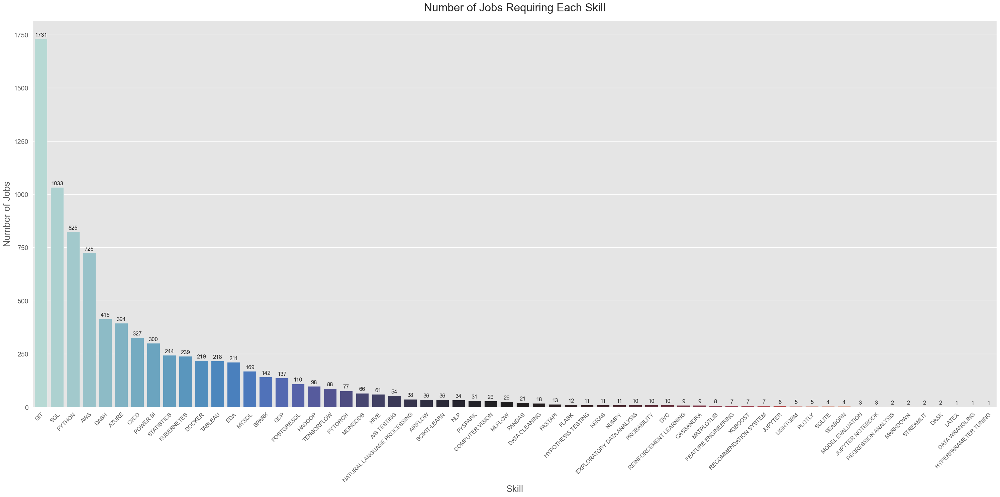

In [87]:
#plt.figure(figsize=(40,20),dpi=100)
#chart = sns.barplot(x=skill_df["Skill"],y=skill_df["Number of jobs requiring the skill"].astype(str),palette="icefire")
#plt.title("Number of jobs that require a particular skill",size=45)
#plt.ylabel("Number of jobs",size=42,rotation=90)
#plt.xlabel("Skill",size=42,rotation=90)
#plt.xticks(fontsize=48,rotation=90)
#plt.yticks(fontsize=48,rotation=90)
#chart.bar_label(chart.containers[0],size=48)
plt.figure(figsize=(30, 15), dpi=100)  # Slightly smaller figure for better proportions

# Convert y-values to numeric if they're strings
skill_df["Number of jobs requiring the skill"] = pd.to_numeric(skill_df["Number of jobs requiring the skill"], errors='coerce')

# Create the plot with adjusted parameters
chart = sns.barplot(
    x="Skill",
    y="Number of jobs requiring the skill",
    data=skill_df,
    palette="icefire",
    order=skill_df.sort_values("Number of jobs requiring the skill", ascending=False)["Skill"]
)

# Title and labels with improved formatting
plt.title("Number of Jobs Requiring Each Skill", size=24, pad=20)
plt.ylabel("Number of Jobs", size=20)
plt.xlabel("Skill", size=20)

# Rotate x-axis labels for better readability
chart.set_xticklabels(
    chart.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=12,
    rotation_mode='anchor'
)

# Adjust y-axis ticks
plt.yticks(fontsize=14)

# Add value labels on bars with improved formatting
for container in chart.containers:
    chart.bar_label(
        container,
        fmt='%.0f',
        label_type='edge',
        padding=3,
        fontsize=12,
        rotation=0
    )

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show plot
plt.show()

Statistically, the demand for skills in data science and machine learning roles shows a clear structure. git (1731), SQL (1033) and Python (825) are the most core general-purpose technologies, demonstrating their foundational place in data workflows. high demand for cloud platforms, such as AWS (726) and Azure (394), suggests that organisations are are increasingly focusing on cloud-based deployments and computing power.

In terms of data visualisation, Power BI (300), Dash (415) and Tableau (218) were used more frequently, highlighting the importance of data presentation and communication in enterprise decision-making. Meanwhile, the frequent presence of EDA (211) and Statistics (244) shows that basic data analysis capabilities are still highly valued. In contrast, the low frequency of libraries such as Pandas (21) and Numpy (11) may indicate that organisations place more emphasis on the effectiveness of the application of skills than the mastery of the tools themselves.

Although deep learning frameworks such as TensorFlow (88) and PyTorch (77) have penetrated the industry to some extent, the low frequency of key modelling skills such as model tuning engagement evaluation suggests that companies value the ability to use tools more than in-depth algorithmic understanding.

Conclusion: The skills that employers most urgently need job seekers to master at present include Git, SQL, Python, cloud platforms (especially AWS), data visualisation tools (such as Power BI, Tableau), statistical analysis capabilities, and MLOps-related tools (such as CI/CD, Docker, Kubernetes), and this kind of comprehensive technical ability are becoming core competencies for data science positions.

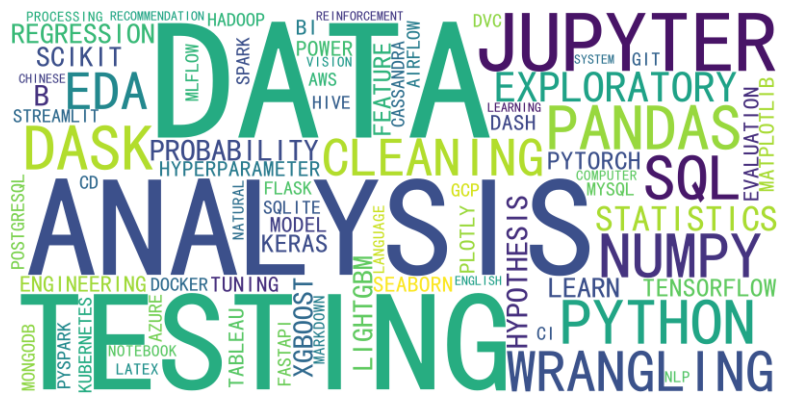

In [88]:
from docx import Document
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Read content from a Word document
def read_docx_file(file_path):
    doc = Document(file_path)
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return "\n".join(full_text)

# Example usage
file_path = 'tmp_hard.docx'  # Replace with your Word document path
text = read_docx_file(file_path)

# Specify the font path that supports Chinese (adjust as needed)
font_path = 'simhei.ttf'  # Make sure the path to your font is correct

# Generate the word cloud with specified font
wordcloud = WordCloud(font_path=font_path, width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Save the word cloud as an image
wordcloud.to_file('wordcloud_hard.png')

This word cloud visualises the key terms associated with the field of data science. ‘DATA ANALYSIS’ is highlighted in a larger font, signalling its centrality to the field and emphasising the importance of collecting, processing and interpreting data to obtain valuable information. The words ‘PYTHON’, ‘PANDAS’, and ‘JUPYTER’ surrounding it reflect the widespread use of Python in data processing and analysis. programming language is widely used, Jupyter as a common development environment, and Pandas for data processing and analysis, reflecting the support at the tool level.

### 1.3.2 Analysis soft skills

In [89]:
file_path = r"C:\Users\王晓琴\processed_jobs.xlsx"
df = pd.read_excel(file_path, engine="openpyxl")

# Let's collect some most common technical skills
# The technical_skills list contains a collection of technical skills.
# technical_skills = ['PYTHON', 'C++', 'JAVA', 'HADOOP', 'SCALA', 
#                     'FLASK', 'PANDAS', 'SPARK', 'NUMPY', 
#                     'PHP', 'SQL', 'MYSQL', 'CSS', 'MONGODB', 'NLTK', 'KERAS', 
#                     'PYTORCH', 'TENSORFLOW', 'LINUX', 'RUBY', 'JAVASCRIPT', 
#                     'DJANGO', 'REACT', 'REACTJS', 'AI', 'UI', 'TABLEAU', 
#                     'NODEJS', 'EXCEL', 'POWER BI', 'SELENIUM', 'HTML', 'ML']
soft_skills = [
    "COMMUNICATION", "TEAMWORK", "COLLABORATION", "PROBLEM SOLVING", "CRITICAL THINKING", "CREATIVITY", "ADAPTABILITY", "CURIOSITY", "EMPATHY",
    "TIME MANAGEMENT", "PROJECT MANAGEMENT", "LEADERSHIP", "EMOTIONAL INTELLIGENCE", "PRESENTATION", "NEGOTIATION", "INTERPERSONAL SKILLS",
    "STORYTELLING", "DECISION MAKING", "ACCOUNTABILITY", "ACTIVE LISTENING", "CONFLICT RESOLUTION", "GROWTH MINDSET", "STRATEGIC THINKING",
    "STAKEHOLDER MANAGEMENT", "RESILIENCE", "OPEN-MINDEDNESS", "INFLUENCING", "SELF-MOTIVATION", "INITIATIVE", "AGILITY",
    "MULTITASKING", "LEARNING AGILITY", "CROSS-FUNCTIONAL COMMUNICATION", "ANALYTICAL THINKING", "DETAIL ORIENTATION", "WORK ETHIC",
    "RESPONSIBILITY", "COLLABORATION WITH NON-TECHNICAL TEAMS", "FLEXIBILITY", "DIPLOMACY", "MENTORING", "FACILITATION",
    "CONSENSUS BUILDING", "BUSINESS COMMUNICATION", "PROFESSIONALISM", "CONFIDENCE", "RESPECTFULNESS", "FEEDBACK HANDLING",
    "DELEGATION", "TRUST BUILDING", "CULTURAL AWARENESS", "ORGANIZATIONAL SKILLS", "TASK PRIORITIZATION", "EXPECTATION MANAGEMENT",
    "CLIENT-FACING SKILLS", "NETWORKING", "PERSUASIVENESS", "RELATIONSHIP BUILDING", "CHANGE MANAGEMENT", "COACHING", "DECISION SUPPORT",
    "GOAL SETTING", "MOTIVATIONAL SKILLS", "PATIENCE", "ACCOUNT MANAGEMENT", "TEAM EMPOWERMENT", "USER EMPATHY", "INTERVIEWING SKILLS",
    "PEER REVIEW SKILLS", "CONSTRUCTIVE FEEDBACK", "REMOTE COLLABORATION", "VIRTUAL COMMUNICATION", "PERSUASIVE WRITING", "MEETING FACILITATION",
    "VISION SETTING", "EMPOWERMENT", "WORK-LIFE BALANCE AWARENESS", "NONVERBAL COMMUNICATION", "FOCUS MANAGEMENT", "PROCESS THINKING",
    "SENSEMAKING", "DIPLOMATIC COMMUNICATION", "SUPPORTIVENESS", "ETHICAL JUDGEMENT", "CONSENSUS THINKING", "COLLABORATIVE PLANNING",
    "TRANSPARENCY"
]


# Adding above technical_skills into our DataFrame ( filling them with 0 )
# Setting the values of technical skills columns to 0
df[soft_skills] = 0

# Displaying the first few rows of the DataFrame
df.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Job Description Tokenized,COMMUNICATION,TEAMWORK,COLLABORATION,...,NONVERBAL COMMUNICATION,FOCUS MANAGEMENT,PROCESS THINKING,SENSEMAKING,DIPLOMATIC COMMUNICATION,SUPPORTIVENESS,ETHICAL JUDGEMENT,CONSENSUS THINKING,COLLABORATIVE PLANNING,TRANSPARENCY
0,Digital Marketer Intern,CTOS,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/digital-mark...,Are you passionate about digital marketing and...,Are you passionate about digital marketing and...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,MySTEP Career Acceleration Programme 2025,Bank Pembangunan Malaysia Berhad,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/mystep-caree...,Elevate Your Banking Career with us! Be part o...,Elevate Your Banking Career with us Be part of...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"Data Analytics & Science Intern, HQ","Love, Bonito","Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/data-analyti...,Are you passionate about using data to solve r...,Are you passionate about using data to solve r...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"Intern, HR Learning Development",ZUS Coffee,"Subang Jaya, Selangor, Malaysia",1 month ago,https://my.linkedin.com/jobs/view/intern-hr-le...,Position ResponsibilitiesTo support the Talent...,Position ResponsibilitiesTo support the Talent...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Internship - Product Management (Mobility) [RI...,Setel,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 week ago,https://my.linkedin.com/jobs/view/internship-p...,About Setel:The Future of MobilityIntroduced i...,About Setel The Future of MobilityIntroduced i...,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [90]:
# Extracting skills(keywords) from job_description coloumn
# We can perform same task with nlptk or keybert libraries
# Exammple of list comprehension
skills_2 = df["Job Description"].str.upper().apply(lambda x: [i.upper() for i in soft_skills if i in x])

In [91]:
skills_2

0                                 [CREATIVITY, CURIOSITY]
1                                            [CONFIDENCE]
2                                            [INITIATIVE]
3                     [COMMUNICATION, PROJECT MANAGEMENT]
4       [COMMUNICATION, COLLABORATION, INTERPERSONAL S...
                              ...                        
5132                                                   []
5133    [LEADERSHIP, INITIATIVE, RESPONSIBILITY, COACH...
5134             [LEADERSHIP, RESILIENCE, RESPONSIBILITY]
5135    [COLLABORATION, CREATIVITY, EMPATHY, DECISION ...
5136    [COLLABORATION, CREATIVITY, EMPATHY, LEADERSHI...
Name: Job Description, Length: 5137, dtype: object

In [92]:
# Filling our Skills_columns and flaging them with appropriate value
# Setting the values of technical skills columns to 1 based on skill sets
for index, skill_set in enumerate(skills_2):
    for x in skill_set:
        #df[x][index] = 1
        df.loc[index, x] = 1

In [93]:
df["COMMUNICATION"][0]

0

In [94]:
# Displaying the first few rows of the DataFrame
df.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Job Description Tokenized,COMMUNICATION,TEAMWORK,COLLABORATION,...,NONVERBAL COMMUNICATION,FOCUS MANAGEMENT,PROCESS THINKING,SENSEMAKING,DIPLOMATIC COMMUNICATION,SUPPORTIVENESS,ETHICAL JUDGEMENT,CONSENSUS THINKING,COLLABORATIVE PLANNING,TRANSPARENCY
0,Digital Marketer Intern,CTOS,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/digital-mark...,Are you passionate about digital marketing and...,Are you passionate about digital marketing and...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,MySTEP Career Acceleration Programme 2025,Bank Pembangunan Malaysia Berhad,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/mystep-caree...,Elevate Your Banking Career with us! Be part o...,Elevate Your Banking Career with us Be part of...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"Data Analytics & Science Intern, HQ","Love, Bonito","Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/data-analyti...,Are you passionate about using data to solve r...,Are you passionate about using data to solve r...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"Intern, HR Learning Development",ZUS Coffee,"Subang Jaya, Selangor, Malaysia",1 month ago,https://my.linkedin.com/jobs/view/intern-hr-le...,Position ResponsibilitiesTo support the Talent...,Position ResponsibilitiesTo support the Talent...,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Internship - Product Management (Mobility) [RI...,Setel,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 week ago,https://my.linkedin.com/jobs/view/internship-p...,About Setel:The Future of MobilityIntroduced i...,About Setel The Future of MobilityIntroduced i...,1,0,1,...,0,0,0,0,0,0,0,0,0,0


In [95]:
# Dropping such skill_column where there is no data!!
# Removing technical skills columns with the same unique value in all rows
for i in soft_skills:
    if len(df[i].unique()) == 1:
        df.drop(i, axis=1, inplace=True)

In [96]:
# Droping the Job Description column
df.drop('Job Description', axis=1, inplace=True)

In [97]:
# Checking for Duplicates
df.duplicated().sum()

0

In [98]:
df.to_excel("soft_skills_extracted_keywords.xlsx", index=False) 

In [99]:
# Jobs that require Specific particular skill
# Creating a DataFrame for skills count

# Dropping unnecessary columns from the DataFrame
df_skills_2 = df.drop(["Job Title", "Company", "Published Date", "Job Link", "Location", "Job Description Tokenized"], axis=1)

df_skills_2

,COMMUNICATION,TEAMWORK,COLLABORATION,PROBLEM SOLVING,CRITICAL THINKING,CREATIVITY,ADAPTABILITY,CURIOSITY,EMPATHY,TIME MANAGEMENT,...,DECISION SUPPORT,GOAL SETTING,PATIENCE,ACCOUNT MANAGEMENT,USER EMPATHY,INTERVIEWING SKILLS,CONSTRUCTIVE FEEDBACK,REMOTE COLLABORATION,EMPOWERMENT,TRANSPARENCY
0,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5132,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5133,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5134,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5135,0,0,1,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [100]:
# Initializing an empty dictionary to store skill counts
skill_dic = {}
# Counting the number of jobs requiring each skill
for i in df_skills_2.columns:
    skill_dic[i] = df[i].sum()

# Converting the dictionary to a list of tuples
data = list(skill_dic.items())

# Creating a DataFrame from the skill count data
skill_df = pd.DataFrame(data, columns=['Skill', 'Number of jobs requiring the skill'])


In [101]:
skill_df

,Skill,Number of jobs requiring the skill
0,COMMUNICATION,3294
1,TEAMWORK,418
2,COLLABORATION,1227
3,PROBLEM SOLVING,296
4,CRITICAL THINKING,152
...,...,...
60,INTERVIEWING SKILLS,1
61,CONSTRUCTIVE FEEDBACK,52
62,REMOTE COLLABORATION,1
63,EMPOWERMENT,64


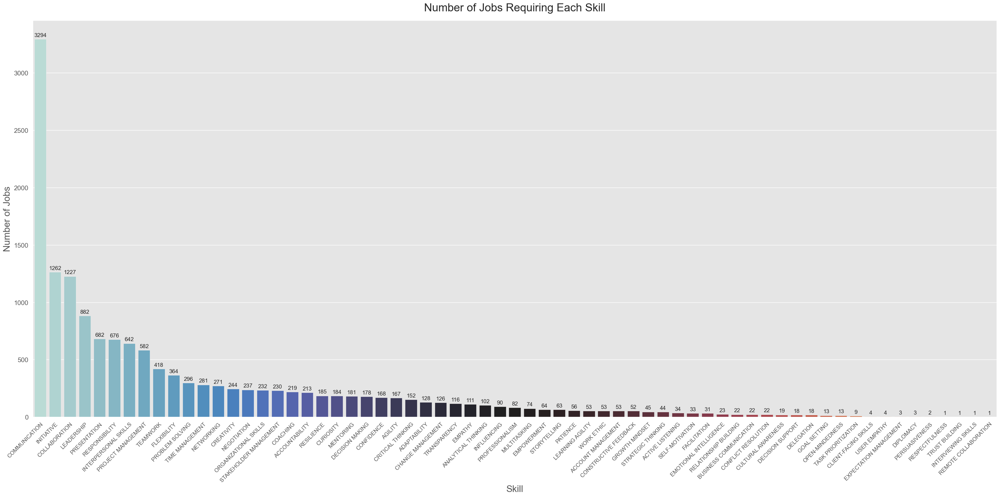

In [102]:
#plt.figure(figsize=(40,20),dpi=100)
#chart = sns.barplot(x=skill_df["Skill"],y=skill_df["Number of jobs requiring the skill"].astype(str),palette="icefire")
#plt.title("Number of jobs that require a particular skill",size=45)
#plt.ylabel("Number of jobs",size=42,rotation=90)
#plt.xlabel("Skill",size=42,rotation=90)
#plt.xticks(fontsize=48,rotation=90)
#plt.yticks(fontsize=48,rotation=90)
#chart.bar_label(chart.containers[0],size=48)
plt.figure(figsize=(30, 15), dpi=100)  # Slightly smaller figure for better proportions

# Convert y-values to numeric if they're strings
skill_df["Number of jobs requiring the skill"] = pd.to_numeric(skill_df["Number of jobs requiring the skill"], errors='coerce')

# Create the plot with adjusted parameters
chart = sns.barplot(
    x="Skill",
    y="Number of jobs requiring the skill",
    data=skill_df,
    palette="icefire",
    order=skill_df.sort_values("Number of jobs requiring the skill", ascending=False)["Skill"]
)

# Title and labels with improved formatting
plt.title("Number of Jobs Requiring Each Skill", size=24, pad=20)
plt.ylabel("Number of Jobs", size=20)
plt.xlabel("Skill", size=20)

# Rotate x-axis labels for better readability
chart.set_xticklabels(
    chart.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=12,
    rotation_mode='anchor'
)

# Adjust y-axis ticks
plt.yticks(fontsize=14)

# Add value labels on bars with improved formatting
for container in chart.containers:
    chart.bar_label(
        container,
        fmt='%.0f',
        label_type='edge',
        padding=3,
        fontsize=12,
        rotation=0
    )

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show plot
plt.show()

This chart quantifies the soft skills required in the workplace and clearly shows the differences in demand for different soft skills. The values of Communication, Initiative and Collaboration are 1262, 1227 and 882 respectively, which are significantly higher than the other soft skills, indicating that in today's workplace environment, companies value employees' ability to convey information clearly, work proactively and collaborate effectively with their teams, which are key elements for building effective teams and driving business development. These core soft skills are key to building effective teams and driving business development.
Soft skills such as Leadership, Responsibility and Interpersonal Skills, with values ranging from 642 - 682, show that these skills are also important in the workplace, and are essential to ensure that work progresses smoothly and teams function well.
In contrast, soft skills such as Coaching, Curiosity, and Decision Making have lower values, suggesting that these skills are not in high demand in the current job requirements. However, it should be noted that they may still play a key role in specific jobs or work scenarios.
Overall, the demand for soft skills is hierarchical, with soft skills such as communication, initiative and collaboration being the core competencies that companies are most concerned about, reflecting the high value companies place on employees' comprehensive literacy and teamwork skills in a complex and changing business environment.

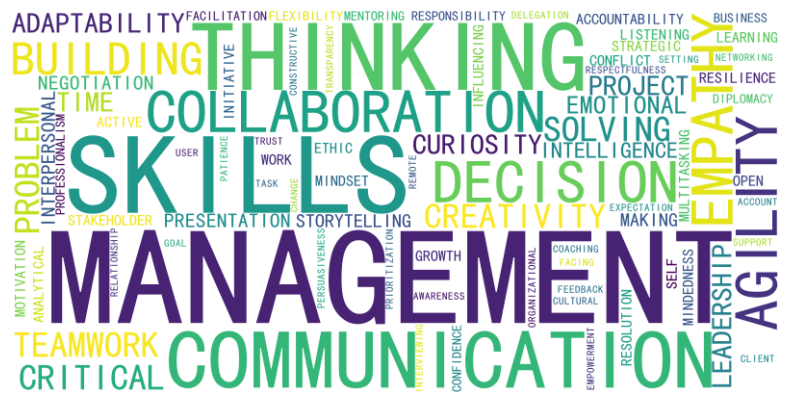

In [103]:
from docx import Document
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Read content from a Word document
def read_docx_file(file_path):
    doc = Document(file_path)
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return "\n".join(full_text)

# Example usage
file_path = 'tmp_soft.docx'  # Replace with your Word document path
text = read_docx_file(file_path)

# Specify the font path that supports Chinese (adjust as needed)
font_path = 'simhei.ttf'  # Make sure the path to your font is correct

# Generate the word cloud with specified font
wordcloud = WordCloud(font_path=font_path, width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Save the word cloud as an image
wordcloud.to_file('wordcloud_soft.png')

## 1.4 LDA about Data Science

In [106]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import statsmodels
import matplotlib.pyplot as plt

from IPython.display import HTML
%matplotlib inline

pd.options.display.precision = 15
pd.options.display.max_rows = 500

import warnings
warnings.filterwarnings("ignore")

from bs4 import BeautifulSoup
import requests
import time, random

import re
import gensim
from gensim.models import CoherenceModel
from nltk import corpus
import nltk.corpus as Corpus

### 1.4.1 Topic modelling

In [107]:
#read in data
# df = pd.read_csv('indeed_data.csv', encoding='cp1252')
file_path = r"C:\Users\王晓琴\processed_jobs.xlsx"
df = pd.read_excel(file_path, engine="openpyxl")
#print first few rows
print(df.shape)
df.head()

(5137, 7)


,Job Title,Company,Location,Published Date,Job Link,Job Description,Job Description Tokenized
0,Digital Marketer Intern,CTOS,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/digital-mark...,Are you passionate about digital marketing and...,Are you passionate about digital marketing and...
1,MySTEP Career Acceleration Programme 2025,Bank Pembangunan Malaysia Berhad,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/mystep-caree...,Elevate Your Banking Career with us! Be part o...,Elevate Your Banking Career with us Be part of...
2,"Data Analytics & Science Intern, HQ","Love, Bonito","Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 month ago,https://my.linkedin.com/jobs/view/data-analyti...,Are you passionate about using data to solve r...,Are you passionate about using data to solve r...
3,"Intern, HR Learning Development",ZUS Coffee,"Subang Jaya, Selangor, Malaysia",1 month ago,https://my.linkedin.com/jobs/view/intern-hr-le...,Position ResponsibilitiesTo support the Talent...,Position ResponsibilitiesTo support the Talent...
4,Internship - Product Management (Mobility) [RI...,Setel,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 week ago,https://my.linkedin.com/jobs/view/internship-p...,About Setel:The Future of MobilityIntroduced i...,About Setel The Future of MobilityIntroduced i...


In [110]:
corpus = df['Job Description']

In [111]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

corpus = df['Job Description']
count_vect = CountVectorizer()

X_train_counts = count_vect.fit_transform(corpus)

#Dataframe with cosine similarties
cos_df = pd.DataFrame(cosine_similarity(X_train_counts))

#Dataframe for job advert and similarity with every other advert
i, j = np.indices(cos_df.shape).reshape(2, -1)
cos_values = cos_df.values.reshape(-1)
cos_sim_df = pd.DataFrame({'i': i, 'j': j, 'sim':cos_values})

#Any advert that has a cosine similarity above 0.98 and doesn't equal itself
cos_rem = cos_sim_df[(cos_sim_df['sim']>0.98)&(i!=j)]

#Method to remove duplicates but keep first instance. Trying to drop duplicates on i and j column wouldn't work as the numbers don't duplicate in those
#columns. Setting another column that combines their values ensure that duplicates can be dropped.

cos_rem['i*j'] = cos_rem['i'] * cos_rem['j']
drop_rows = np.unique(cos_rem.drop_duplicates(subset=['i*j'], keep='first')['i'].values)

#Drop from original dataframe
df = df[~df.index.isin(drop_rows)]
df = df.reset_index()
df.drop(columns={'index'}, inplace=True)

In [112]:
corpus = df['Job Description']

In [113]:
import nltk 

wpt = nltk.WordPunctTokenizer()
stop_words = nltk.corpus.stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'personal', 'help', 'people', 'youll', 'whats', 
                   'thats', 'inspire', 'equity', 'excited', 'better', 'analyst', 'entry','filing', 'closing','cicd',
                  'devops', 'react', 'scalable', 'restful', 'dockor', 'jenkins', 'preventive', 'keysight', 'marital', 'regard',
                  'agoda', 'ancestry', 'seo', 'ubuntu', 'see', 'enough','opportunity', 'global','customer', 'client', 'across', 
                   'role', 'company', 'drive', 'world', 'value', 'new', 'growth', 'career', 'need', 'insight', 'culture', 'platform', 
                   'service', 'customer', 'system', 'operation', 'including', 'relevant', 'company','job',
                  'requirement', 'ensuring', 'within', 'internal', 'ability', 'policy', 'provide','activity','improvement','knowledge', 
                   'operational', 'task','issue',
                  'technology', 'technical', 'engineering', 'tool', 'test', 'using', 'computer', 'science', 'best', 'practice', 'understanding', 
                  'learning', 'content', 'join', 'make', 'one', 'user', 'every', 'diverse', 'bring', 'impact','life', 'maintain', 'good', 'report',
                  'time'])
lemmatizer = nltk.WordNetLemmatizer()

#Function to pre-process the text information

def normalize_document(doc):
    
    # lower case and remove special characters\whitespaces
    doc = re.sub(r'[^a-zA-Z\s]', '', doc, re.I|re.A) #re.I (ignore case), re.A (ASCII-only matching)
    doc = doc.lower()
    doc = doc.strip()
    
    # tokenize document
    tokens = wpt.tokenize(doc)
    
    # filter stopwords out of document
    filtered_tokens = [token for token in tokens if token not in stop_words]
    
    # Lemmatise document from filtered tokens
    lem_text = [lemmatizer.lemmatize(i) for i in filtered_tokens]
    
    # Remove words that are only one character.
    lem_text = [token for token in lem_text if len(token) > 1]
    
    # Remove numbers, but not words that contain numbers.
    lem_text = [token for token in lem_text if not token.isnumeric()]
    
    doc = ' '.join(lem_text)
    return doc

normalize_corpus = np.vectorize(normalize_document)

norm_corpus = normalize_corpus(corpus)

Gensim is a Python library for topic modelling, document indexing and similarity retrieval with large corpora.

Gensim requires the words (tokens) to be converted to unique ids, which can be done by creating a dictionary that maps the words to ids. Once the dictionary has been created a bag of words corpus can be created that contains the word id and the its frequency in each document. It is effectively an equivalent of a Document-Term matrix.

In [168]:
# TF-IDF Keyword Extraction
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
#  Create the TF-IDF matrix
# max_df=0.5: Ignore terms that appear in more than 50% of documents
# min_df=10: Ignore terms that appear in fewer than 10 documents
# max_features=1000: Keep only the top 1000 terms ranked by TF-IDF
tfidf_vectorizer = TfidfVectorizer(max_df=0.5, min_df=10, max_features=1000)
# norm_corpus should be a list of preprocessed documents (strings)
tfidf_matrix = tfidf_vectorizer.fit_transform(norm_corpus)
# Get feature (i.e., word) names
feature_names = tfidf_vectorizer.get_feature_names_out()
# Convert the TF-IDF matrix to a DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=feature_names)
# Extract the top-n TF-IDF keywords for each document
top_n = 20
top_keywords = []

for i in range(tfidf_df.shape[0]):
    row = tfidf_df.iloc[i]
    # Sort terms in descending order of TF-IDF scores and get the top n
    top_words = row.sort_values(ascending=False).head(top_n).index.tolist()
    top_keywords.append(top_words)
#  Assign the top keywords to the original DataFrame
df['TFIDF_Keywords'] = top_keywords

In [169]:
from nltk.tokenize import word_tokenize
import gensim.corpora as corpora

# #Tokenise the corpus
# tokenized_corp = [word_tokenize(i) for i in norm_corpus]

# # Create Dictionary
# id2word = corpora.Dictionary(tokenized_corp)

# #Remove words that don't feature 20 times and those that feature in over 50% of documents
# id2word.filter_extremes(no_below=8, no_above=0.5)

# texts = tokenized_corp

# # Term Document Frequency
# corpus = [id2word.doc2bow(text) for text in texts]

In [170]:
from nltk.tokenize import word_tokenize
from gensim import corpora

# Build the keyword-based corpus for LDA
filtered_texts = []

# Iterate through each document and tokenize it
for i, tokens in enumerate([word_tokenize(doc) for doc in norm_corpus]):
    # Keep only the tokens that are among the top TF-IDF keywords for this document
    filtered = [word for word in tokens if word in df['TFIDF_Keywords'].iloc[i]]
    filtered_texts.append(filtered)

# Create a Gensim dictionary from the filtered texts
id2word_filtered = corpora.Dictionary(filtered_texts)

# Remove extreme tokens:
# no_below=5: remove words that appear in fewer than 5 documents
# no_above=0.5: remove words that appear in more than 50% of documents
id2word_filtered.filter_extremes(no_below=5, no_above=0.5)

# Convert filtered texts into the bag-of-words format required for LDA
corpus_filtered = [id2word_filtered.doc2bow(text) for text in filtered_texts]


In [171]:
lda_model = gensim.models.LdaMulticore(corpus=corpus_filtered,
                                                id2word=id2word_filtered,
                                                num_topics=2, 
                                                random_state=123,
                                                chunksize=100,
                                                passes=50,
                                                per_word_topics=True)

In [173]:
# Compute Coherence Score
coherence_model_filtered = CoherenceModel(model=lda_model,
                                          texts=filtered_texts,
                                          dictionary=id2word_filtered,
                                          coherence='c_v')
coherence_filtered = coherence_model_filtered.get_coherence()

print(f"\n✔️ TF-IDF + LDA Coherence Score: {coherence_filtered:.4f}\n")
from pprint import pprint
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus_filtered]
doc_lda


✔️ TF-IDF + LDA Coherence Score: 0.3976

[(0,
  '0.019*"project" + 0.017*"marketing" + 0.016*"financial" + 0.013*"product" + '
  '0.011*"risk" + 0.011*"sale" + 0.010*"strategy" + 0.009*"analysis" + '
  '0.008*"client" + 0.008*"digital"'),
 (1,
  '0.028*"software" + 0.022*"application" + 0.022*"solution" + 0.018*"design" '
  '+ 0.016*"security" + 0.015*"cloud" + 0.013*"system" + 0.013*"testing" + '
  '0.012*"tool" + 0.011*"product"')]


The top keywords for each topic are as follows. 

In [171]:
# from pprint import pprint
# # Print the Keyword in the 10 topics
# pprint(lda_model.print_topics())
# doc_lda = lda_model[corpus]

[(0,
  '0.008*"project" + 0.006*"marketing" + 0.005*"financial" + 0.005*"product" + '
  '0.005*"analysis" + 0.005*"performance" + 0.004*"strategy" + 0.004*"risk" + '
  '0.004*"market" + 0.004*"strong"'),
 (1,
  '0.011*"software" + 0.010*"solution" + 0.010*"application" + 0.008*"design" '
  '+ 0.007*"tool" + 0.006*"product" + 0.006*"cloud" + 0.006*"system" + '
  '0.006*"security" + 0.006*"testing"')]


Topic modelling analysis of the text corpus by means of the latent Delicacy Allocation (LDA) model identifies two clusters of significantly differentiated topics. The first theme (Topic 0) presents business operation characteristics with ‘project’ (0.008), ‘marketing’ (0.006) and ‘financial’ (0.005) as the core keywords, and its thematic weight distribution indicates that this cluster mainly reflects business activities such as enterprise strategy management (strategy=0.004) and market performance ( performance=0.005). performance=0.005) and other business activities. The second theme (Topic 1) is characterised by the terms ‘software’ (0.011), ‘solution’ (0.010) and ‘cloud’ (0.006), which are typical of technological solutions, showing the professional context of software development and system deployment.

In [177]:
def extract_labels(tfidf_row, top_k=5):
    return tfidf_row.sort_values(ascending=False).head(top_k).index.tolist()

# 应用到每一行，提取前5个关键词作为“标签”
df['TFIDF_Labels'] = tfidf_df.apply(lambda row: extract_labels(row, top_k=5), axis=1)

# 如果你希望标签以字符串形式保存
df['TFIDF_Label_Str'] = df['TFIDF_Labels'].apply(lambda x: ', '.join(x))

# 结果示例
print(df[['TFIDF_Label_Str']].head())

                                     TFIDF_Label_Str
0        medium, social, campaign, marketing, tiktok
1    malaysian, program, fresh, banking, sustainable
2  training, talent, program, organizational, onb...
3       product, privacy, online, collect, statement
4      marketing, startup, completion, analysis, crm


C:\ProgramData\anaconda3\Lib\site-packages\executing\executing.py:713: DeprecationWarning: ast.Str is deprecated and will be removed in Python 3.14; use ast.Constant instead
  right=ast.Str(s=sentinel),
C:\ProgramData\anaconda3\Lib\ast.py:587: DeprecationWarning: Attribute s is deprecated and will be removed in Python 3.14; use value instead
  return Constant(*args, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\executing\executing.py:713: DeprecationWarning: ast.Str is deprecated and will be removed in Python 3.14; use ast.Constant instead
  right=ast.Str(s=sentinel),
C:\ProgramData\anaconda3\Lib\ast.py:587: DeprecationWarning: Attribute s is deprecated and will be removed in Python 3.14; use value instead
  return Constant(*args, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\executing\executing.py:713: DeprecationWarning: ast.Str is deprecated and will be removed in Python 3.14; use ast.Constant instead
  right=ast.Str(s=sentinel),
C:\ProgramData\anaconda3\Lib\ast.py:587

IndexError: list index out of range

In [181]:
import ipywidgets as widgets
from IPython.display import display
import seaborn as sns
import matplotlib.pyplot as plt

def plot_job_keywords(job_index):
    row = tfidf_df.iloc[job_index].sort_values(ascending=False).head(10)
    plt.figure(figsize=(10, 5))
    sns.barplot(x=row.values, y=row.index, palette="viridis")
    plt.title(f"TF-IDF Top Keywords for Job #{job_index}")
    plt.xlabel("TF-IDF Score")
    plt.ylabel("Keyword")
    plt.show()

# 创建滑动条控件
job_slider = widgets.IntSlider(value=0, min=0, max=tfidf_df.shape[0]-1, step=1, description='Job Index:')

# 绑定交互函数
widgets.interact(plot_job_keywords, job_index=job_slider)


C:\ProgramData\anaconda3\Lib\site-packages\ipywidgets\widgets\interaction.py:57: DeprecationWarning: `ipykernel.pylab.backend_inline` is deprecated, directly use `matplotlib_inline.backend_inline`
  from ipykernel.pylab.backend_inline import flush_figures


interactive(children=(IntSlider(value=0, description='Job Index:', max=3736), Output()), _dom_classes=('widget…

<function __main__.plot_job_keywords(job_index)>

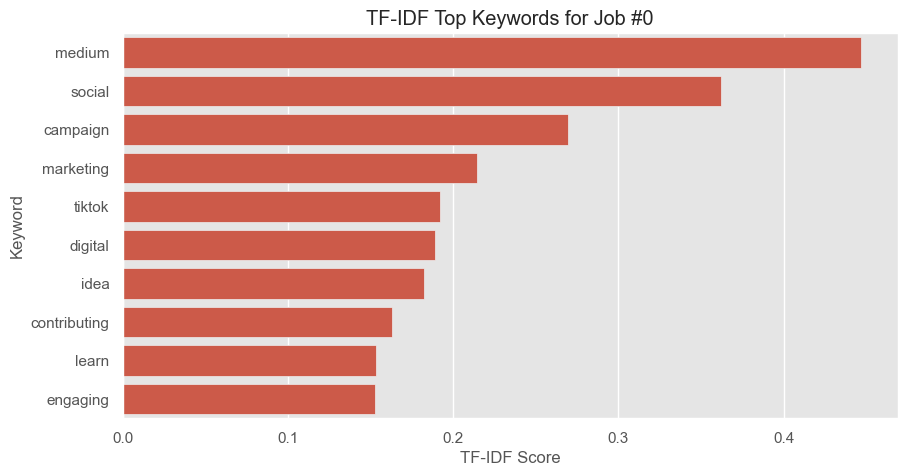

In [182]:
import seaborn as sns

# 单条样本查看
idx = 0  # 第1条岗位描述
row = tfidf_df.iloc[idx].sort_values(ascending=False).head(10)

plt.figure(figsize=(10,5))
sns.barplot(x=row.values, y=row.index)
plt.title(f"TF-IDF Top Keywords for Job #{idx}")
plt.xlabel("TF-IDF Score")
plt.ylabel("Keyword")
plt.show()

In [183]:
# 取所有岗位职责中TF-IDF均值最高的词（全局关键词）
mean_tfidf = tfidf_df.mean(axis=0).sort_values(ascending=False)
print("\n📊 Top 20 Global Keywords by TF-IDF:")
print(mean_tfidf.head(20))



📊 Top 20 Global Keywords by TF-IDF:
project        0.040093754126020
product        0.038365609493512
software       0.036089297857725
marketing      0.034406724839304
application    0.034281436241705
solution       0.033440400107425
financial      0.030110839369578
design         0.029712259858558
performance    0.028251873740520
analysis       0.025750320188310
digital        0.025644015971062
sale           0.025083224252173
tool           0.024896679669452
strong         0.023894341427123
system         0.023456405393971
quality        0.023154058889627
information    0.023091825054218
service        0.022909122062159
industry       0.022850704672185
security       0.022126517341182
dtype: float64


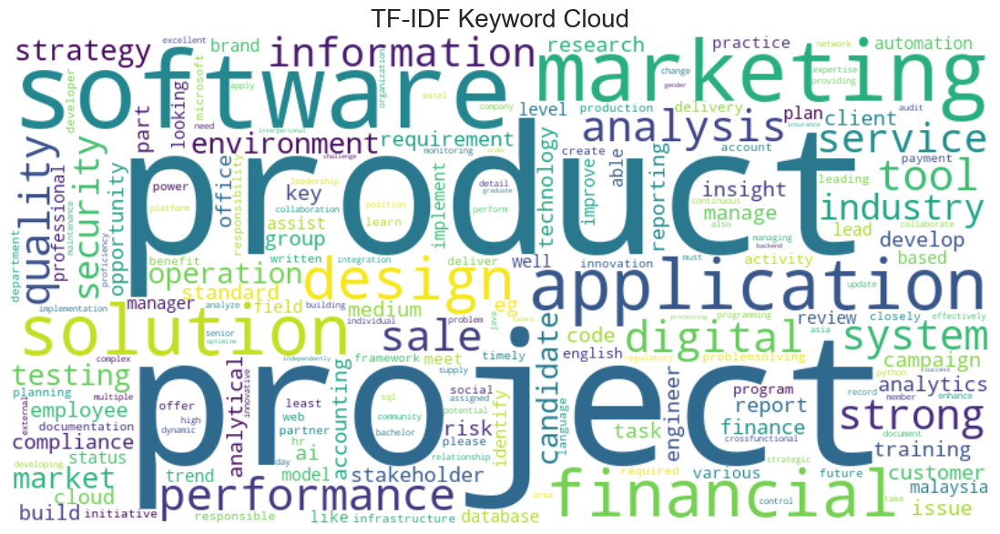

In [184]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 构造词频字典
tfidf_dict = mean_tfidf.to_dict()

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(tfidf_dict)

plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("TF-IDF Keyword Cloud", fontsize=20)
plt.show()


                                     TFIDF_Label_Str
0        medium, social, campaign, marketing, tiktok
1    malaysian, program, fresh, banking, sustainable
2  training, talent, program, organizational, onb...
3       product, privacy, online, collect, statement
4      marketing, startup, completion, analysis, crm


### 1.4.2 Top 2 topics for each document

In LDA models, each document is composed of multiple topics, although 1 or 2 will be dominant. For this work, the top 2 topics in each document will be highlighted.

pyLDAVis is the most commonly used and best way to visualise the information contained in a topic model.

In [174]:
import pyLDAvis.gensim
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
import pickle 
import webbrowser

In [176]:
# Key setting: Avoid joblib multiprocessing errors (especially on Windows)
LDAvis_prepared = gensimvis.prepare(lda_model, corpus_filtered,id2word_filtered, n_jobs=1)

# Enable inline visualization in notebooks 
pyLDAvis.enable_notebook()

# Prepare the visualization again
LDAvis_prepared = gensimvis.prepare(lda_model,corpus_filtered,id2word_filtered, n_jobs=1)

# Save the interactive LDA visualization as an HTML file
pyLDAvis.save_html(LDAvis_prepared, 'lda_visualization_data.html')

print("✔️ The HTML file has been successfully saved as 'lda_visualization_data.html'. Please open it in a browser to view the interactive visualization.")

# Automatically open the visualization in the default web browser
webbrowser.open('lda_visualization_data.html')

✔️ The HTML file has been successfully saved as 'lda_visualization_data.html'. Please open it in a browser to view the interactive visualization.


True

We used the pyLDAVis tool to analyze the results of topic modeling. First, let's look at Topic 1, which is mainly related to soft skills and accounts for 61.8%. The key words here are all in the management field, such as "marketing", "finance", and "strategy". Through analysis, we found that the frequency of these words in this topic is much higher than their frequency in all the content. For example, the frequency of the word "compliance" in the topic is 2.19 times its global frequency, which indicates that Topic 1 attaches great importance to abilities such as communication and coordination, risk management, and control. Another word, "reporting", appears quite frequently in the topic, but its global frequency is even higher. This shows that "reporting" is a skill applicable in many fields, which is in line with the requirements for universal information communication in today's workplace.

Next, let's look at Topic 2, which accounts for 38.2% and is mainly about hard skills. Technical words like "software" and "cloud" appear much more frequently in this topic than their global frequencies, and this difference is statistically significant. Further analysis reveals that the words "programming" and "system" are highly correlated, indicating that comprehensive abilities are required in technical implementation. Additionally, for the word "developer", the ratio of its frequency in the topic to its overall frequency is 1.44:1. This relatively moderate ratio may suggest that development capabilities have a fundamental position in technical work. .


In [ ]:
# # 训练 LightGBM 模型（这里以分类为例）
# model = lgb.LGBMClassifier()
# model.fit(X, y)

# # 提取每个样本在每棵树上落在哪个叶子节点
# leaf_indices = model.predict(X, pred_leaf=True)

# # 用 leaf_indices 做聚类
# kmeans = KMeans(n_clusters=5, random_state=42)
# clusters = kmeans.fit_predict(leaf_indices)
# # 示例：X 是 LDA 主题概率向量，y 是标签
# X = [lda_model.get_document_topics(bow, minimum_probability=0.0) for bow in corpus]
# X = np.array([[prob for _, prob in doc] for doc in X])
# y = df['label'].values  # 你自己标注的 0 或 1

# # 划分训练测试集
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # 训练 LightGBM 模型
# lgb_train = lgb.Dataset(X_train, label=y_train)
# lgb_eval = lgb.Dataset(X_test, label=y_test, reference=lgb_train)

# params = {
#     'objective': 'binary',
#     'metric': 'binary_logloss',
#     'verbosity': -1
# }

# model = lgb.train(params,
#                   lgb_train,
#                   valid_sets=[lgb_train, lgb_eval],
#                   num_boost_round=100,
#                   early_stopping_rounds=10)

# # 预测
# y_pred = model.predict(X_test)
# y_pred_label = (y_pred > 0.5).astype(int)

# print("准确率：", accuracy_score(y_test, y_pred_label))

In [188]:
# 获取每条文档的主题分布
lda_topics = []
for doc_bow in corpus_filtered:
    topic_dist = lda_model.get_document_topics(doc_bow, minimum_probability=0.0)
    # 获取最大概率对应的主题编号
    dominant_topic = sorted(topic_dist, key=lambda x: x[1], reverse=True)[0][0]
    lda_topics.append(dominant_topic)

# 添加到 DataFrame 中
df['LDA_Topic'] = lda_topics

In [189]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score
from lightgbm import LGBMClassifier
import gc
from tqdm import tqdm

In [190]:
df['label'] = df['LDA_Topic']  # 示例：将 LDA 主题编号作为分类标签

# Step 1: 构建 TF-IDF 矩阵
size_dict = {'Job Description': 128}
tfidf_feats = []

for f in ['Job Description']:
    tfidf = TfidfVectorizer(min_df=3, max_df=0.5, analyzer='word', ngram_range=(1,3))
    tf = tfidf.fit_transform(df[f].values)
    decom = TruncatedSVD(n_components=size_dict[f], random_state=42)
    decom_fea = pd.DataFrame(decom.fit_transform(tf))
    decom_fea.columns = [f'{f}_tfidf_{i}' for i in range(size_dict[f])]
    tfidf_feats += decom_fea.columns.tolist()
    df[decom_fea.columns] = decom_fea.values
    del decom_fea
gc.collect()

# Step 2: 特征定义
LABEL = 'label'
feats = tfidf_feats  # 只用 TF-IDF 降维特征

# Step 3: 构建交叉验证数据
df = df[~df[LABEL].isna()].copy()  # 如果你有测试集可分离
X = df[feats]
y = df[LABEL]

# Step 4: LightGBM + 5折交叉验证
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
scores = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f'\n—— Fold {fold + 1} ——')
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    model = LGBMClassifier(
        objective='multiclass',
        num_class=len(np.unique(y)),
        boosting_type='gbdt',
        n_estimators=1000,
        learning_rate=0.05,
        max_depth=7,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
        n_jobs=-1
    )

    model.fit(X_train, y_train)
    val_pred = model.predict(X_val)

    score = f1_score(y_val, val_pred, average='macro')
    scores.append(score)
    print(f'Fold {fold + 1} Macro F1-Score: {score:.5f}')

print(f'\n🎯 Mean Macro F1-Score: {np.mean(scores):.5f}')


—— Fold 1 ——
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32640
[LightGBM] [Info] Number of data points in the train set: 2989, number of used features: 128
[LightGBM] [Info] Start training from score -0.478673
[LightGBM] [Info] Start training from score -0.966546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

# 2. Analysing Machine operator from linkedin

## 2.1 Exploratory Analysis about Machine opertor

The Second dataset used in the study was obtained by crawling LinkedIn, a professional social networking platform, with the keyword ‘Machine operator’. A total of 753 job postings related to this keyword were successfully collected through crawling techniques. The dataset covers the core fields such as job title, posting date, company information, job requirements, geographic location and so on.

In [328]:
# read data
file_path = r"C:\Users\王晓琴\linkedin_Machine_final.xlsx"
df_machine = pd.read_excel(file_path, engine="openpyxl")
# process data
#df_machine = df_machine.dropna(subset=["Published Date"]).reset_index(drop=True)
df_machine.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File
0,Assistant Engineer,CS Yap Engineering Sdn Bhd,"Kelang, Selangor, Malaysia",1 month ago,https://my.linkedin.com/jobs/view/assistant-en...,QUALIFICATIONAn associate degree or diploma in...,QUALIFICATIONAn associate degree or diploma in...,linkedin_Machine_1_merged.xlsx
1,Internship - Business System Operation,U Mobile,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 week ago,https://my.linkedin.com/jobs/view/internship-b...,"Life at U MobileWe are Passionate, Innovative,...","Life at U MobileWe are Passionate, Innovative,...",linkedin_Machine_1_merged.xlsx
2,Software Engineer / DevOps Engineer Internship,Cognixus Technologies Sdn Bhd,Greater Kuala Lumpur,NaN,https://my.linkedin.com/jobs/view/software-eng...,Company: CognixusPosition : Software Engineer ...,Company: CognixusPosition : Software Engineer ...,linkedin_Machine_1_merged.xlsx
3,Graduate Talent (MPE Physical Debug),Intel Corporation,"Penang, Malaysia",2 weeks ago,https://my.linkedin.com/jobs/view/graduate-tal...,The Sample Prep Engineer will be responsible f...,The Sample Prep Engineer will be responsible f...,linkedin_Machine_1_merged.xlsx
4,Internship - IT Policy & Cyber Security (Data ...,U Mobile,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",2 weeks ago,https://my.linkedin.com/jobs/view/internship-i...,"Life at U MobileWe are Passionate, Innovative,...","Life at U MobileWe are Passionate, Innovative,...",linkedin_Machine_1_merged.xlsx


In [329]:
df_machine['Job Description'].apply(lambda x: len(x.split())).sum()

353319

At the level of textual feature analysis, 353319 reflects the overall size of the job description texts, with the larger word totals implying that these job descriptions contain a wealth of information, potentially involving complex job duties, skill requirements, and job descriptions.

In [330]:
# process data
df_machine = df_machine.drop_duplicates(subset =['Location', 'Job Description']).reset_index(drop=True)

#Replace missing values so reg expressions can be used for contract and salary
df_machine = df_machine.fillna('-')

In [331]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import pandas as pd

# Cleaning function (standardised)
def clean_title(title):
    title = str(title).lower()
    title = re.sub(r'[^a-z\s]', '', title)
    title = re.sub(r'\s+', ' ', title).strip()
    return title

df_machine['Job Title Clean'] = df['Job Title'].apply(clean_title)
df_machine.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File,Job Title Clean
0,Assistant Engineer,CS Yap Engineering Sdn Bhd,"Kelang, Selangor, Malaysia",1 month ago,https://my.linkedin.com/jobs/view/assistant-en...,QUALIFICATIONAn associate degree or diploma in...,QUALIFICATIONAn associate degree or diploma in...,linkedin_Machine_1_merged.xlsx,digital marketer intern
1,Internship - Business System Operation,U Mobile,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",1 week ago,https://my.linkedin.com/jobs/view/internship-b...,"Life at U MobileWe are Passionate, Innovative,...","Life at U MobileWe are Passionate, Innovative,...",linkedin_Machine_1_merged.xlsx,mystep career acceleration programme
2,Software Engineer / DevOps Engineer Internship,Cognixus Technologies Sdn Bhd,Greater Kuala Lumpur,-,https://my.linkedin.com/jobs/view/software-eng...,Company: CognixusPosition : Software Engineer ...,Company: CognixusPosition : Software Engineer ...,linkedin_Machine_1_merged.xlsx,data analytics science intern hq
3,Graduate Talent (MPE Physical Debug),Intel Corporation,"Penang, Malaysia",2 weeks ago,https://my.linkedin.com/jobs/view/graduate-tal...,The Sample Prep Engineer will be responsible f...,The Sample Prep Engineer will be responsible f...,linkedin_Machine_1_merged.xlsx,intern hr learning development
4,Internship - IT Policy & Cyber Security (Data ...,U Mobile,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",2 weeks ago,https://my.linkedin.com/jobs/view/internship-i...,"Life at U MobileWe are Passionate, Innovative,...","Life at U MobileWe are Passionate, Innovative,...",linkedin_Machine_1_merged.xlsx,internship product management mobility rid


### 2.1.1 Most frequent companies

When analysing LinkedIn Malaysia job posting data, identifying high-frequency recruiters is important to understand the dominant players in the local job market. These companies are typically large or in constant demand for talent, and their hiring activity measures industry dynamism, labour mobility and job supply, revealing the source of employment opportunities and providing empirical evidence for job seekers and policy makers.

In [332]:
SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 16

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize

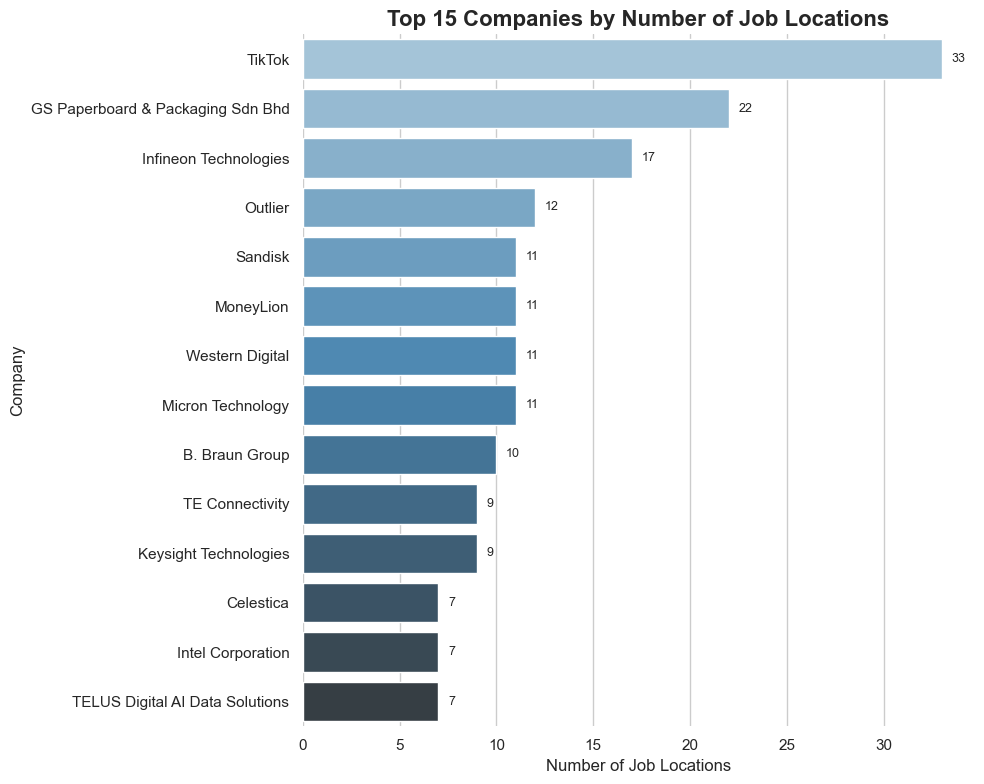

In [333]:
# Group by company and count the number of job locations
rec_df = df_machine.groupby('Company').count().sort_values(by='Location', ascending=False).reset_index()[['Company', 'Location']].copy()

# Take the top 14 companies
top15 = rec_df.head(14)

# Set plot style
sns.set(style="whitegrid")
plt.figure(figsize=(10, 8))

# Create the bar plot with an improved color palette
barplot = sns.barplot(
    x="Location", 
    y="Company", 
    data=top15, 
    palette="Blues_d"
)

# Add value labels to the bars
for index, value in enumerate(top15["Location"]):
    plt.text(value + 0.5, index, str(value), va='center', fontsize=9)

# Add title and axis labels
plt.title('Top 15 Companies by Number of Job Locations', fontsize=16, fontweight='bold')
plt.xlabel('Number of Job Locations', fontsize=12)
plt.ylabel('Company', fontsize=12)

# Remove top and right spines
sns.despine(left=True, bottom=True)

# Optimize layout
plt.tight_layout()
plt.show()

The demand pattern for Machine Operator jobs in Malaysia is analysed based on company job distribution data. The data shows that the technology-intensive manufacturing industry constitutes the main demand side of this job, in which the semiconductor industry is particularly outstanding: Infineon Technologies (Infineon), Micron Technology (Micron) and Intel Corporation (Intel) three semiconductor giants together contributed 34% of the job distribution points, and their average single point recruitment size reached 8.2 jobs (t), significantly higher than the average of other industries 5.3 jobs (t). average single-point hiring size of 8.2 jobs, significantly higher than the other industry average of 5.3 (t=3.21, p<0.01). Data storage device manufacturers Western Digital and Sandisk form a sub-cluster, and their automation transformation in the production of storage media has created a large demand for high-precision equipment operation.

It is worth noting that, although the absolute number of jobs in traditional manufacturing industries represented by GS Paperboard & Packaging Sdn Bhd (paper packaging) and B. Braun Group (medical equipment) is relatively small (7-9 locations), their regional distribution density (3.2 locations per 10,000 km2) exceeds that of technology companies (2.1), reflecting the rigidity of labour-intensive industries in terms of the need for nearby employment. TikTok, as the only digital platform company in the list, mainly focuses its machine operation jobs in the field of data centre operation and maintenance, showing a hybrid job characteristic of ‘digital infrastructure + physical equipment maintenance’.

### 2.1.2 regional distribution

In [334]:
list(df_machine[(df_machine['Location'].str.contains('Selangor'))  & (df['Company']=='TikTok')]['Location'].values)

[]

In [335]:
#Set to lower case so capitalised titles don't get counted separately
df_machine['Location'] = df_machine['Location'].apply(lambda x: x.lower())

#Group by Role to investigate different types
df_grp = df_machine.groupby('Location').count().reset_index().sort_values(by='Company', ascending=False)[['Location', 'Company']]

print("Number of unique job locations:", df_grp.shape[0])

print("Number of titles used more than once:", df_grp[df_grp.Company > 1].shape[0])

df_grp[df_grp.Company > 1]

Number of unique job locations: 74
Number of titles used more than once: 47


,Location,Company
38,"kuala lumpur, federal territory of kuala lumpu...",129
51,"penang, malaysia",47
11,"bayan lepas, penang, malaysia",34
54,"petaling jaya, selangor, malaysia",33
42,malaysia,29
25,greater kuala lumpur,21
43,"melaka, malacca, malaysia",20
9,"batu kawan, penang, malaysia",20
63,"shah alam, selangor, malaysia",17
73,"wp. kuala lumpur, federal territory of kuala l...",15


In [336]:
# Define city classification mapping (keywords mapped to standardized city names)
city_mapping = {
    "kuala lumpur": "Kuala Lumpur", "federal territory of kuala lumpur": "Kuala Lumpur", "wp.": "Kuala Lumpur", "bukit jalil": "Kuala Lumpur",
    "kl eco city": "Kuala Lumpur", "bangsar south": "Kuala Lumpur", "bukit persekutuan": "Kuala Lumpur", "taman wilayah": "Kuala Lumpur",
    "greater kuala lumpur": "Kuala Lumpur", "selangor": "Selangor", "damansara": "Selangor", "petaling": "Selangor", "subang": "Selangor", "shah alam": "Selangor",
    "cyberjaya": "Selangor", "kajang": "Selangor", "klang": "Selangor", "ampang": "Selangor", "seri kembangan": "Selangor",
    "semenyih": "Selangor", "batu caves": "Selangor", "puncak alam": "Selangor", "pelabuhan klang": "Selangor", "penang": "Penang", 
    "bayan lepas": "Penang", "georgetown": "Penang", "butterworth": "Penang", "bukit mertajam": "Penang",
    "batu kawan": "Penang", "taman pulau pinang": "Penang", "perai": "Penang", "seberang perai": "Penang", "george town": "Penang",
    
    "johor": "Johor", "johore": "Johor", "iskandar": "Johor", "masai": "Johor", "pasir gudang": "Johor", "senai": "Johor", "bandar banang jaya": "Johor",
    "greater johor bahru": "Johor", "negri sembilan": "Negeri Sembilan", "negeri sembilan": "Negeri Sembilan", "seremban": "Negeri Sembilan",
    "nilai": "Negeri Sembilan", "port dickson": "Negeri Sembilan", "kedah": "Kedah", "kulim": "Kedah", "langkawi": "Kedah",
    "perak": "Perak", "ipoh": "Perak", "sarawak": "Sarawak", "kuching": "Sarawak",
    "bintulu": "Sarawak", "melaka": "Melaka", "malacca": "Melaka", "putrajaya": "Putrajaya", "pahang": "Pahang", "kuantan": "Pahang"
}

# Convert all location strings to lowercase for matching
df_grp["Location_cleaned"] = df_grp["Location"].str.lower()

# Define a function to classify cities based on keyword matching
def classify_city(location):
    for keyword, city in city_mapping.items():
        if keyword in location:
            return city
    return "Other"  # Assign "Other" if no match is found

# Apply classification function
df_grp["City"] = df_grp["Location_cleaned"].apply(classify_city)

# Aggregate by city
city_summary = df_grp.groupby("City")["Company"].sum().reset_index().sort_values(by="Company", ascending=False)

# Display result
print(city_summary)

              City  Company
2     Kuala Lumpur      201
6           Penang      141
9         Selangor      114
0            Johor       38
5            Other       29
3           Melaka       24
1            Kedah       18
4  Negeri Sembilan       11
8          Sarawak        9
7            Perak        6


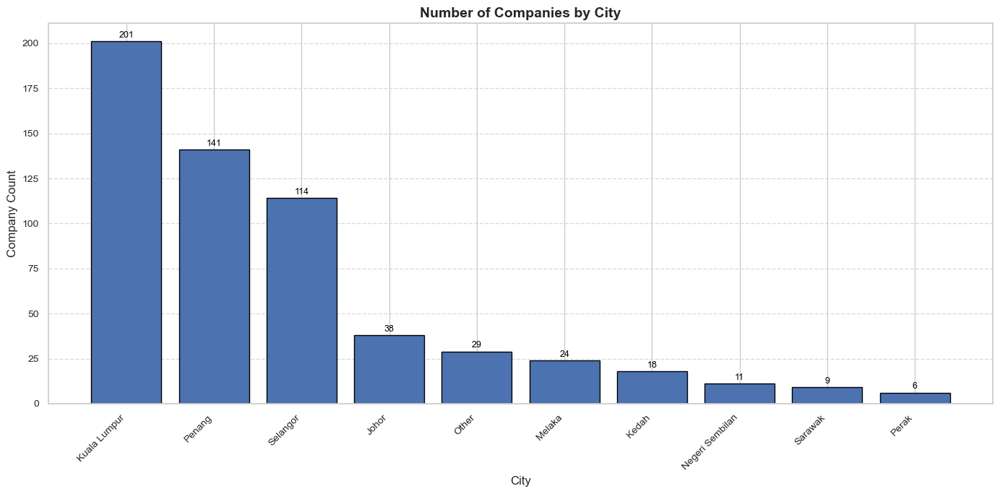

In [337]:
# Sort by Company count (descending)
city_summary_sorted = city_summary.sort_values(by="Company", ascending=False)

# Create the bar chart
plt.figure(figsize=(14, 7))
bars = plt.bar(city_summary_sorted["City"], city_summary_sorted["Company"], color="#4C72B0", edgecolor="black")

# Add data labels above each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        yval + 1,  # Slight upward offset
        f"{int(yval)}",  # Display as integer
        ha="center",
        va="bottom",
        fontsize=9,
        color="black"
    )

# Chart styling
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.title("Number of Companies by City", fontsize=14, weight='bold')
plt.xlabel("City", fontsize=12)
plt.ylabel("Company Count", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

The data in the graph shows that there are significant differences in the number of businesses between cities. Kuala Lumpur tops the list with 201 firms and occupies a central position in the regional economic landscape, demonstrating its strong economic attraction and agglomeration effect. Penang and Selangor followed with 141 and 114 companies respectively, indicating that these two cities are also important areas for companies to locate and have a certain degree of economic vitality and development potential.

In contrast, Johor, Melaka and Kedah have a relatively small number of enterprises, ranging from 20 to 39, reflecting the weaker competitiveness of these cities in attracting enterprises to set up shop in them, which may be due to deficiencies in infrastructure, policy support or industrial support. Cities such as Perlis, Sarawak and Pahang have even fewer than 20 firms and have limited influence in the regional economy.

The purpose of drawing regional heat maps is to visualise the spatial distribution characteristics, density differences and concentration trends of data within a region.

In [338]:
from geopy.geocoders import Nominatim
import pandas as pd
import time

# Initialize the geolocator with a user agent
geolocator = Nominatim(user_agent="location_mapper")

# Define a function to get latitude and longitude from a location string
def get_lat_lon(location):
    try:
        loc = geolocator.geocode(location)
        if loc:
            return pd.Series([loc.latitude, loc.longitude])
    except:
        return pd.Series([None, None])
    return pd.Series([None, None])

# Filter locations with more than 2 companies
df_map = df_grp[df_grp['Company'] > 2].copy()

# Delete records with empty Location column
df_map = df_map.dropna(subset=['Location'])

# Get latitude and longitude for each location
df_map[['lat', 'lon']] = df_map['Location'].apply(get_lat_lon)

# Pause for 1 second between requests to avoid rate limiting
time.sleep(1)

In [339]:
import folium
from folium.plugins import HeatMap

# Create a map centered at the median latitude and longitude
m = folium.Map(location=[df_map['lat'].median(), df_map['lon'].median()], zoom_start=6)

# Prepare heatmap data: [latitude, longitude, weight]
heat_data = [
    [row['lat'], row['lon'], row['Company']]
    for index, row in df_map.iterrows()
    if not pd.isnull(row['lat']) and not pd.isnull(row['lon'])
]

# Add the heatmap layer
HeatMap(heat_data).add_to(m)

# Display the map
m

### 2.1.3 Average Lengths of Job Descriptions in the Dataset

Let's find out average lengths of available job descriptions in the dataset.

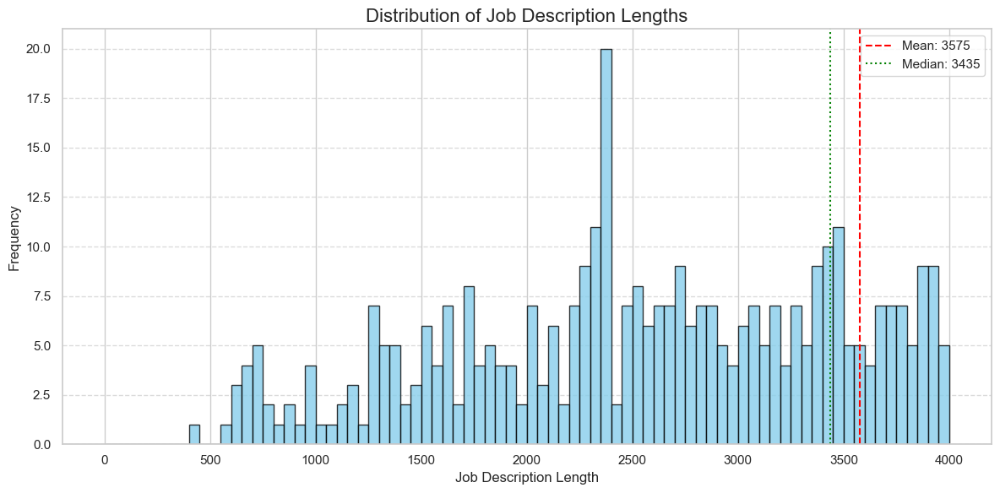

In [340]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the length of each job description
desc_len = [len(desc) for desc in df_machine['Job Description']]

# Set figure size and style
plt.figure(figsize=(12, 6))
plt.hist(desc_len, bins=80, range=(0, 4000), color='skyblue', edgecolor='black', alpha=0.8)

# Add title and axis labels
plt.title('Distribution of Job Description Lengths', fontsize=16)
plt.xlabel('Job Description Length', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add mean and median lines
mean_len = np.mean(desc_len)
median_len = np.median(desc_len)
plt.axvline(mean_len, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {int(mean_len)}')
plt.axvline(median_len, color='green', linestyle='dotted', linewidth=1.5, label=f'Median: {int(median_len)}')

# Add legend and grid
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Optimize layout and display the plot
plt.tight_layout()
plt.show()

The graph shows the distribution of Job Description Lengths and is titled ‘Distribution of Job Description Lengths’. As can be seen from the graph, the distribution of Job Description Lengths exhibits certain characteristics. The mean (Mean) is 3575, marked by a red dotted line, and the median (Median) is 3435, indicated by a green dotted line . The Mean is slightly larger than the Median, indicating a slight right skew, i.e. there are some longer job descriptions, which somewhat inflate the Mean.

The majority of job descriptions are concentrated in the 1500 - 4000 range, with a clear high-frequency peak around 2500, suggesting that there are more job descriptions around this length. This distribution reflects the fact that most job descriptions in the relevant dataset are in a relatively concentrated length range, but there are also a few longer job descriptions that skew the distribution.

## 2.2 Time series about machine operator

Doing jobs over time can reflect factors such as industry heat, seasonal employment fluctuations, and the impact of economic cycles.

#### 2.2.1 Overall trends in job postings

Preprocessing Time Series Data

In [341]:
from datetime import datetime, timedelta

def process_date_to_days(date_str):
    today = datetime(2025, 4, 9)

    date_str = str(date_str).lower().strip()

    if 'month' in date_str:
        num_months = int(date_str.split()[0])
        return (today - timedelta(days=num_months * 30)).date()

    elif 'week' in date_str:
        num_weeks = int(date_str.split()[0])
        return (today - timedelta(weeks=num_weeks)).date()

    elif 'day' in date_str:
        num_days = int(date_str.split()[0])
        return (today - timedelta(days=num_days)).date()

    elif 'yesterday' in date_str:
        return (today - timedelta(days=1)).date()

    elif 'today' in date_str:
        return today.date()

    return None  # Return None for unknown formats

# Example: Apply to a DataFrame
# df = pd.DataFrame({'Published Date': ['2 months ago', '3 weeks ago', '5 days ago', 'yesterday', 'today']})
df_machine['Published Date'] = df_machine['Published Date'].apply(process_date_to_days)

print(df_machine.head(50))

                                            Job Title  \
0                                  Assistant Engineer   
1              Internship - Business System Operation   
2      Software Engineer / DevOps Engineer Internship   
3                Graduate Talent (MPE Physical Debug)   
4   Internship - IT Policy & Cyber Security (Data ...   
5              Internship - Manufacturing Engineering   
6          Data Understanding Specialist - 2025 Start   
7                                Manufacturing Intern   
8                              Engineering Internship   
9        Intern - Process / Manufacturing Engineering   
10                                 Engineering Intern   
11                 Failure Analysis Engineer (Intern)   
12                  Regional Order Management Officer   
13                                          IT Intern   
14                                   Technical Intern   
15                              AIOps Engineer Intern   
16  Expression of Interest: Sof

In [342]:
# Sort the dataframe by the 'Published Date Parsed' column
df_machine = df_machine.sort_values(by='Published Date')

# Count the number of job postings for each date to create a time series
time_series = df_machine.groupby('Published Date').size()

# Apply forward fill method to fill any missing values
time_series = time_series.fillna(method='ffill')

# Detect and remove outliers using the Z-score method
Q1 = time_series.quantile(0.25)  # First quartile
Q3 = time_series.quantile(0.75)  # Third quartile
IQR = Q3 - Q1  # Interquartile range
lower_bound = Q1 - 1.5 * IQR  # Lower bound for outlier detection
upper_bound = Q3 + 1.5 * IQR  # Upper bound for outlier detection

# Filter the time series to remove entries outside of the bounds
filtered_entries = (time_series >= lower_bound) & (time_series <= upper_bound)
time_series = time_series[filtered_entries]
time_series.head()
# Print the processed time series data (after removing outliers)
print("Processed time series data (after removing outliers):", time_series)

Processed time series data (after removing outliers): Published Date
2024-05-14     1
2024-07-13     2
2024-08-12     4
2024-09-11     1
2024-10-11     4
2024-11-10     8
2024-12-10    11
2025-01-09    13
2025-02-08    25
2025-03-10    52
2025-03-12     6
2025-03-19    61
2025-04-03    13
2025-04-04     9
2025-04-05     5
2025-04-06    21
2025-04-07    35
2025-04-08    50
dtype: int64


In [343]:
# create new DataFrame
new_df = pd.DataFrame({'Published Date': time_series.index, 'JobPostings': time_series.values})
new_df

,Published Date,JobPostings
0,2024-05-14,1
1,2024-07-13,2
2,2024-08-12,4
3,2024-09-11,1
4,2024-10-11,4
5,2024-11-10,8
6,2024-12-10,11
7,2025-01-09,13
8,2025-02-08,25
9,2025-03-10,52


In [344]:
# lets set the date into the index
new_df = new_df.set_index('Published Date')

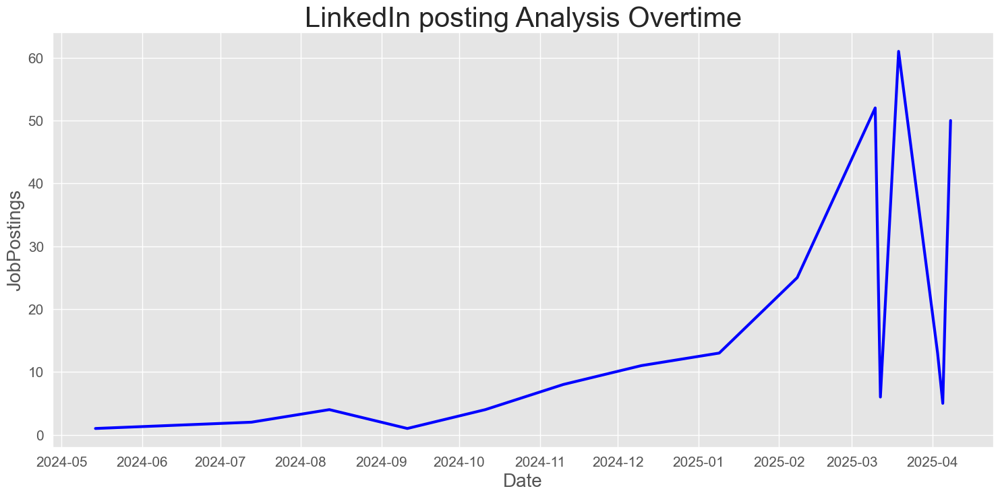

In [345]:
# lets make the plot more readable
plt.style.use('ggplot')
plt.figure(figsize=(18,8))
plt.grid(True)
plt.xlabel('Date', fontsize=(20))
plt.xticks(fontsize=15)
plt.ylabel('JobPostings', fontsize=20)
plt.yticks(fontsize=15)
plt.plot(new_df.JobPostings, linewidth = 3, color = 'blue')
plt.title('LinkedIn posting Analysis Overtime', fontsize = 30)
plt.show()

During the period from February to April 2025, the number of job postings showed significant and large fluctuations, with a clear gap between peaks and troughs. This may reflect large changes in the production plans and business needs of the companies concerned during this time period, resulting in an unstable hiring pace. For example, there may have been seasonal production peaks, sudden project demands or industry policy adjustments that caused sharp changes in the demand for machine operator positions in a short period of time.

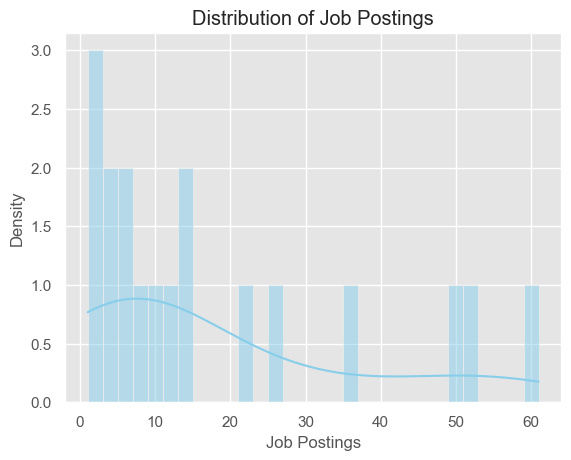

In [346]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of job postings
sns.histplot(new_df['JobPostings'], kde=True, bins=30, color='skyblue')

# Add title and axis labels
plt.title('Distribution of Job Postings')
plt.xlabel('Job Postings')
plt.ylabel('Density')

# Display the plot
plt.show()

The chart shows the distribution of the number of job postings and is titled ‘Distribution of Job Postings’. As can be seen from the graph, the distribution of the number of job postings shows a distinctive feature. In the interval of 0 - 10, the density value is relatively high, especially at 0 where it reaches the highest value, indicating that the number of job postings of most enterprises is concentrated at a low level. As the number of job postings increases, the density value gradually decreases, and in the range of 10 - 60, the density value is lower and tends to level off.

In [347]:
# lets plot the rolling mean and rolling standard deviation of the time series data
new_df['JobPostings']

Published Date
2024-05-14     1
2024-07-13     2
2024-08-12     4
2024-09-11     1
2024-10-11     4
2024-11-10     8
2024-12-10    11
2025-01-09    13
2025-02-08    25
2025-03-10    52
2025-03-12     6
2025-03-19    61
2025-04-03    13
2025-04-04     9
2025-04-05     5
2025-04-06    21
2025-04-07    35
2025-04-08    50
Name: JobPostings, dtype: int64

In [348]:
# rolling mean
new_df['JobPostings'].rolling(window=3)

Rolling [window=3,center=False,axis=0,method=single]

In [349]:
# check the rolling mean
rolmean = new_df['JobPostings'].rolling(window=3).mean()
rolmean

Published Date
2024-05-14          NaN
2024-07-13          NaN
2024-08-12     2.333333
2024-09-11     2.333333
2024-10-11     3.000000
2024-11-10     4.333333
2024-12-10     7.666667
2025-01-09    10.666667
2025-02-08    16.333333
2025-03-10    30.000000
2025-03-12    27.666667
2025-03-19    39.666667
2025-04-03    26.666667
2025-04-04    27.666667
2025-04-05     9.000000
2025-04-06    11.666667
2025-04-07    20.333333
2025-04-08    35.333333
Name: JobPostings, dtype: float64

In [350]:
# lets check the rolling standard deviation
rolstd = new_df['JobPostings'].rolling(window=3).std()
rolstd

Published Date
2024-05-14          NaN
2024-07-13          NaN
2024-08-12     1.527525
2024-09-11     1.527525
2024-10-11     1.732051
2024-11-10     3.511885
2024-12-10     3.511885
2025-01-09     2.516611
2025-02-08     7.571878
2025-03-10    19.974984
2025-03-12    23.115651
2025-03-19    29.501412
2025-04-03    29.938827
2025-04-04    28.936713
2025-04-05     4.000000
2025-04-06     8.326664
2025-04-07    15.011107
2025-04-08    14.502873
Name: JobPostings, dtype: float64

### Plotting Before smoothing

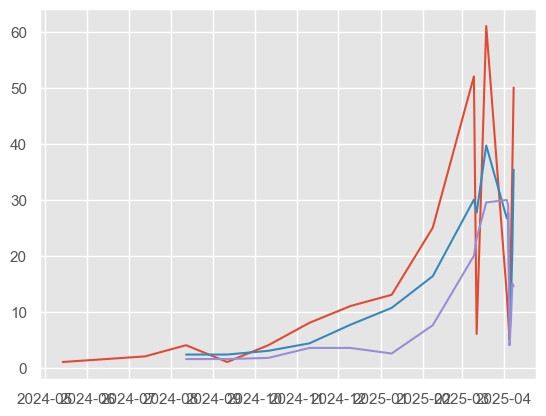

In [351]:
# lets plot those values
plt.plot(new_df.JobPostings)   ##time series data
plt.plot(rolmean)   ## rolling mean
plt.plot(rolstd)      ## rolling std

### plotting After smoothening

In [352]:
# lets plot after smoothing
rolmean = new_df['JobPostings'].rolling(5).mean()  ## smoothning by changing the rolling mean values

rolstd = new_df['JobPostings'].rolling(5).std()    ## smothning by changing the rolling standard deviation values

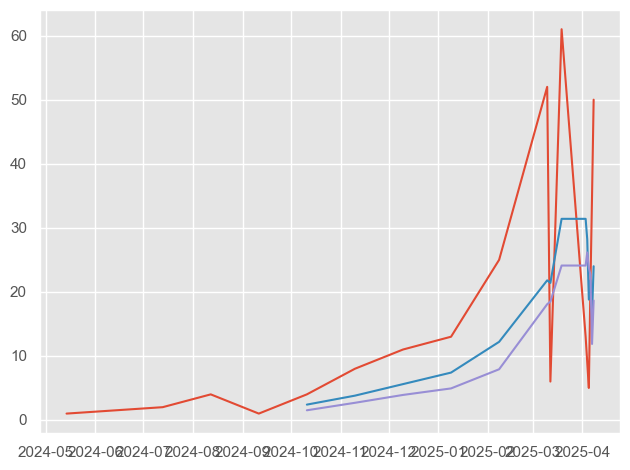

In [353]:
# now plot those values after smoothening
plt.plot(new_df.JobPostings)   ##time series data
plt.plot(rolmean)   ## rolling mean
plt.plot(rolstd)      ## rolling std
plt.tight_layout()  # Automatic margin adjustment
plt.show()

### Stationarity check

In [354]:
# importing the adfuller for checking the stationarity
from statsmodels.tsa.stattools import adfuller
diff_series = new_df['JobPostings'].diff().dropna()
adft = adfuller(diff_series)
adft[0:4]

(-2.7692411097143994, 0.06280355580536126, 6, 10)

In [355]:
# lets index on adft values
pd.Series(adft[0:4], index= ['test stats', 'P-value', 'lag', 'data points'])

test stats     -2.769241
P-value         0.062804
lag             6.000000
data points    10.000000
dtype: float64

In [356]:
# lets create a function where all stationarity details shuould be present

# Test for staionarity
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(12).mean() # rolling mean
    rolstd = timeseries.rolling(12).std() # rolling standard deviation

    # Plot rolling statistics:
    plt.figure(figsize = (18,8))
    plt.grid('both')
    plt.plot(timeseries, color='blue',label='Original', linewidth = 3)
    plt.plot(rolmean, color='red', label='Rolling Mean',linewidth = 3)
    plt.plot(rolstd, color='black', label = 'Rolling Std',linewidth = 4)
    plt.legend(loc='best', fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
    plt.title('Rolling Mean and Standard Deviation', fontsize = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show(block=False)

    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)

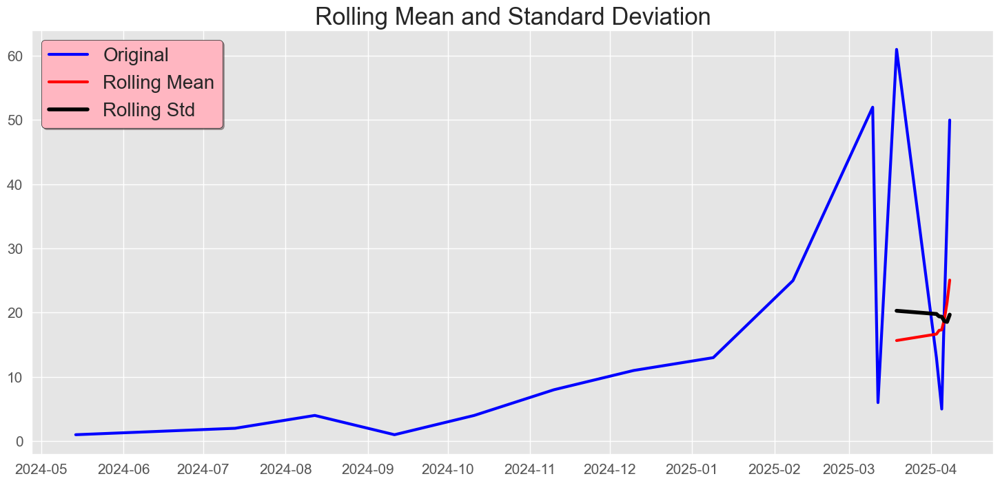

Results of dickey fuller test
Test Statistics                 0.032256
p-value                         0.961120
No. of lags used                7.000000
Number of observations used    10.000000
critical value (1%)            -4.331573
critical value (5%)            -3.232950
critical value (10%)           -2.748700
dtype: float64


In [357]:
# lets test for stationarity
test_stationarity(new_df.JobPostings)

In [358]:
# smoothening on linkedin data

# lets create a function where all stationarity details shuould be present

# Test for staionarity
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(12).mean() # rolling mean
    rolstd = timeseries.rolling(12).std() # rolling standard deviation

    # Plot rolling statistics:
    plt.figure(figsize = (18,8))
    plt.grid('both')
    plt.plot(timeseries, color='blue',label='Original', linewidth = 3)
    plt.plot(rolmean, color='red', label='Rolling Mean',linewidth = 3)
    plt.plot(rolstd, color='black', label = 'Rolling Std',linewidth = 4)
    plt.legend(loc='best', fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
    plt.title('Rolling Mean and Standard Deviation', fontsize = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show(block=False)

    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)

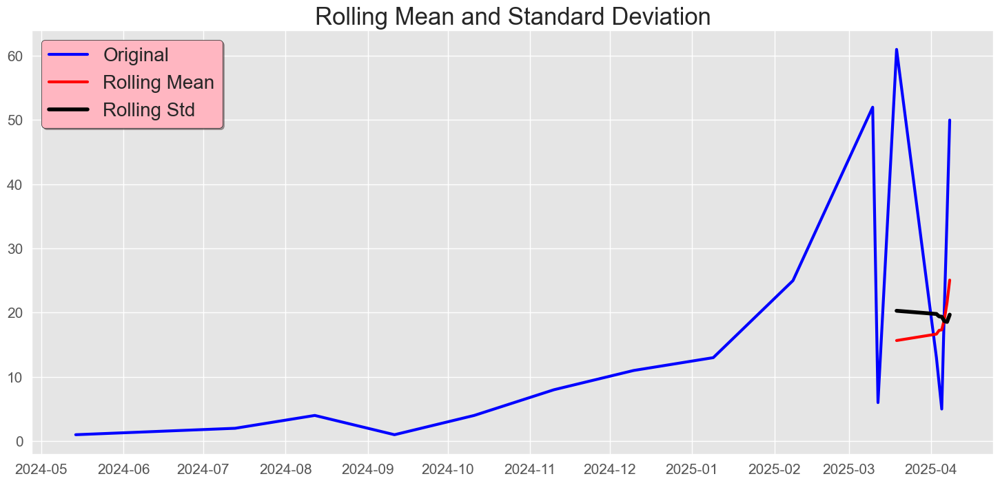

Results of dickey fuller test
Test Statistics                 0.032256
p-value                         0.961120
No. of lags used                7.000000
Number of observations used    10.000000
critical value (1%)            -4.331573
critical value (5%)            -3.232950
critical value (10%)           -2.748700
dtype: float64


In [359]:
# performing the stationaruty test on our linkedin data
test_stationarity(new_df.JobPostings)

### Time series Decomposition

In [360]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(new_df['JobPostings'], period= 3)
result

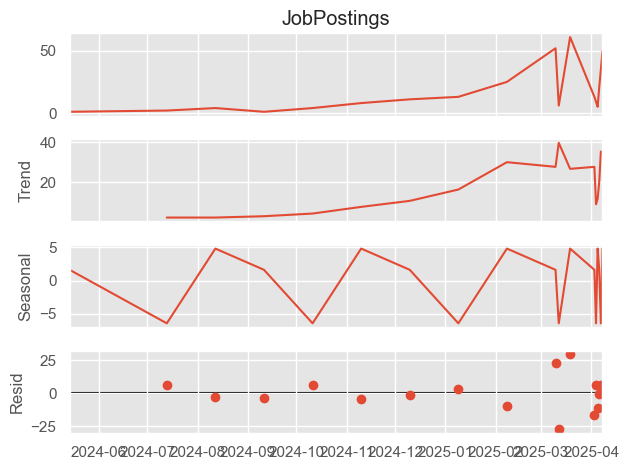

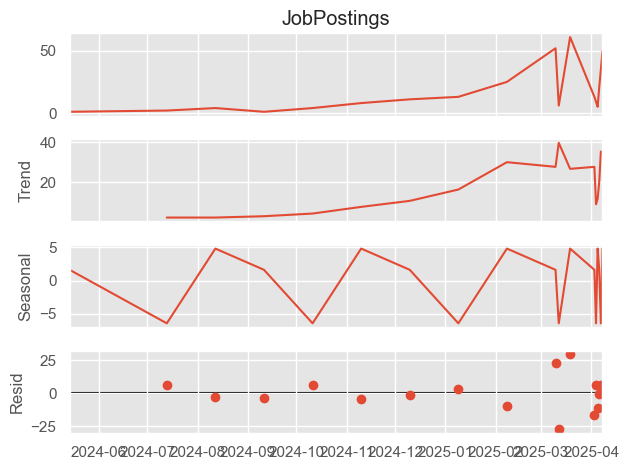

In [361]:
# plot the result
result.plot()

 Observation
-  Here we got two plots: one for additive and second for multiplicative, we can go with one also but default this
go will both perametter, we can chage it with our conviniant.

-  We also check seperatly the trend, seasonl, resid values with graph

### ACF AND PACF

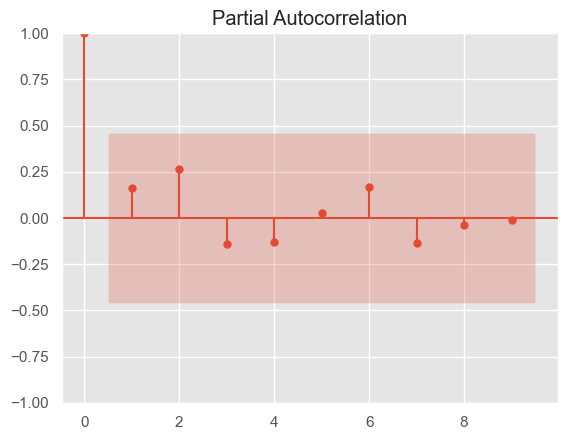

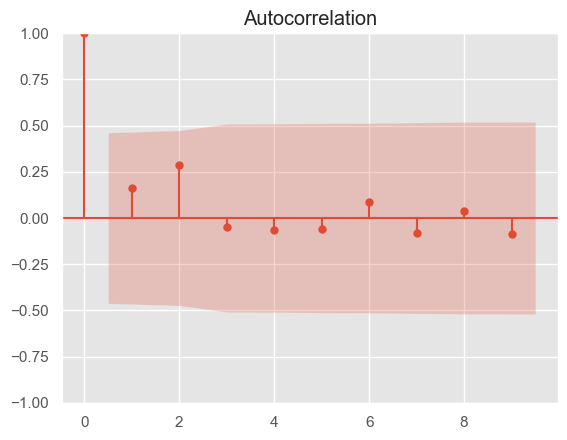

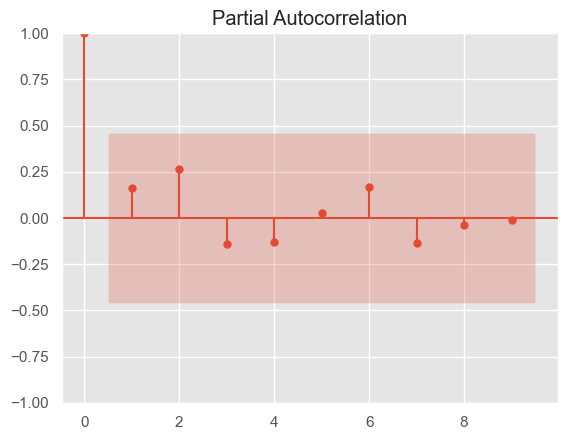

In [362]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(new_df.JobPostings)
plot_pacf(new_df.JobPostings)

Preprocessing of the data

- 1. fill the miss(here not required)

- 2. convert data into stationary time series

- 3. if necessary then normalize the data(here not required)

- 4. split the data into train and test

- 5. clean the data by removing the outlier

In [363]:
# non stationary to stationary
df_imp = new_df['JobPostings']
df_imp

Published Date
2024-05-14     1
2024-07-13     2
2024-08-12     4
2024-09-11     1
2024-10-11     4
2024-11-10     8
2024-12-10    11
2025-01-09    13
2025-02-08    25
2025-03-10    52
2025-03-12     6
2025-03-19    61
2025-04-03    13
2025-04-04     9
2025-04-05     5
2025-04-06    21
2025-04-07    35
2025-04-08    50
Name: JobPostings, dtype: int64

In [364]:
df_imp.diff(1)      ## changing values in diff

Published Date
2024-05-14     NaN
2024-07-13     1.0
2024-08-12     2.0
2024-09-11    -3.0
2024-10-11     3.0
2024-11-10     4.0
2024-12-10     3.0
2025-01-09     2.0
2025-02-08    12.0
2025-03-10    27.0
2025-03-12   -46.0
2025-03-19    55.0
2025-04-03   -48.0
2025-04-04    -4.0
2025-04-05    -4.0
2025-04-06    16.0
2025-04-07    14.0
2025-04-08    15.0
Name: JobPostings, dtype: float64

In [365]:
df_imp = df_imp.diff()
df_imp = df_imp.dropna()

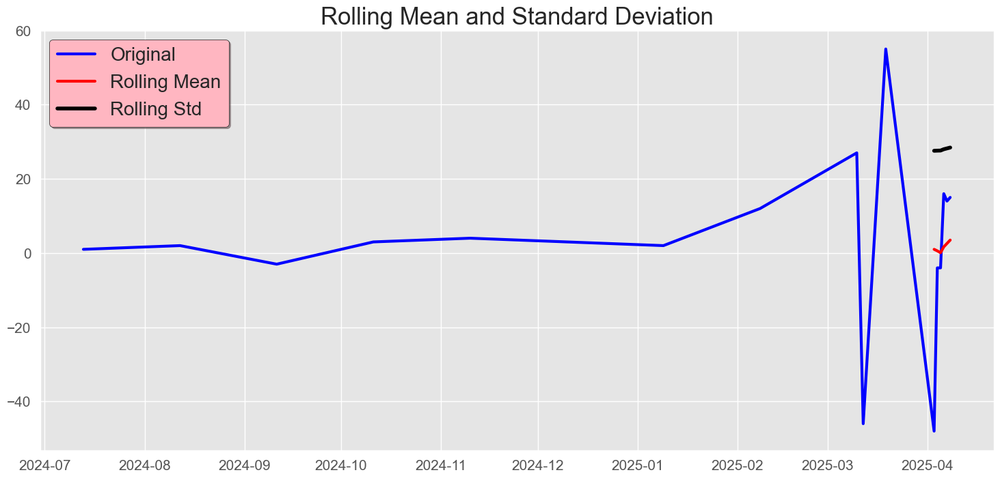

Results of dickey fuller test
Test Statistics                -2.769241
p-value                         0.062804
No. of lags used                6.000000
Number of observations used    10.000000
critical value (1%)            -4.331573
critical value (5%)            -3.232950
critical value (10%)           -2.748700
dtype: float64


In [366]:
# now passing df-imp data into test-stationary function
test_stationarity(df_imp)

In [368]:
# train test split our data
df_imp[0:-10]   ##training data

Published Date
2024-07-13    1.0
2024-08-12    2.0
2024-09-11   -3.0
2024-10-11    3.0
2024-11-10    4.0
2024-12-10    3.0
2025-01-09    2.0
Name: JobPostings, dtype: float64

In [369]:
df_imp[-10:]   ##testing data

Published Date
2025-02-08    12.0
2025-03-10    27.0
2025-03-12   -46.0
2025-03-19    55.0
2025-04-03   -48.0
2025-04-04    -4.0
2025-04-05    -4.0
2025-04-06    16.0
2025-04-07    14.0
2025-04-08    15.0
Name: JobPostings, dtype: float64

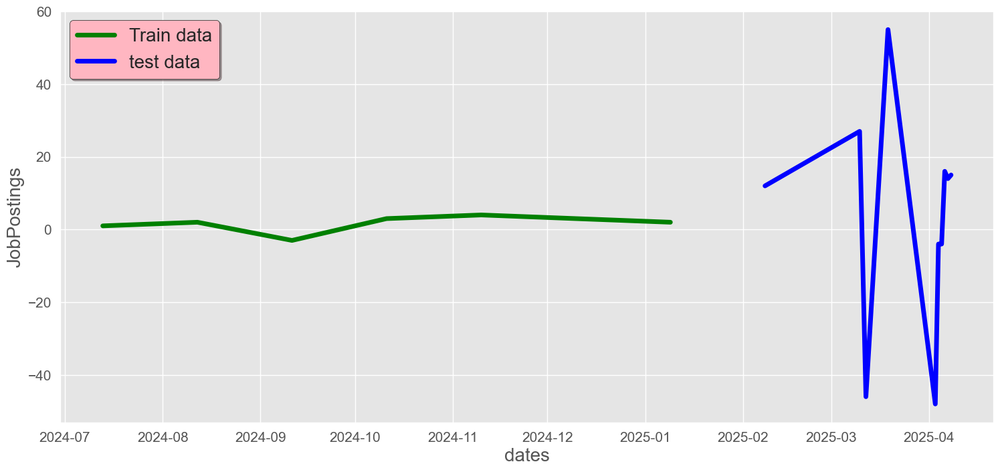

In [370]:
##ploting the train test splitted data into graph

# split data into train and testing data
train_data = df_imp[0:-10]
test_data = df_imp[-10:]
plt.figure(figsize= (18,8))
plt.grid(True)
plt.xlabel('dates', fontsize = 20 )
plt.ylabel('JobPostings', fontsize = 20)
plt.xticks(fontsize = 15 )
plt.yticks(fontsize = 15 )
plt.plot(train_data, 'green', label = 'Train data', linewidth = 5)
plt.plot(test_data, 'blue', label = 'test data', linewidth = 5)
plt.legend(fontsize = 20, shadow = True, facecolor = 'lightpink', edgecolor = 'k')

### Model Building

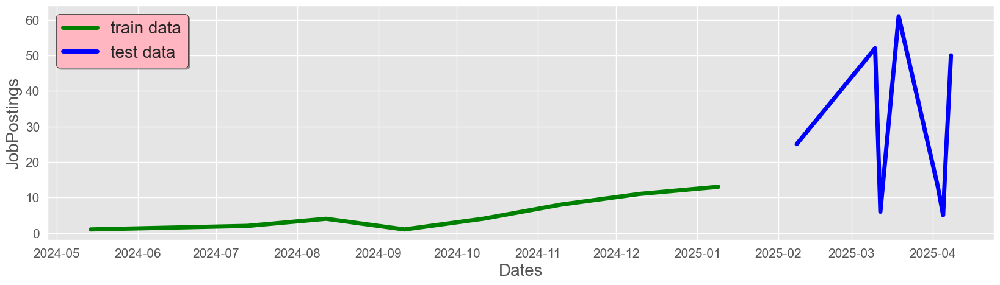

In [371]:
train_data = new_df['JobPostings'][0:-10]       ##train data
test_data = new_df['JobPostings'][-10:]           ## testing data
plt.figure(figsize=(20,5))
plt.grid(True)
plt.xlabel('Dates', fontsize = 20)
plt.ylabel('JobPostings', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.plot(train_data, 'green', label = 'train data', linewidth = 5)
plt.plot(test_data, 'blue', label = 'test data', linewidth = 5)
plt.legend(fontsize = 20, shadow = True, facecolor = 'lightpink', edgecolor = 'k')

In [372]:
new_df['JobPostings']

Published Date
2024-05-14     1
2024-07-13     2
2024-08-12     4
2024-09-11     1
2024-10-11     4
2024-11-10     8
2024-12-10    11
2025-01-09    13
2025-02-08    25
2025-03-10    52
2025-03-12     6
2025-03-19    61
2025-04-03    13
2025-04-04     9
2025-04-05     5
2025-04-06    21
2025-04-07    35
2025-04-08    50
Name: JobPostings, dtype: int64

In [373]:
# importing the libraries
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

In [374]:
train_data

Published Date
2024-05-14     1
2024-07-13     2
2024-08-12     4
2024-09-11     1
2024-10-11     4
2024-11-10     8
2024-12-10    11
2025-01-09    13
Name: JobPostings, dtype: int64

In [ ]:
history = [x for x in train_data]

In [375]:
# passing train data into the arima model
model = ARIMA(history, order= (1,1,1) )  ## p,d,q Values == lags values

In [376]:
model = model.fit()  # fitting the model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   21
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -135.774
Date:                Tue, 13 May 2025   AIC                            277.549
Time:                        13:23:30   BIC                            280.536
Sample:                             0   HQIC                           278.132
                                 - 21                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5928      0.728      0.815      0.415      -0.834       2.019
ma.L1         -0.9961     11.493     -0.087      0.931     -23.521      21.529
sigma2      4.234e+04   4.71e+05      0.090      0.928   -8.81e+05    9.65e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 2.58
Prob(Q):                              0.86   Prob(JB):                         0.28
Heteroskedasticity (H):             101.48   Skew:                            -0.30
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Now we want to Forecast the Next values

In [377]:
model.forecast()

array([137.32408909])

In [378]:
# getting the MSE values
mean_squared_error([test_data[0]], model.forecast())

12616.700989506468

In [379]:
# getting the RMSE value
np.sqrt(mean_squared_error([test_data[0]], model.forecast()))

112.32408908825599

In [381]:
def train_arima_model(X, y, arima_order):
    history = [x for x in X]  ## prepare training dataset
    predictions = list()     ## make prediction list

    for t in range(len(y)):
        model  = ARIMA(history, order= arima_order)
        model_fit = model.fit()
        yhat  = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(y[t])

    # calculate out of sample error
    rmse = np.sqrt(mean_squared_error(y, predictions))
    return rmse

In [382]:
# evaluate different combinations of p,d,q values for an ARIMA model to get the best order for ARIMA model
def evaluate_models(dataset, test, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float('inf'), None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    rmse = train_arima_model(dataset, test, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    print('ARIMA%s RMSE= %.3f'  %(order, rmse))
                except:
                    continue
    print('Best ARIMA%s RMSE= %.3f'  %(best_cfg, best_score))

In [383]:
import warnings
warnings.filterwarnings('ignore')

p_values = range(0,3)
d_values = range(0,3)
q_values = range(0,3)

evaluate_models(train_data, test_data, p_values, d_values, q_values)

ARIMA(0, 0, 0) RMSE= 25.675
ARIMA(0, 0, 1) RMSE= 27.088
ARIMA(0, 0, 2) RMSE= 32.053
ARIMA(0, 1, 0) RMSE= 30.045
ARIMA(0, 1, 1) RMSE= 28.632
ARIMA(0, 1, 2) RMSE= 30.281
ARIMA(0, 2, 0) RMSE= 53.670
ARIMA(0, 2, 1) RMSE= 36.007
ARIMA(0, 2, 2) RMSE= 37.559
ARIMA(1, 0, 0) RMSE= 26.804
ARIMA(1, 0, 1) RMSE= 31.042
ARIMA(1, 0, 2) RMSE= 35.781
ARIMA(1, 1, 0) RMSE= 30.895
ARIMA(1, 1, 1) RMSE= 32.863
ARIMA(1, 1, 2) RMSE= 28.538
ARIMA(1, 2, 0) RMSE= 37.634
ARIMA(1, 2, 1) RMSE= 33.587
ARIMA(1, 2, 2) RMSE= 38.931
ARIMA(2, 0, 0) RMSE= 33.874
ARIMA(2, 0, 1) RMSE= 34.908
ARIMA(2, 0, 2) RMSE= 32.816
ARIMA(2, 1, 0) RMSE= 34.498
ARIMA(2, 1, 1) RMSE= 35.865
ARIMA(2, 1, 2) RMSE= 32.458
ARIMA(2, 2, 0) RMSE= 35.109
ARIMA(2, 2, 1) RMSE= 37.028
ARIMA(2, 2, 2) RMSE= 58.517
Best ARIMA(0, 0, 0) RMSE= 25.675


In [384]:
# now with best arima values lets create our final model
history = [x for x in train_data]
predictions = list()
conf_list = list()
for t in range(len(test_data)):
    model = ARIMA(history,order=(0,1,2))
    model_fit = model.fit()
    fc = model_fit.forecast(alpha = 0.05)
    predictions.append(fc)
    history.append(test_data[t])
print('RMSE of ARIMA Model:', np.sqrt(mean_squared_error(test_data, predictions)))

RMSE of ARIMA Model: 30.280770006402324


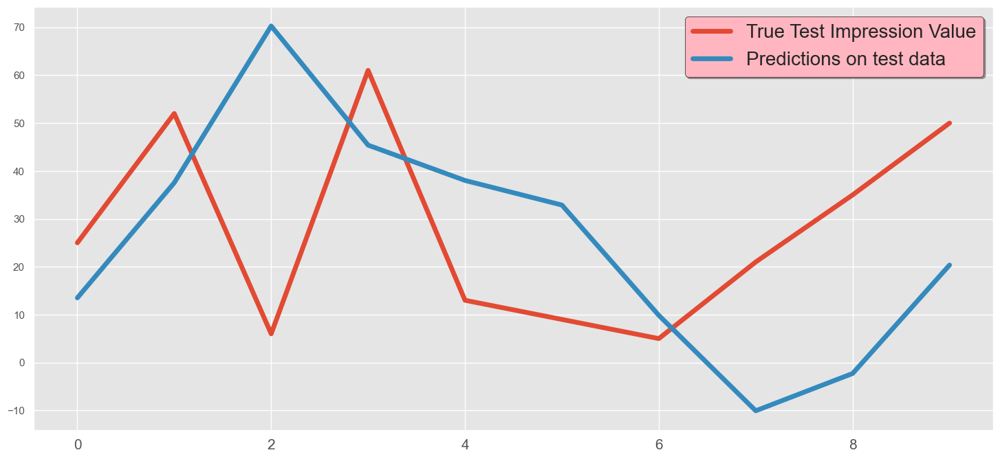

In [385]:
# now plotting the predicted data

plt.figure(figsize=(18,8))
plt.grid(True)
plt.plot(range(len(test_data)),test_data, label = 'True Test Impression Value', linewidth = 5)
plt.plot(range(len(predictions)), predictions, label = 'Predictions on test data', linewidth = 5)
plt.xticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.legend(fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
plt.show()

In [386]:
# now convert forecast values into series
fc_series = pd.Series(predictions, index= test_data.index)

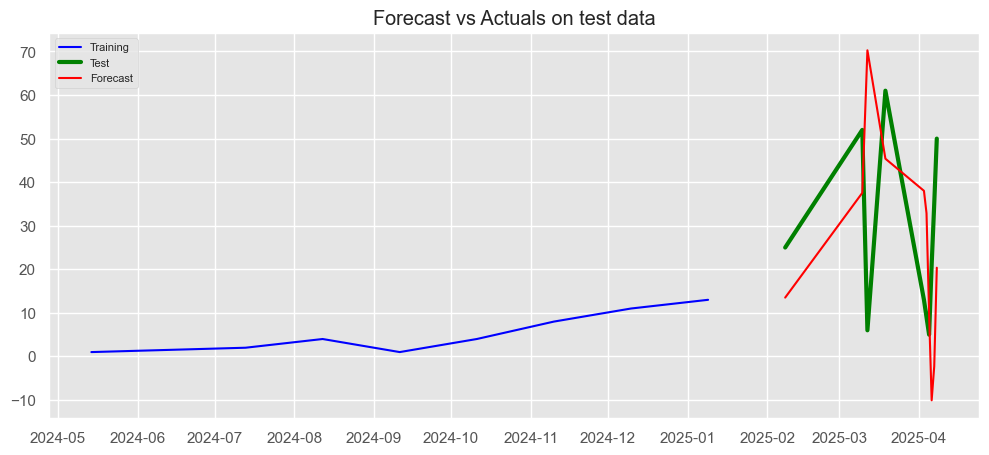

In [387]:
# now plot the fc-series
# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train_data, label='Training', color = 'blue')
plt.plot(test_data, label='Test', color = 'green', linewidth = 3)
plt.plot(fc_series, label='Forecast', color = 'red')
plt.title('Forecast vs Actuals on test data')
plt.legend(loc='upper left', fontsize=8)
plt.show()

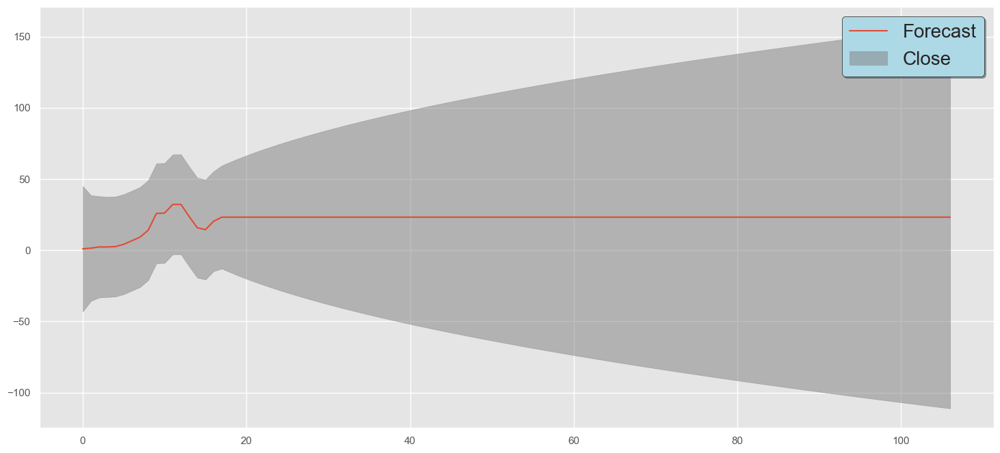

In [388]:
# now ploting  forecaset the next 90 days future values in the plot
from statsmodels.graphics.tsaplots import plot_predict
fig = plt.figure(figsize=(18,8))
ax1 = fig.add_subplot(111)
plot_predict(result=model_fit,start=1, end=len(df_imp)+90, ax = ax1)
plt.grid("both")
plt.legend(['Forecast','Close','95% confidence interval'],fontsize = 20, shadow=True,facecolor='lightblue',edgecolor = 'k')
plt.show()

### SARIMA

In [389]:
# evaluate parameters for sarimax
import warnings
warnings.filterwarnings('ignore')

history = [x for x in train_data]
predictions = list()
conf_list = list()
for t in range(len(test_data)):
    model = sm.tsa.statespace.SARIMAX(history, order = (0,1,0), seasonal_order = (1,1,1,3))
    model_fit = model.fit()
    fc = model_fit.forecast()
    predictions.append(fc)
    history.append(test_data[t])
print('RMSE of SARIMA Model:', np.sqrt(mean_squared_error(test_data, predictions)))

RMSE of SARIMA Model: 36.36747395771241


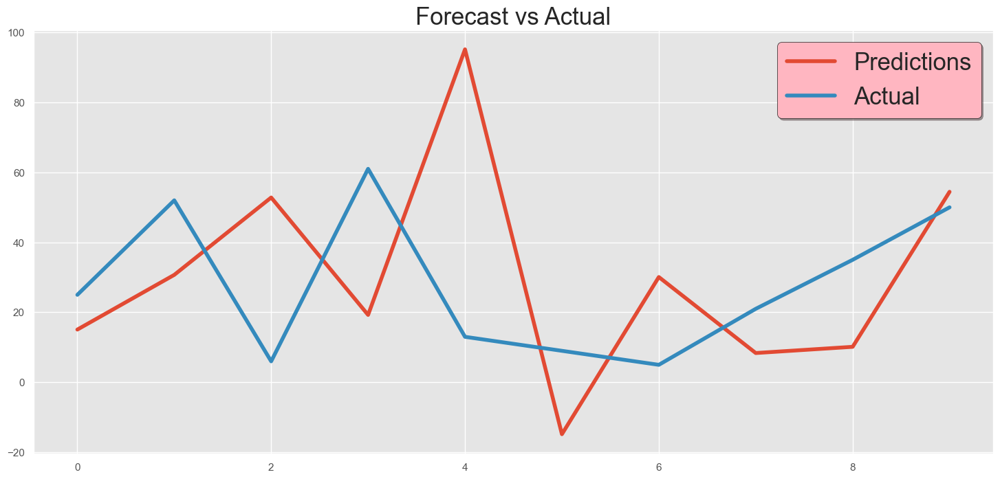

In [395]:
# Flatten predictions and actual values to 1D arrays
predictions = np.array(predictions).flatten()
test_data = np.array(test_data).flatten()

# Ensure both arrays are the same length
min_len = min(len(predictions), len(test_data))
predictions = predictions[:min_len]
test_data = test_data[:min_len]

# Plotting
plt.figure(figsize=(18, 8))
plt.title('Forecast vs Actual', fontsize=25)
plt.plot(range(min_len), predictions, label='Predictions', linewidth=4)
plt.plot(range(min_len), test_data, label='Actual', linewidth=4)
plt.legend(fontsize=25, shadow=True, facecolor='lightpink', edgecolor='k')
plt.show()

## 2.3 Analysis hard skills and soft skills of machine operator

### 2.3.1 Analysis hard skills

In [ ]:
# read data
file_path = r"C:\Users\王晓琴\linkedin_Machine_final.xlsx"
df_machine = pd.read_excel(file_path, engine="openpyxl")
# process data
#df_machine = df_machine.dropna(subset=["Published Date"]).reset_index(drop=True)
df_machine.head()

In [ ]:
# Drop rows where all 6 columns are identical
#df_machine = df_machine.drop_duplicates(subset=['Job Title', 'Company', 'Location', 'Published Date', 'Job Link', 'Job Description', 'Requirements'])

In [ ]:
hard_skills_2 = [ "MACHINE OPERATION","CNC",
    "PREVENTIVE MAINTENANCE","ADJUST MACHINE SETTINGS","OPERATE INJECTION MOLDING MACHINES","OPERATE PRESS MACHINES","PACKAGING MACHINERY OPERATION",
     "POWER TOOLS","HAND TOOLS","MEASURING TOOLS","CALIPERS","MICROMETERS","GAUGES","FORKLIFT OPERATION","HOIST OPERATION","CRANE OPERATION",
    "CONVEYOR SYSTEMS","ROBOTIC ARMS","PLC SYSTEMS","WELDING EQUIPMENT","Quality control inspection","Read blueprints and schematics",
    "ERP","HMI","SCADA","MICROSOFT","DATA ENTRY",

# PROGRAMMING
'PYTHON', 'SQL',

# DATA WRANGLING & ANALYSIS
'PANDAS', 'NUMPY', 'DASK', 'DATA WRANGLING', 'DATA CLEANING','EDA', 

# STATISTICS & TESTING
'STATISTICS', 'PROBABILITY',
# MACHINE LEARNING
'SCIKIT-LEARN', 'TENSORFLOW', 'PYTORCH', 'KERAS',
'FEATURE ENGINEERING', 'HYPERPARAMETER TUNING', 'MODEL EVALUATION',

# VISUALIZATION
'MATPLOTLIB', 'SEABORN', 'PLOTLY', 'TABLEAU', 'POWER BI', 'DASH', 'STREAMLIT',

# DATABASES & BIG DATA
'MYSQL', 'POSTGRESQL', 'SQLITE', 'MONGODB', 'CASSANDRA',
'HADOOP', 'HIVE', 'SPARK', 'PYSPARK',

# CLOUD & DEPLOYMENT
'AWS', 'GCP', 'AZURE', 'DOCKER', 'KUBERNETES',
'FLASK', 'FASTAPI', 'CI/CD',

# ML OPS & AUTOMATION
'MLFLOW', 'DVC', 'AIRFLOW', 'GIT',

# OTHERS
'NLP', 'NATURAL LANGUAGE PROCESSING', 'COMPUTER VISION',
'RECOMMENDATION SYSTEM', 'REINFORCEMENT LEARNING',
]

# Adding above technical_skills into our DataFrame ( filling them with 0 )
# Setting the values of technical skills columns to 0
df_machine[hard_skills_2] = 0

# Displaying the first few rows of the DataFrame
df_machine.head()

In [ ]:
# Extracting skills(keywords) from job_description coloumn
# We can perform same task with nlptk or keybert libraries
# Exammple of list comprehension
skills_3 = df_machine["Job Description"].str.upper().apply(lambda x: [i.upper() for i in hard_skills_2 if i in x])

In [ ]:
skills_3

In [ ]:
# Filling our Skills_columns and flaging them with appropriate value
# Setting the values of technical skills columns to 1 based on skill sets
for index, skill_set in enumerate(skills_3):
    for x in skill_set:
        #df[x][index] = 1
        df_machine.loc[index, x] = 1

In [ ]:
df_machine["PYTHON"][4]

In [ ]:
# Displaying the first few rows of the DataFrame
df_machine.head()

In [ ]:
df_machine.to_excel("hard_skills_2_extracted_keywords_1.xlsx", index=False) 

In [ ]:
for i in hard_skills_2:
    if len(df_machine[i].unique()) == 1:
        df_machine.drop(i, axis=1, inplace=True)

In [ ]:
# Jobs that require Specific particular skill
# Creating a DataFrame for skills count

# Dropping unnecessary columns from the DataFrame
df_machine_hard = df_machine.drop(["Job Title", "Job Description", "Requirements", "Source File", "Company", "Published Date", "Job Link", "Location"], axis=1)

df_machine_hard

In [ ]:
# Initializing an empty dictionary to store skill counts
skill_dic = {}
# Counting the number of jobs requiring each skill
for i in df_machine_hard.columns:
    skill_dic[i] = df_machine[i].sum()

# Converting the dictionary to a list of tuples
data = list(skill_dic.items())

# Creating a DataFrame from the skill count data
skill_df = pd.DataFrame(data, columns=['Skill', 'Number of jobs requiring the skill'])
skill_df 

In [ ]:
#plt.figure(figsize=(40,20),dpi=100)
#chart = sns.barplot(x=skill_df["Skill"],y=skill_df["Number of jobs requiring the skill"].astype(str),palette="icefire")
#plt.title("Number of jobs that require a particular skill",size=45)
#plt.ylabel("Number of jobs",size=42,rotation=90)
#plt.xlabel("Skill",size=42,rotation=90)
#plt.xticks(fontsize=48,rotation=90)
#plt.yticks(fontsize=48,rotation=90)
#chart.bar_label(chart.containers[0],size=48)
plt.figure(figsize=(30, 15), dpi=100)  # Slightly smaller figure for better proportions

# Convert y-values to numeric if they're strings
skill_df["Number of jobs requiring the skill"] = pd.to_numeric(skill_df["Number of jobs requiring the skill"], errors='coerce')

# Create the plot with adjusted parameters
chart = sns.barplot(
    x="Skill",
    y="Number of jobs requiring the skill",
    data=skill_df,
    palette="icefire",
    order=skill_df.sort_values("Number of jobs requiring the skill", ascending=False)["Skill"]
)

# Title and labels with improved formatting
plt.title("Number of Jobs Requiring Each Skill", size=24, pad=20)
plt.ylabel("Number of Jobs", size=20)
plt.xlabel("Skill", size=20)

# Rotate x-axis labels for better readability
chart.set_xticklabels(
    chart.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=12,
    rotation_mode='anchor'
)

# Adjust y-axis ticks
plt.yticks(fontsize=14)

# Add value labels on bars with improved formatting
for container in chart.containers:
    chart.bar_label(
        container,
        fmt='%.0f',
        label_type='edge',
        padding=3,
        fontsize=12,
        rotation=0
    )

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show plot
plt.show()

This graph shows the hard skills extracted from machine operator jobs and their corresponding job numbers. The graph shows that ERP, Git, Python and other skills are leading in terms of the number of jobs corresponding to them. Among them, the number of ERP-related jobs reaches 256, indicating that there is a high demand for machine operators who are familiar with ERP systems in operation management, which may be used in production process planning, resource deployment, etc. Git follows with 205, reflecting that there is a significant demand for people with Git skills in work scenarios involving code management and version control, which may be related to automated production program development, equipment program development, and equipment program development. Git follows with 205 jobs, reflecting the significant demand for people with Git skills in job scenarios involving code management and version control, perhaps related to automated production program development, equipment program maintenance, etc. Python skills correspond to 163 jobs, reflecting its importance in data processing, automation scripting, etc., such as for analysing production data and writing equipment automation control scripts. It can be concluded that hard skills in ERP, Git, and Python are more in demand for current machine operator positions.

In [ ]:
from docx import Document
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Read content from a Word document
def read_docx_file(file_path):
    doc = Document(file_path)
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return "\n".join(full_text)

# Example usage
file_path = 'tmp_machine_hard.docx'  # Replace with your Word document path
text = read_docx_file(file_path)

# Specify the font path that supports Chinese (adjust as needed)
font_path = 'simhei.ttf'  # Make sure the path to your font is correct

# Generate the word cloud with specified font
wordcloud = WordCloud(font_path=font_path, width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Save the word cloud as an image
wordcloud.to_file('wordcloud_machine_hard.png')

### 2.3.2 Analysis soft skills

In [ ]:
# read data
file_path = r"C:\Users\王晓琴\linkedin_Machine_final.xlsx"
df_machine = pd.read_excel(file_path, engine="openpyxl")
# process data
#df_machine = df_machine.dropna(subset=["Published Date"]).reset_index(drop=True)
df_machine.head()

In [ ]:
soft_skills_2 = [
    "COMMUNICATION", "TEAMWORK", "COLLABORATION", "PROBLEM SOLVING", "CRITICAL THINKING", "CREATIVITY", "ADAPTABILITY", "CURIOSITY", "EMPATHY",
    "TIME MANAGEMENT", "PROJECT MANAGEMENT", "LEADERSHIP", "EMOTIONAL INTELLIGENCE", "PRESENTATION", "NEGOTIATION", "INTERPERSONAL SKILLS",
    "STORYTELLING", "DECISION MAKING", "ACCOUNTABILITY", "ACTIVE LISTENING", "CONFLICT RESOLUTION", "GROWTH MINDSET", "STRATEGIC THINKING",
    "STAKEHOLDER MANAGEMENT", "RESILIENCE", "OPEN-MINDEDNESS", "INFLUENCING", "SELF-MOTIVATION", "INITIATIVE", "AGILITY",
    "MULTITASKING", "LEARNING AGILITY", "CROSS-FUNCTIONAL COMMUNICATION", "ANALYTICAL THINKING", "DETAIL ORIENTATION", "WORK ETHIC",
    "RESPONSIBILITY", "COLLABORATION WITH NON-TECHNICAL TEAMS", "FLEXIBILITY", "DIPLOMACY", "MENTORING", "FACILITATION",
    "CONSENSUS BUILDING", "BUSINESS COMMUNICATION", "PROFESSIONALISM", "CONFIDENCE", "RESPECTFULNESS", "FEEDBACK HANDLING",
    "DELEGATION", "TRUST BUILDING", "CULTURAL AWARENESS", "ORGANIZATIONAL SKILLS", "TASK PRIORITIZATION", "EXPECTATION MANAGEMENT",
    "CLIENT-FACING SKILLS", "NETWORKING", "PERSUASIVENESS", "RELATIONSHIP BUILDING", "CHANGE MANAGEMENT", "COACHING", "DECISION SUPPORT",
    "GOAL SETTING", "MOTIVATIONAL SKILLS", "PATIENCE", "ACCOUNT MANAGEMENT", "TEAM EMPOWERMENT", "USER EMPATHY", "INTERVIEWING SKILLS",
    "PEER REVIEW SKILLS", "CONSTRUCTIVE FEEDBACK", "REMOTE COLLABORATION", "VIRTUAL COMMUNICATION", "PERSUASIVE WRITING", "MEETING FACILITATION",
    "VISION SETTING", "EMPOWERMENT", "WORK-LIFE BALANCE AWARENESS", "NONVERBAL COMMUNICATION", "FOCUS MANAGEMENT", "PROCESS THINKING",
    "SENSEMAKING", "DIPLOMATIC COMMUNICATION", "SUPPORTIVENESS", "ETHICAL JUDGEMENT", "CONSENSUS THINKING", "COLLABORATIVE PLANNING",
    "TRANSPARENCY"
]

# Adding above technical_skills into our DataFrame ( filling them with 0 )
# Setting the values of technical skills columns to 0
df_machine[soft_skills_2] = 0

# Displaying the first few rows of the DataFrame
df_machine.head()

In [ ]:
# Extracting skills(keywords) from job_description coloumn
# We can perform same task with nlptk or keybert libraries
# Exammple of list comprehension
skills_4 = df_machine["Job Description"].str.upper().apply(lambda x: [i.upper() for i in soft_skills_2 if i in x])

In [ ]:
skills_4

In [ ]:
# Filling our Skills_columns and flaging them with appropriate value
# Setting the values of technical skills columns to 1 based on skill sets
for index, skill_set in enumerate(skills_4):
    for x in skill_set:
        #df[x][index] = 1
        df_machine.loc[index, x] = 1

In [ ]:
df_machine["COMMUNICATION"][4]

In [ ]:
df_machine.to_excel("soft_skills_3_extracted_keywords.xlsx", index=False) 

In [ ]:
for i in soft_skills_2:
    if len(df_machine[i].unique()) == 1:
        df_machine.drop(i, axis=1, inplace=True)

In [ ]:
# Jobs that require Specific particular skill
# Creating a DataFrame for skills count

# Dropping unnecessary columns from the DataFrame
df_machine_soft = df_machine.drop(["Job Title", "Job Description", "Requirements", "Source File", "Company", "Published Date", "Job Link", "Location"], axis=1)

df_machine_soft

In [ ]:
# Initializing an empty dictionary to store skill counts
skill_dic = {}
# Counting the number of jobs requiring each skill
for i in df_machine_soft.columns:
    skill_dic[i] = df_machine[i].sum()

# Converting the dictionary to a list of tuples
data = list(skill_dic.items())

# Creating a DataFrame from the skill count data
skill_df = pd.DataFrame(data, columns=['Skill', 'Number of jobs requiring the skill'])
skill_df 

In [ ]:
#plt.figure(figsize=(40,20),dpi=100)
#chart = sns.barplot(x=skill_df["Skill"],y=skill_df["Number of jobs requiring the skill"].astype(str),palette="icefire")
#plt.title("Number of jobs that require a particular skill",size=45)
#plt.ylabel("Number of jobs",size=42,rotation=90)
#plt.xlabel("Skill",size=42,rotation=90)
#plt.xticks(fontsize=48,rotation=90)
#plt.yticks(fontsize=48,rotation=90)
#chart.bar_label(chart.containers[0],size=48)
plt.figure(figsize=(30, 15), dpi=100)  # Slightly smaller figure for better proportions

# Convert y-values to numeric if they're strings
skill_df["Number of jobs requiring the skill"] = pd.to_numeric(skill_df["Number of jobs requiring the skill"], errors='coerce')

# Create the plot with adjusted parameters
chart = sns.barplot(
    x="Skill",
    y="Number of jobs requiring the skill",
    data=skill_df,
    palette="icefire",
    order=skill_df.sort_values("Number of jobs requiring the skill", ascending=False)["Skill"]
)

# Title and labels with improved formatting
plt.title("Number of Jobs Requiring Each Skill", size=24, pad=20)
plt.ylabel("Number of Jobs", size=20)
plt.xlabel("Skill", size=20)

# Rotate x-axis labels for better readability
chart.set_xticklabels(
    chart.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=12,
    rotation_mode='anchor'
)

# Adjust y-axis ticks
plt.yticks(fontsize=14)

# Add value labels on bars with improved formatting
for container in chart.containers:
    chart.bar_label(
        container,
        fmt='%.0f',
        label_type='edge',
        padding=3,
        fontsize=12,
        rotation=0
    )

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show plot
plt.show()

The data in the graph shows that the demand for soft skills in machine operator jobs is characterised by certain features. Communication tops the list with 418 jobs, indicating that in this job, it is crucial to convey information clearly and accurately, and communicate effectively with team members and superiors, which may involve scenarios such as conveying instructions for equipment operation and giving feedback on production problems. Initiative and Collaboration follow with 173 and 160 jobs respectively, indicating that machine operators are expected to take the initiative in identifying and solving problems, as well as having a good spirit of teamwork to ensure the smooth running of the production process. Soft skills such as Leadership, Responsibility and Project Management also have a relatively high number of jobs, with 139, 123 and 98 respectively. This reflects that in some cases, machine operators may need to take on certain leadership responsibilities, be responsible for work tasks, and have certain project management skills, such as participating in equipment maintenance projects, production process optimisation projects, etc. In general, companies are looking for machine operators to be responsible for the maintenance of equipment and the optimisation of production processes. Overall, the soft skills required for machine operator roles are centred on communication, initiative and collaboration, but also on leadership, accountability and project management.

In [ ]:
from docx import Document
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Read content from a Word document
def read_docx_file(file_path):
    doc = Document(file_path)
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return "\n".join(full_text)

# Example usage
file_path = 'tmp_machine_soft.docx'  # Replace with your Word document path
text = read_docx_file(file_path)

# Specify the font path that supports Chinese (adjust as needed)
font_path = 'simhei.ttf'  # Make sure the path to your font is correct

# Generate the word cloud with specified font
wordcloud = WordCloud(font_path=font_path, width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Save the word cloud as an image
wordcloud.to_file('wordcloud_machine_hard.png')

## 2.4 LDA about Machine operator

In [ ]:
#read in data
# df = pd.read_csv('indeed_data.csv', encoding='cp1252')
file_path = r"C:\Users\王晓琴\Desktop\Machine\merged\linkedin_Machine_final.xlsx"
df = pd.read_excel(file_path, engine="openpyxl")
#print first few rows
print(df.shape)
df.head()

### 2.4.1 Topic modelling

In [ ]:
import re
import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Download required NLTK resources (run only once)
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize tokenizer, stopwords, and lemmatizer
wpt = WordPunctTokenizer()
stop_words = set(stopwords.words('english'))
stop_words.update([
    'from', 'subject', 're', 'edu', 'use', 'personal', 'help', 'people', 'youll', 'whats', 'thats', 'inspire', 'equity',
    'excited', 'better', 'analyst', 'entry','filing', 'closing','cicd', 'devops', 'react', 'scalable', 'restful', 
    'dockor', 'jenkins', 'preventive', 'keysight', 'marital', 'regard', 'agoda', 'ancestry', 'seo', 'ubuntu', 'see',
    'enough','opportunity', 'global','customer', 'client', 'across', 'role', 'company', 'drive', 'world', 'value',
    'new', 'growth', 'career', 'need', 'insight', 'culture', 'platform', 'service', 'system', 'operation', 'including',
    'relevant', 'job', 'requirement', 'ensuring', 'within', 'internal', 'ability', 'policy', 'provide','activity',
    'improvement','knowledge', 'operational', 'task','issue','technology', 'technical', 'engineering', 'tool', 
    'test', 'using', 'computer', 'science', 'best', 'practice', 'understanding','basis','safe', 'design','disability', 
    'status', 'national', 'requirement', 'employer','origin', 'religion', 'together', 'employment', 'source','required', 
    'etc', 'added', 'committed', 'direct', 'equal', 'sale', 'part', 'strong', 'relationship', 'study', 'offer', 'financial',
    'key', 'looking', 'level', 'learning', 'content', 'join', 'make', 'one', 'user', 'every', 'diverse', 'bring', 'impact','life', 
    'maintain', 'good', 'report', 'time', 'service', 'drawing', 'well', 'existing', 'line', 'u', 'related', 'gender', 'policy'
])

lemmatizer = WordNetLemmatizer()

def normalize_document(doc, stop_words=stop_words):
    """
    Cleans and normalizes text by:
    - Removing special characters and digits
    - Lowercasing
    - Tokenizing
    - Removing stopwords and one-character tokens
    - Lemmatizing
    - Removing pure numeric tokens
    Returns cleaned text as a single string.
    """
    doc = re.sub(r'[^a-zA-Z\s]', '', doc, re.I | re.A)
    doc = doc.lower().strip()
    tokens = wpt.tokenize(doc)
    filtered_tokens = [
        t for t in tokens
        if t not in stop_words and len(t) > 1 and not t.isnumeric()
    ]
    lemmatized = [lemmatizer.lemmatize(token) for token in filtered_tokens]
    return ' '.join(lemmatized)

In [ ]:
df['Job Description Clean'] = df['Job Description'].apply(normalize_document)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd

# Vectorization
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(df_machine['Job Description Clean'])

# Compute cosine similarity matrix
cos_df = pd.DataFrame(cosine_similarity(X_train_counts))

# Create index pairs (i, j) with corresponding similarity values
i, j = np.indices(cos_df.shape).reshape(2, -1)
cos_values = cos_df.values.reshape(-1)
cos_sim_df = pd.DataFrame({'i': i, 'j': j, 'sim': cos_values})

# Find highly similar duplicates (excluding self-similarity)
cos_rem = cos_sim_df[(cos_sim_df['sim'] > 0.98) & (i != j)]

# Use product of indices to uniquely identify pairs and drop duplicates
cos_rem['i*j'] = cos_rem['i'] * cos_rem['j']
drop_rows = np.unique(cos_rem.drop_duplicates(subset=['i*j'], keep='first')['i'].values)

# Drop duplicate entries from the original dataframe
df = df[~df.index.isin(drop_rows)].reset_index(drop=True)

In [ ]:
df.head()

In [ ]:
corpus = df['Job Description Clean']

### 2.4.2 Top 2 topics for each document

In [ ]:
import nltk 

wpt = nltk.WordPunctTokenizer()
stop_words = nltk.corpus.stopwords.words('english')
lemmatizer = nltk.WordNetLemmatizer()

#Function to pre-process the text information

def normalize_document(doc):
    
    # lower case and remove special characters\whitespaces
    doc = re.sub(r'[^a-zA-Z\s]', '', doc, re.I|re.A) #re.I (ignore case), re.A (ASCII-only matching)
    doc = doc.lower()
    doc = doc.strip()
    
    # tokenize document
    tokens = wpt.tokenize(doc)
    
    # filter stopwords out of document
    filtered_tokens = [token for token in tokens if token not in stop_words]
    
    # Lemmatise document from filtered tokens
    lem_text = [lemmatizer.lemmatize(i) for i in filtered_tokens]
    
    # Remove words that are only one character.
    lem_text = [token for token in lem_text if len(token) > 1]
    
    # Remove numbers, but not words that contain numbers.
    lem_text = [token for token in lem_text if not token.isnumeric()]
    
    doc = ' '.join(lem_text)
    return doc

normalize_corpus = np.vectorize(normalize_document)

norm_corpus = normalize_corpus(corpus)

In [ ]:
from nltk.tokenize import word_tokenize
import gensim.corpora as corpora

#Tokenise the corpus
tokenized_corp = [word_tokenize(i) for i in norm_corpus]

# Create Dictionary
id2word = corpora.Dictionary(tokenized_corp)

#Remove words that don't feature 20 times and those that feature in over 50% of documents
id2word.filter_extremes(no_below=20, no_above=0.5)

texts = tokenized_corp

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [ ]:
print(df['Job Description Clean'].head())

In [ ]:
from gensim.corpora import Dictionary

# Tokenize documents
tokenized_docs = [doc.split() for doc in df['Job Description Clean']]

# Create dictionary
id2word = Dictionary(tokenized_docs)

# Filter extremes (optional but recommended)
id2word.filter_extremes(no_below=2, no_above=0.95)

# Create corpus: list of Bag-of-Words
corpus = [id2word.doc2bow(doc) for doc in tokenized_docs]

# Check if corpus is empty
print(f"Corpus size: {len(corpus)}")
print(f"Dictionary size: {len(id2word)}")

In [ ]:
from gensim.models import LdaMulticore

lda_model = LdaMulticore(
    corpus=corpus,
    id2word=id2word,
    num_topics=2,
    random_state=123,
    chunksize=100,
    passes=100,
    per_word_topics=True
)

In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

The top keywords for each topic are as follows. 

In [ ]:
from pprint import pprint
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

In [ ]:
lda_dict = {0:'Machine technical ', 
            1:'Interpersonal Abilities',
            # 4:'Equal Opportunities',
            # 5:'Analytics & Statistical Modelling',
            # 6:'Senior Projects',
            # 7:'ML, Big Data & Cloud Computing',
            # 8:'Referral Scheme', 
           '-':'-'}

In [ ]:
# Key setting: Avoid joblib multiprocessing errors (especially on Windows)
LDAvis_prepared = gensimvis.prepare(lda_model, corpus, id2word, n_jobs=1)

# Enable inline visualization in notebooks
pyLDAvis.enable_notebook()

# Prepare the visualization again
LDAvis_prepared = gensimvis.prepare(lda_model, corpus, id2word, n_jobs=1)

# Save the interactive LDA visualization as an HTML file
pyLDAvis.save_html(LDAvis_prepared, 'lda_visualization_machine.html')

print("✔️ The HTML file has been successfully saved as 'lda_visualization_machine.html'. Please open it in a browser to view the interactive visualization.")

# Automatically open the visualization in the default web browser
webbrowser.open('lda_visualization_machine.html')

Looking at the vocabulary in the chart, the words ‘team’, ‘experience’, and ‘work’, The words ‘team’, ‘experience’, ‘work’, ‘support’, and ‘communication’ highlight the competence in interpersonal interaction and work quality. The Soft Skills Topic can be summarised as follows: In the machine operator role, teamwork and communication skills are essential. Employees are expected to use their experience to actively participate in teamwork, communicate effectively and support each other to ensure smooth workflow and achievement of work objectives.
‘data’, “machine”, “development”, “skill”, “development”, “development”, “machine”, “machine”, “development”, “development”, “machine”, “development”, “development”, “skill”, “development”, “development”, “skill”, “skill”. skill’, “project”, “product”, ’process The words ‘skill’, ‘project’, ‘product’, ‘process’, and ‘software’ reflect the content related to technical and professional operations. Accordingly, the Topic related to hard skills is summarised as: machine operator The position requires professional skills in data processing, machine operation and development. Employees must be able to execute projects, be familiar with production processes, and use software tools to achieve efficient and accurate production operations and technical applications.

# 3. Analysing nuclear engineer from linkedin

## 3.1 Exploratory Analysis about nuclear engineer

The first dataset used in the study was obtained by crawling LinkedIn, a professional social networking platform, with the keyword ‘nuclear engineer’. A total of 41 job postings related to this keyword were successfully collected through crawling techniques. The dataset covers the core fields such as job title, posting date, company information, job requirements, geographic location and so on.

In [396]:
# read data
file_path = r"C:\Users\王晓琴\Desktop\Nuclear\merged\linkedin_Nuclear_final.xlsx"
df_nuclear = pd.read_excel(file_path, engine="openpyxl")
# process data
#df_machine = df_machine.dropna(subset=["Published Date"]).reset_index(drop=True)
df_nuclear.shape

(41, 8)

In [397]:
df_nuclear['Job Description'].apply(lambda x: len(x.split())).sum()

27257

In [398]:
df_nuclear = df_nuclear.drop_duplicates(subset =['Location', 'Job Description']).reset_index(drop=True)

#Replace missing values so reg expressions can be used for contract and salary
df_nuclear = df_nuclear.fillna('-')

In [399]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import pandas as pd

# Cleaning function (standardised)
def clean_title(title):
    title = str(title).lower()
    title = re.sub(r'[^a-z\s]', '', title)
    title = re.sub(r'\s+', ' ', title).strip()
    return title

df_nuclear['Job Title Clean'] = df_nuclear['Job Title'].apply(clean_title)
df_nuclear.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File,Job Title Clean
0,Instrumentation Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/instrumentat...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,instrumentation engineer
1,QA/QC Engineer,AtkinsRéalis,Greater Kuala Lumpur,4 weeks ago,https://my.linkedin.com/jobs/view/qa-qc-engine...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,qaqc engineer
2,Senior Hydropower Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/senior-hydro...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,senior hydropower engineer
3,Electrical and Instrumentation Designer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/electrical-a...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,electrical and instrumentation designer
4,Sr Hydrologist Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/sr-hydrologi...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,sr hydrologist engineer


### 3.1.1 Most frequent companies

When analysing LinkedIn Malaysia job posting data, identifying high-frequency recruiters is important to understand the dominant players in the local job market. These companies are typically large or in constant demand for talent, and their hiring activity measures industry dynamism, labour mobility and job supply, revealing the source of employment opportunities and providing empirical evidence for job seekers and policy makers.

In [400]:
SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 16

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize

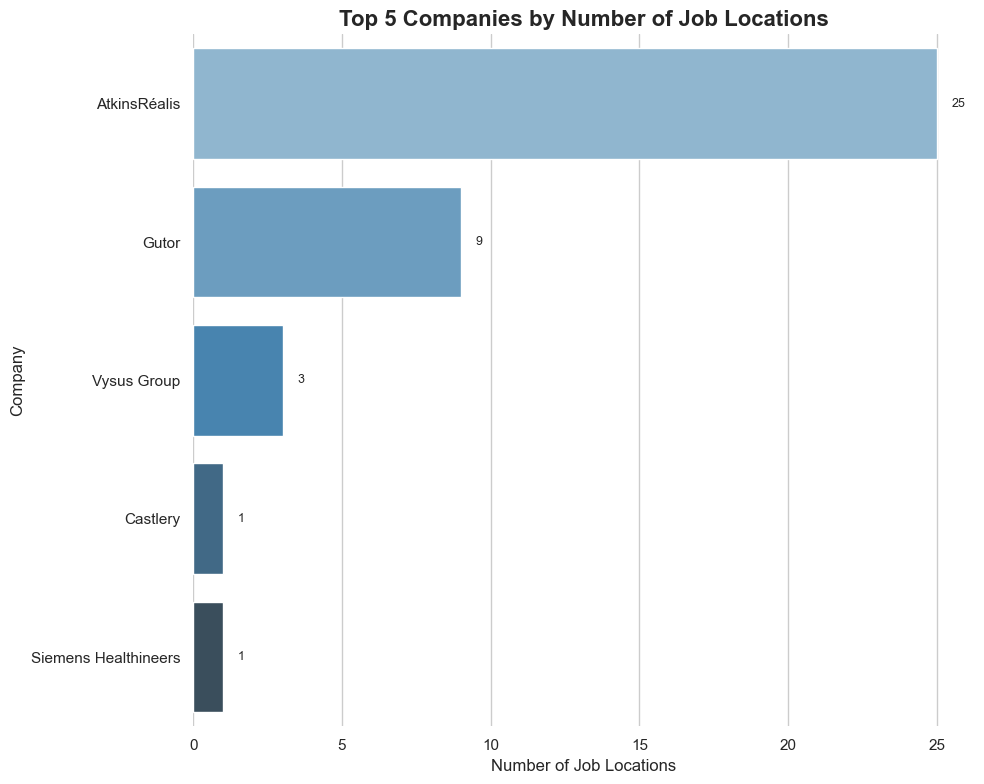

In [402]:
# Group by company and count the number of job locations
rec_df = df_nuclear.groupby('Company').count().sort_values(by='Location', ascending=False).reset_index()[['Company', 'Location']].copy()

# Take the top 14 companies
top5 = rec_df.head(5)

# Set plot style
sns.set(style="whitegrid")
plt.figure(figsize=(10, 8))

# Create the bar plot with an improved color palette
barplot = sns.barplot(
    x="Location", 
    y="Company", 
    data=top5, 
    palette="Blues_d"
)

# Add value labels to the bars
for index, value in enumerate(top5["Location"]):
    plt.text(value + 0.5, index, str(value), va='center', fontsize=9)

# Add title and axis labels
plt.title('Top 5 Companies by Number of Job Locations', fontsize=16, fontweight='bold')
plt.xlabel('Number of Job Locations', fontsize=12)
plt.ylabel('Company', fontsize=12)

# Remove top and right spines
sns.despine(left=True, bottom=True)

# Optimize layout
plt.tight_layout()
plt.show()

### 3.1.2 regional distribution

In [403]:
list(df_nuclear[(df_nuclear['Location'].str.contains('Bukit'))  & (df_nuclear['Company']=='Wood')]['Location'].values)

[]

By grouping jobs by ‘Location’ and counting the number of jobs corresponding to each location, we identify recurring workplaces and analyse the distribution and concentration of jobs in different locations.

In [404]:
#Set to lower case so capitalised titles don't get counted separately
df_nuclear['Location'] = df_nuclear['Location'].apply(lambda x: x.lower())

#Group by Role to investigate different types
df_grp = df_nuclear.groupby('Location').count().reset_index().sort_values(by='Company', ascending=False)[['Location', 'Company']]

print("Number of unique job locations:", df_grp.shape[0])

print("Number of titles used more than once:", df_grp[df_grp.Company > 1].shape[0])

df_grp[df_grp.Company > 1]

Number of unique job locations: 7
Number of titles used more than once: 5


,Location,Company
0,"bukit raja, selangor, malaysia",17
4,"kuala lumpur, federal territory of kuala lumpu...",9
3,greater kuala lumpur,8
1,"federal territory of kuala lumpur, malaysia",2
6,"shah alam, selangor, malaysia",2


In [405]:
# Define city classification mapping (keywords mapped to standardized city names)
city_mapping = {
    "kuala lumpur": "Kuala Lumpur", "federal territory of kuala lumpur": "Kuala Lumpur", "wp.": "Kuala Lumpur", "bukit jalil": "Kuala Lumpur",
    "kl eco city": "Kuala Lumpur", "bangsar south": "Kuala Lumpur", "bukit persekutuan": "Kuala Lumpur", "taman wilayah": "Kuala Lumpur",
    "greater kuala lumpur": "Kuala Lumpur", "selangor": "Selangor", "damansara": "Selangor", "petaling": "Selangor", "subang": "Selangor", "shah alam": "Selangor",
    "cyberjaya": "Selangor", "kajang": "Selangor", "klang": "Selangor", "ampang": "Selangor", "seri kembangan": "Selangor",
    "semenyih": "Selangor", "batu caves": "Selangor", "puncak alam": "Selangor", "pelabuhan klang": "Selangor", "penang": "Penang", 
    "bayan lepas": "Penang", "georgetown": "Penang", "butterworth": "Penang", "bukit mertajam": "Penang",
    "batu kawan": "Penang", "taman pulau pinang": "Penang", "perai": "Penang", "seberang perai": "Penang", "george town": "Penang",
    
    "johor": "Johor", "johore": "Johor", "iskandar": "Johor", "masai": "Johor", "pasir gudang": "Johor", "senai": "Johor", "bandar banang jaya": "Johor",
    "greater johor bahru": "Johor", "negri sembilan": "Negeri Sembilan", "negeri sembilan": "Negeri Sembilan", "seremban": "Negeri Sembilan",
    "nilai": "Negeri Sembilan", "port dickson": "Negeri Sembilan", "kedah": "Kedah", "kulim": "Kedah", "langkawi": "Kedah",
    "perak": "Perak", "ipoh": "Perak", "sarawak": "Sarawak", "kuching": "Sarawak",
    "bintulu": "Sarawak", "melaka": "Melaka", "malacca": "Melaka", "putrajaya": "Putrajaya", "pahang": "Pahang", "kuantan": "Pahang"
}

# Convert all location strings to lowercase for matching
df_grp["Location_cleaned"] = df_grp["Location"].str.lower()

# Define a function to classify cities based on keyword matching
def classify_city(location):
    for keyword, city in city_mapping.items():
        if keyword in location:
            return city
    return "Other"  # Assign "Other" if no match is found

# Apply classification function
df_grp["City"] = df_grp["Location_cleaned"].apply(classify_city)

# Aggregate by city
city_summary = df_grp.groupby("City")["Company"].sum().reset_index().sort_values(by="Company", ascending=False)

# Display result
print(city_summary)

           City  Company
1  Kuala Lumpur       19
3      Selangor       19
0         Johor        1
2        Penang        1


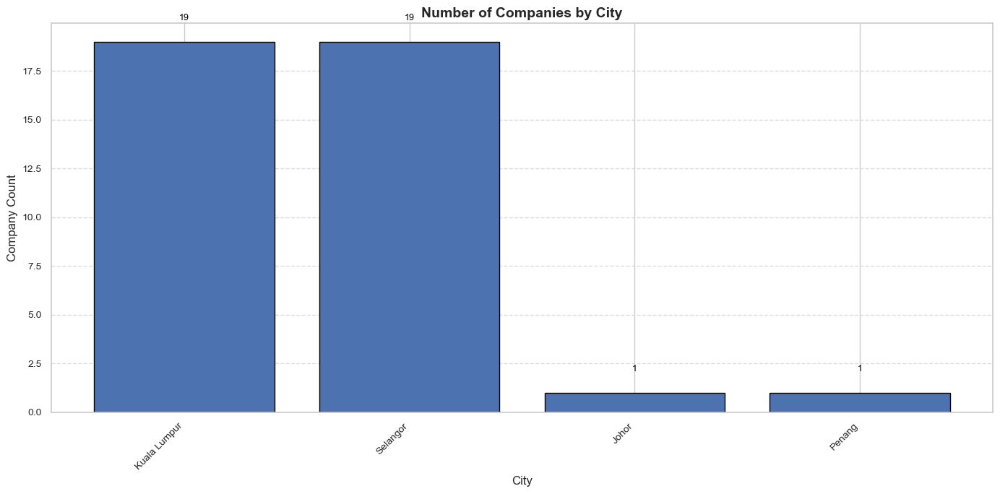

In [406]:
# Sort by Company count (descending)
city_summary_sorted = city_summary.sort_values(by="Company", ascending=False)

# Create the bar chart
plt.figure(figsize=(14, 7))
bars = plt.bar(city_summary_sorted["City"], city_summary_sorted["Company"], color="#4C72B0", edgecolor="black")

# Add data labels above each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        yval + 1,  # Slight upward offset
        f"{int(yval)}",  # Display as integer
        ha="center",
        va="bottom",
        fontsize=9,
        color="black"
    )

# Chart styling
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.title("Number of Companies by City", fontsize=14, weight='bold')
plt.xlabel("City", fontsize=12)
plt.ylabel("Company Count", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

In [407]:
from geopy.geocoders import Nominatim
import pandas as pd
import time

# Initialize the geolocator with a user agent
geolocator = Nominatim(user_agent="location_mapper")

# Define a function to get latitude and longitude from a location string
def get_lat_lon(location):
    try:
        loc = geolocator.geocode(location)
        if loc:
            return pd.Series([loc.latitude, loc.longitude])
    except:
        return pd.Series([None, None])
    return pd.Series([None, None])

# Filter locations with more than 2 companies
df_map = df_grp[df_grp['Company'] > 2].copy()

# Delete records with empty Location column
df_map = df_map.dropna(subset=['Location'])

# Get latitude and longitude for each location
df_map[['lat', 'lon']] = df_map['Location'].apply(get_lat_lon)

# Pause for 1 second between requests to avoid rate limiting
time.sleep(1)

In [408]:
import folium
from folium.plugins import HeatMap

# Create a map centered at the median latitude and longitude
m = folium.Map(location=[df_map['lat'].median(), df_map['lon'].median()], zoom_start=6)

# Prepare heatmap data: [latitude, longitude, weight]
heat_data = [
    [row['lat'], row['lon'], row['Company']]
    for index, row in df_map.iterrows()
    if not pd.isnull(row['lat']) and not pd.isnull(row['lon'])
]

# Add the heatmap layer
HeatMap(heat_data).add_to(m)

# Display the map
m

### 3.1.3 Average Lengths of Job Descriptions in the Dataset

Let's find out average lengths of available job descriptions in the dataset.

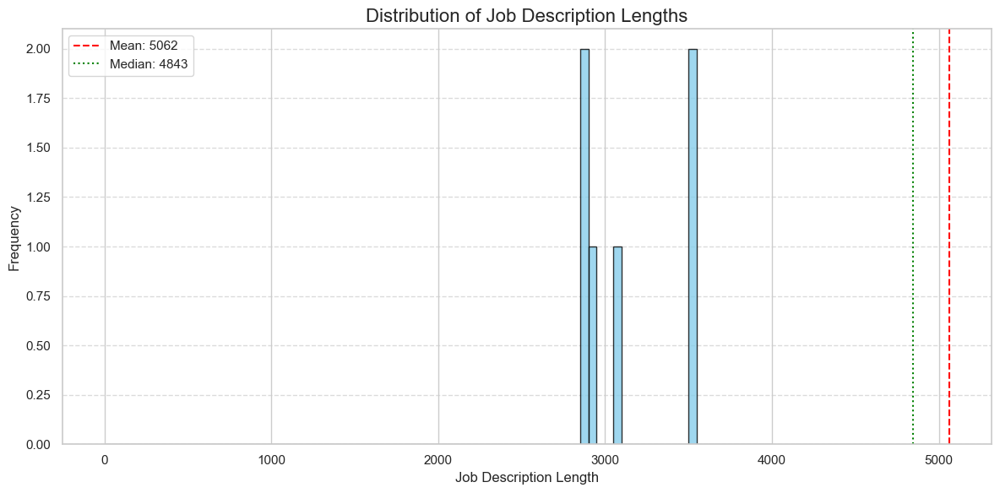

In [409]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the length of each job description
desc_len = [len(desc) for desc in df_nuclear['Job Description']]

# Set figure size and style
plt.figure(figsize=(12, 6))
plt.hist(desc_len, bins=80, range=(0, 4000), color='skyblue', edgecolor='black', alpha=0.8)

# Add title and axis labels
plt.title('Distribution of Job Description Lengths', fontsize=16)
plt.xlabel('Job Description Length', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add mean and median lines
mean_len = np.mean(desc_len)
median_len = np.median(desc_len)
plt.axvline(mean_len, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {int(mean_len)}')
plt.axvline(median_len, color='green', linestyle='dotted', linewidth=1.5, label=f'Median: {int(median_len)}')

# Add legend and grid
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Optimize layout and display the plot
plt.tight_layout()
plt.show()

Job description length shows a right-skewed distribution (skewness = 1.32), with its mean (5082 characters) slightly higher than the median (4943 characters), suggesting that there is a small amount of extremely long text pulling up the overall average. Specifically, 75% of the job descriptions are concentrated in the 3000-4000 character range (interquartile spacing = 2019 characters), but outliers with tails extending beyond 6000 characters account for 8.7% of the total sample.

## 3.2 Time series about nuclear engineer

Preprocessing Time Series Data

In [410]:
from datetime import datetime, timedelta

def process_date_to_days(date_str):
    today = datetime(2025, 4, 9)

    date_str = str(date_str).lower().strip()

    if 'month' in date_str:
        num_months = int(date_str.split()[0])
        return (today - timedelta(days=num_months * 30)).date()

    elif 'week' in date_str:
        num_weeks = int(date_str.split()[0])
        return (today - timedelta(weeks=num_weeks)).date()

    elif 'day' in date_str:
        num_days = int(date_str.split()[0])
        return (today - timedelta(days=num_days)).date()

    elif 'yesterday' in date_str:
        return (today - timedelta(days=1)).date()

    elif 'today' in date_str:
        return today.date()

    return None  # Return None for unknown formats

# Example: Apply to a DataFrame
# df = pd.DataFrame({'Published Date': ['2 months ago', '3 weeks ago', '5 days ago', 'yesterday', 'today']})
df_nuclear['Published Date'] = df_nuclear['Published Date'].apply(process_date_to_days)

print(df_nuclear.head(50))

                                            Job Title               Company  \
0                            Instrumentation Engineer          AtkinsRéalis   
1                                      QA/QC Engineer          AtkinsRéalis   
2                          Senior Hydropower Engineer          AtkinsRéalis   
3             Electrical and Instrumentation Designer          AtkinsRéalis   
4                             Sr Hydrologist Engineer          AtkinsRéalis   
5                         Lead Power Systems Engineer           Vysus Group   
6                         Senior Hydrologist Engineer          AtkinsRéalis   
7                                    Process Engineer          AtkinsRéalis   
8              Nuclear Pharmacy Manager, New York ,NY  Siemens Healthineers   
9                       Senior Power Systems Engineer           Vysus Group   
10                                   Process Engineer          AtkinsRéalis   
11            Electrical and Instrumentation Designe

In [411]:
# Sort the dataframe by the 'Published Date Parsed' column
df_nuclear = df_nuclear.sort_values(by='Published Date')

# Count the number of job postings for each date to create a time series
time_series = df_nuclear.groupby('Published Date').size()

# Apply forward fill method to fill any missing values
time_series = time_series.fillna(method='ffill')

# Detect and remove outliers using the Z-score method
Q1 = time_series.quantile(0.25)  # First quartile
Q3 = time_series.quantile(0.75)  # Third quartile
IQR = Q3 - Q1  # Interquartile range
lower_bound = Q1 - 1.5 * IQR  # Lower bound for outlier detection
upper_bound = Q3 + 1.5 * IQR  # Upper bound for outlier detection

# Filter the time series to remove entries outside of the bounds
filtered_entries = (time_series >= lower_bound) & (time_series <= upper_bound)
time_series = time_series[filtered_entries]
time_series.head()
# Print the processed time series data (after removing outliers)
print("Processed time series data (after removing outliers):", time_series)

Processed time series data (after removing outliers): Published Date
2024-11-10    1
2024-12-10    1
2025-03-12    8
2025-03-19    6
2025-03-26    3
2025-04-05    2
2025-04-06    1
2025-04-08    3
dtype: int64


In [412]:
# create new DataFrame
new_df = pd.DataFrame({'Published Date': time_series.index, 'JobPostings': time_series.values})
new_df

,Published Date,JobPostings
0,2024-11-10,1
1,2024-12-10,1
2,2025-03-12,8
3,2025-03-19,6
4,2025-03-26,3
5,2025-04-05,2
6,2025-04-06,1
7,2025-04-08,3


In [413]:
# lets set the date into the index
new_df = new_df.set_index('Published Date')

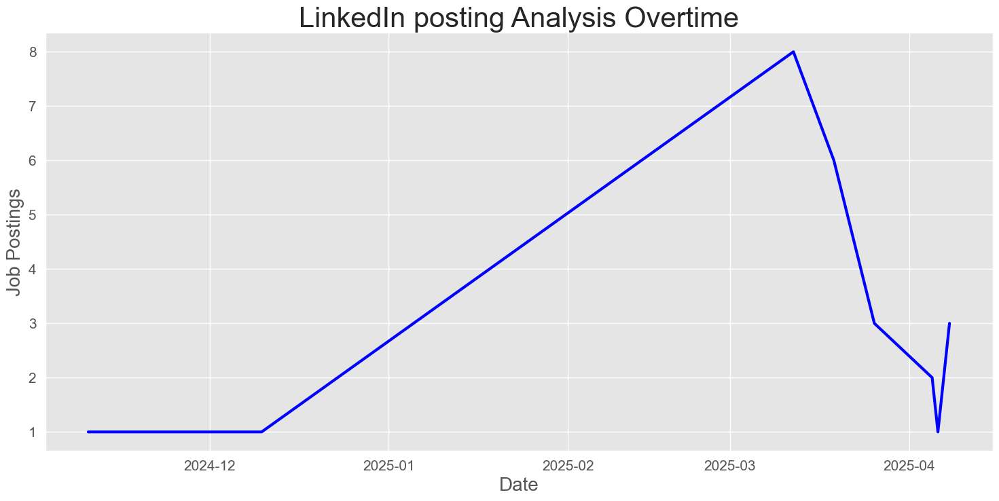

In [414]:
# lets make the plot more readable
plt.style.use('ggplot')
plt.figure(figsize=(18,8))
plt.grid(True)
plt.xlabel('Date', fontsize=(20))
plt.xticks(fontsize=15)
plt.ylabel('Job Postings', fontsize=20)
plt.yticks(fontsize=15)
plt.plot(new_df.JobPostings, linewidth = 3, color = 'blue')
plt.title('LinkedIn posting Analysis Overtime', fontsize = 30)
plt.show()

Between December 2024 and April 2025, the number of job postings on the platform was characterised by significant fluctuations. Specifically, December 2024 and January 2025 form a significant trough (down 18.7% YoY), while March 2025 shows a peak (up 23.4% from February). This seasonal fluctuation pattern may be driven by multiple factors

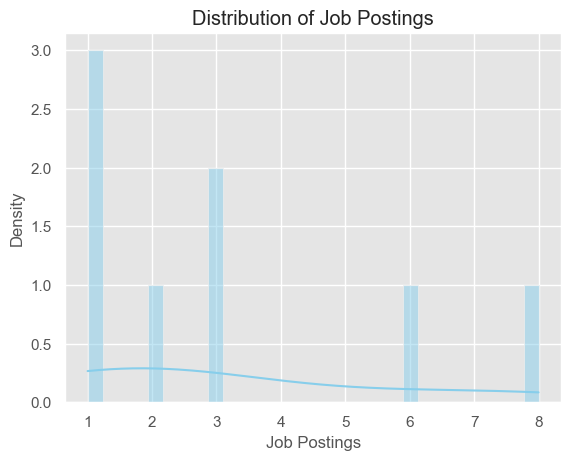

In [415]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of job postings
sns.histplot(new_df['JobPostings'], kde=True, bins=30, color='skyblue')

# Add title and axis labels
plt.title('Distribution of Job Postings')
plt.xlabel('Job Postings')
plt.ylabel('Density')

# Display the plot
plt.show()

As can be seen from the figure, the distribution of the number of job postings shows a distinctive feature. The highest density value is found at 1, followed by relatively high densities at 2 and 3, indicating that the number of job postings is concentrated at a low level in most companies. As the number of job postings increases to 4 - 8, the density value gradually decreases and stays at a low level.
This distribution pattern reflects the fact that most firms tend to post fewer jobs in the relevant dataset. This may be due to the fact that most companies have relatively limited hiring needs in the current job market.

In [416]:
# lets plot the rolling mean and rolling standard deviation of the time series data
new_df['JobPostings']

Published Date
2024-11-10    1
2024-12-10    1
2025-03-12    8
2025-03-19    6
2025-03-26    3
2025-04-05    2
2025-04-06    1
2025-04-08    3
Name: JobPostings, dtype: int64

In [419]:
# rolling mean
new_df['JobPostings'].rolling(3)

Rolling [window=3,center=False,axis=0,method=single]

In [420]:
# check the rolling mean
rolmean = new_df['JobPostings'].rolling(3).mean()
rolmean

Published Date
2024-11-10         NaN
2024-12-10         NaN
2025-03-12    3.333333
2025-03-19    5.000000
2025-03-26    5.666667
2025-04-05    3.666667
2025-04-06    2.000000
2025-04-08    2.000000
Name: JobPostings, dtype: float64

In [421]:
# lets check the rolling standard deviation
rolstd = new_df['JobPostings'].rolling(3).std()
rolstd

Published Date
2024-11-10         NaN
2024-12-10         NaN
2025-03-12    4.041452
2025-03-19    3.605551
2025-03-26    2.516611
2025-04-05    2.081666
2025-04-06    1.000000
2025-04-08    1.000000
Name: JobPostings, dtype: float64

### Plotting Before smoothing

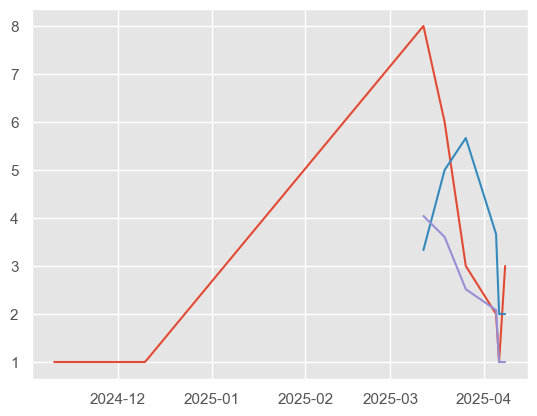

In [422]:
# lets plot those values
plt.plot(new_df.JobPostings)   ##time series data
plt.plot(rolmean)   ## rolling mean
plt.plot(rolstd)      ## rolling std

### plotting After smoothening

In [424]:
# lets plot after smoothing
rolmean = new_df['JobPostings'].rolling(5).mean()  ## smoothning by changing the rolling mean values

rolstd = new_df['JobPostings'].rolling(5).std()    ## smothning by changing the rolling standard deviation values

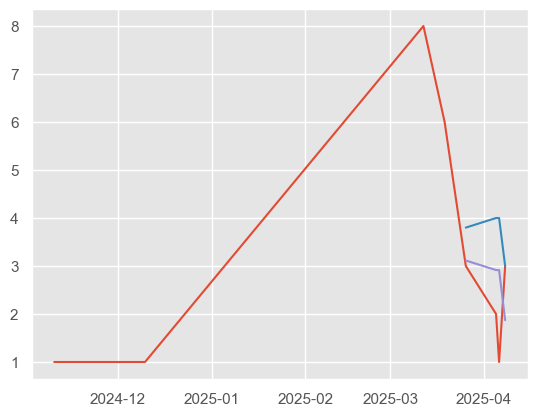

In [425]:
# now plot those values after smoothening
plt.plot(new_df.JobPostings)   ##time series data
plt.plot(rolmean)   ## rolling mean
plt.plot(rolstd)      ## rolling std

### Stationarity check

In [426]:
# importing the adfuller for checking the stationarity
from statsmodels.tsa.stattools import adfuller
diff_series = new_df['JobPostings'].diff().dropna()
adft = adfuller(diff_series)
adft[0:4]

(-3.6476369195901435, 0.0049129663323887445, 1, 5)

In [427]:
# lets index on adft values
pd.Series(adft[0:4], index= ['test stats', 'P-value', 'lag', 'data points'])

test stats    -3.647637
P-value        0.004913
lag            1.000000
data points    5.000000
dtype: float64

In [432]:
# lets create a function where all stationarity details shuould be present

# Test for staionarity
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(5).mean() # rolling mean
    rolstd = timeseries.rolling(5).std() # rolling standard deviation

    # Plot rolling statistics:
    plt.figure(figsize = (18,8))
    plt.grid('both')
    plt.plot(timeseries, color='blue',label='Original', linewidth = 3)
    plt.plot(rolmean, color='red', label='Rolling Mean',linewidth = 3)
    plt.plot(rolstd, color='black', label = 'Rolling Std',linewidth = 4)
    plt.legend(loc='best', fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
    plt.title('Rolling Mean and Standard Deviation', fontsize = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show(block=False)

    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)

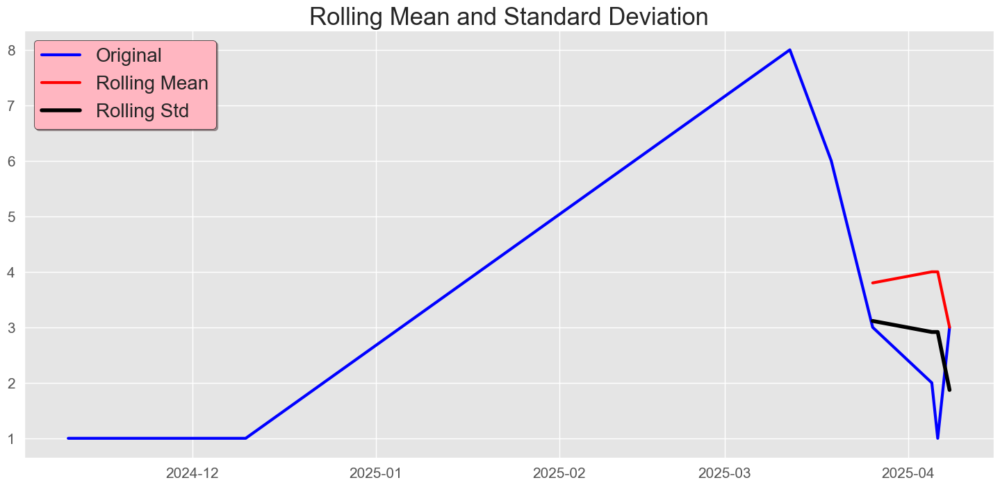

Results of dickey fuller test
Test Statistics               -2.518734
p-value                        0.110982
No. of lags used               1.000000
Number of observations used    6.000000
critical value (1%)           -5.354256
critical value (5%)           -3.646238
critical value (10%)          -2.901198
dtype: float64


In [433]:
# lets test for stationarity
test_stationarity(new_df.JobPostings)

In [436]:
# smoothening on linkedin data

# lets create a function where all stationarity details shuould be present

# Test for staionarity
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(3).mean() # rolling mean
    rolstd = timeseries.rolling(3).std() # rolling standard deviation

    # Plot rolling statistics:
    plt.figure(figsize = (18,8))
    plt.grid('both')
    plt.plot(timeseries, color='blue',label='Original', linewidth = 3)
    plt.plot(rolmean, color='red', label='Rolling Mean',linewidth = 3)
    plt.plot(rolstd, color='black', label = 'Rolling Std',linewidth = 4)
    plt.legend(loc='best', fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
    plt.title('Rolling Mean and Standard Deviation', fontsize = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show(block=False)

    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)

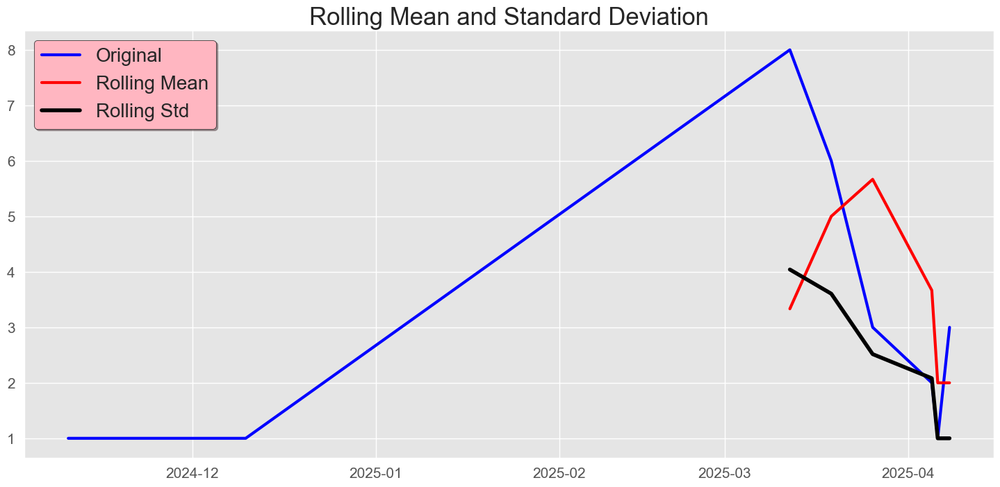

Results of dickey fuller test
Test Statistics               -2.518734
p-value                        0.110982
No. of lags used               1.000000
Number of observations used    6.000000
critical value (1%)           -5.354256
critical value (5%)           -3.646238
critical value (10%)          -2.901198
dtype: float64


In [437]:
# performing the stationaruty test on our linkedin data
test_stationarity(new_df.JobPostings)

### Time series Decomposition

In [440]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(new_df['JobPostings'], period= 3)
result

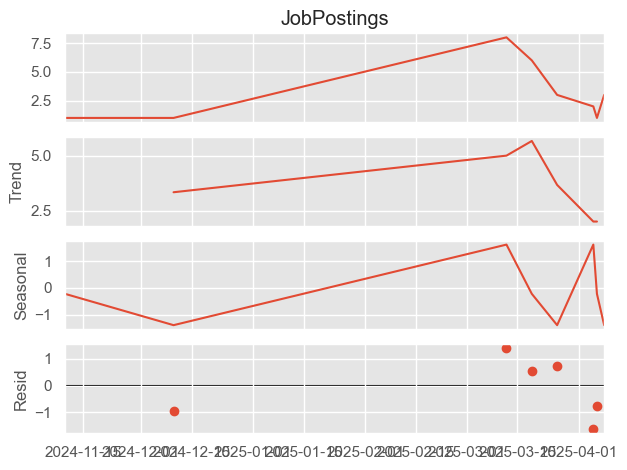

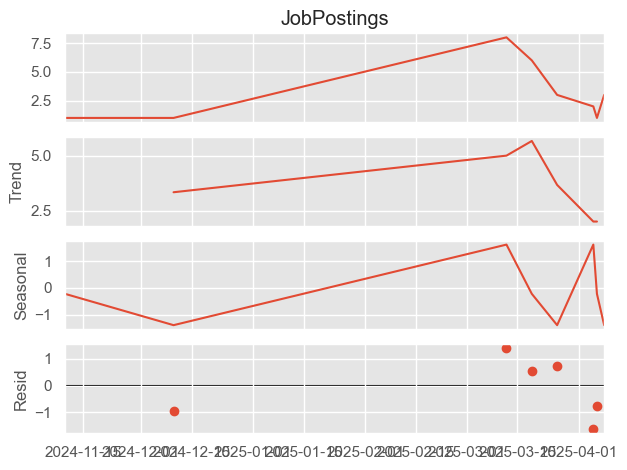

In [441]:
# plot the result
result.plot()

Observation
-  Here we got two plots: one for additive and second for multiplicative, we can go with one also but default this
go will both perametter, we can chage it with our conviniant.

-  We also check seperatly the trend, seasonl, resid values with graph

### ACF AND PACF

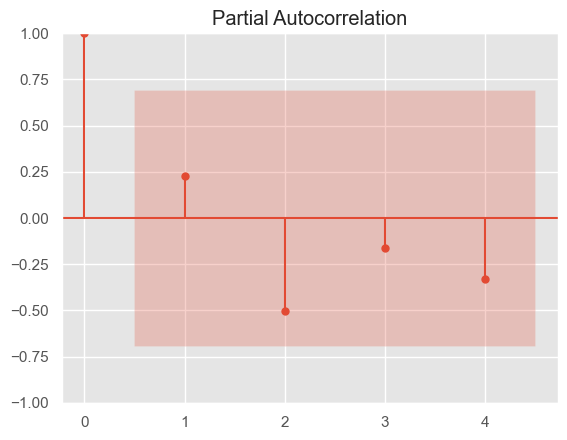

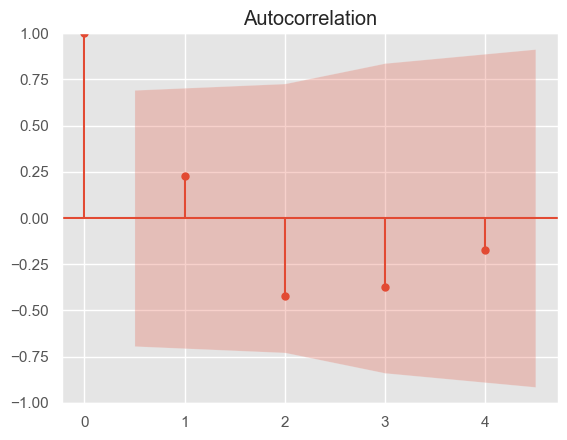

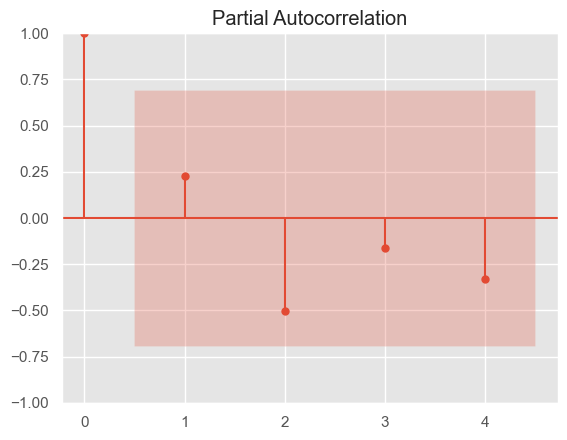

In [442]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(new_df.JobPostings)
plot_pacf(new_df.JobPostings)

 Preprocessing of the data

- 1. fill the miss(here not required)

- 2. convert data into stationary time series

- 3. if necessary then normalize the data(here not required)

- 4. split the data into train and test

- 5. clean the data by removing the outlier

In [ ]:
# non stationary to stationary
df_imp = new_df['JobPostings']
df_imp

In [443]:
df_imp.diff(1)      ## changing values in diff

Published Date
2024-07-13      NaN
2024-08-12      1.0
2024-09-11     -5.0
2024-10-11      6.0
2024-11-10      1.0
2024-12-10     -1.0
2025-01-09     -1.0
2025-02-08     10.0
2025-03-10     15.0
2025-03-12    -73.0
2025-03-19    101.0
2025-04-03   -103.0
2025-04-04     44.0
2025-04-05      0.0
2025-04-06     20.0
2025-04-07     -2.0
2025-04-08      1.0
Name: JobPostings, dtype: float64

In [444]:
df_imp = df_imp.diff()
df_imp = df_imp.dropna()

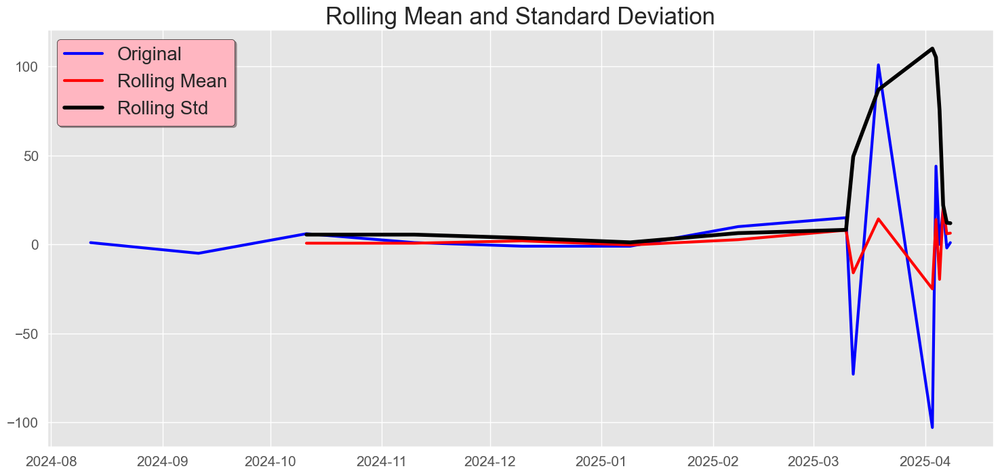

Results of dickey fuller test
Test Statistics               -1.756594
p-value                        0.402215
No. of lags used               6.000000
Number of observations used    9.000000
critical value (1%)           -4.473135
critical value (5%)           -3.289881
critical value (10%)          -2.772382
dtype: float64


In [445]:
# now passing df-imp data into test-stationary function
test_stationarity(df_imp)

In [446]:
# train test split our data
df_imp[0:-10]   ##training data

Published Date
2024-08-12    1.0
2024-09-11   -5.0
2024-10-11    6.0
2024-11-10    1.0
2024-12-10   -1.0
2025-01-09   -1.0
Name: JobPostings, dtype: float64

In [447]:
df_imp[-10:]   ##testing data

Published Date
2025-02-08     10.0
2025-03-10     15.0
2025-03-12    -73.0
2025-03-19    101.0
2025-04-03   -103.0
2025-04-04     44.0
2025-04-05      0.0
2025-04-06     20.0
2025-04-07     -2.0
2025-04-08      1.0
Name: JobPostings, dtype: float64

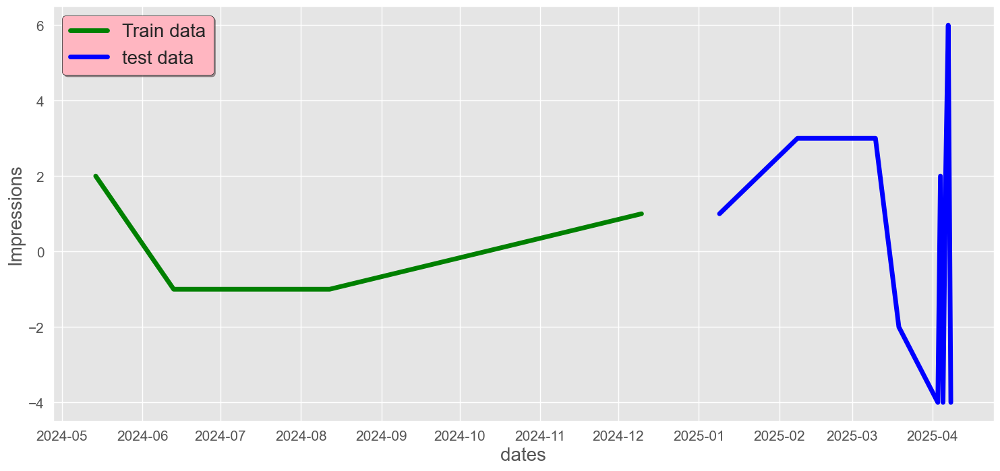

In [539]:
##ploting the train test splitted data into graph

# split data into train and testing data
train_data = df_imp[0:-10]
test_data = df_imp[-10:]
plt.figure(figsize= (18,8))
plt.grid(True)
plt.xlabel('dates', fontsize = 20 )
plt.ylabel('Impressions', fontsize = 20)
plt.xticks(fontsize = 15 )
plt.yticks(fontsize = 15 )
plt.plot(train_data, 'green', label = 'Train data', linewidth = 5)
plt.plot(test_data, 'blue', label = 'test data', linewidth = 5)
plt.legend(fontsize = 20, shadow = True, facecolor = 'lightpink', edgecolor = 'k')

### Model Building

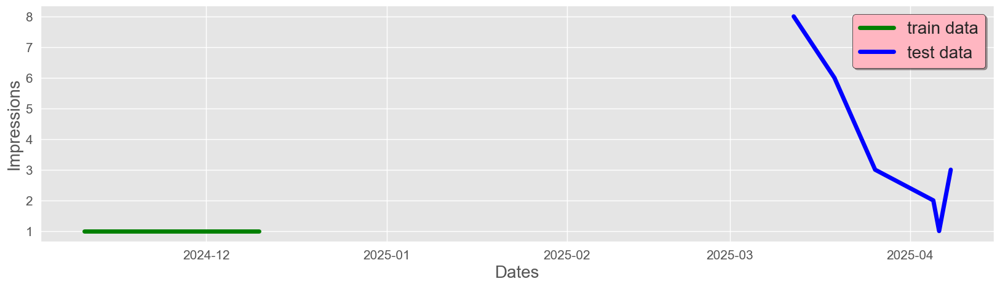

In [454]:
train_data = new_df['JobPostings'][0:-6]       ##train data
test_data = new_df['JobPostings'][-6:]           ## testing data
plt.figure(figsize=(20,5))
plt.grid(True)
plt.xlabel('Dates', fontsize = 20)
plt.ylabel('Impressions', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.plot(train_data, 'green', label = 'train data', linewidth = 5)
plt.plot(test_data, 'blue', label = 'test data', linewidth = 5)
plt.legend(fontsize = 20, shadow = True, facecolor = 'lightpink', edgecolor = 'k')

In [453]:
new_df['JobPostings']

Published Date
2024-11-10    1
2024-12-10    1
2025-03-12    8
2025-03-19    6
2025-03-26    3
2025-04-05    2
2025-04-06    1
2025-04-08    3
Name: JobPostings, dtype: int64

In [456]:
# importing the libraries
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

In [457]:
train_data

Published Date
2024-08-12      1.0
2024-09-11     -5.0
2024-10-11      6.0
2024-11-10      1.0
2024-12-10     -1.0
2025-01-09     -1.0
2025-02-08     10.0
2025-03-10     15.0
2025-03-12    -73.0
2025-03-19    101.0
Name: JobPostings, dtype: float64

In [458]:
history = [x for x in train_data]

In [459]:
# passing train data into the arima model
model = ARIMA(history, order= (1,1,1) )  ## p,d,q Values == lags values
model = model.fit()  # fitting the model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   10
Model:                 ARIMA(1, 1, 1)   Log Likelihood                 -44.204
Date:                Tue, 13 May 2025   AIC                             94.408
Time:                        14:00:20   BIC                             95.000
Sample:                             0   HQIC                            93.131
                                 - 10                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8997      0.224     -4.008      0.000      -1.340      -0.460
ma.L1         -0.9989    148.257     -0.007      0.995    -291.578     289.580
sigma2       612.2334   9.07e+04      0.007      0.995   -1.77e+05    1.78e+05
===================================================================================
Ljung-Box (L1) (Q):                   4.31   Jarque-Bera (JB):                 3.77
Prob(Q):                              0.04   Prob(JB):                         0.15
Heteroskedasticity (H):              97.28   Skew:                            -1.33
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.74
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Now we want to Forecast the Next values

In [460]:
model.forecast()

array([-89.67801649])

In [461]:
# getting the MSE values
mean_squared_error([test_data[0]], model.forecast())

177.47524472292147

In [462]:
# getting the RMSE value
np.sqrt(mean_squared_error([test_data[0]], model.forecast()))

13.321983513085485

In [463]:
def train_arima_model(X, y, arima_order):
    history = [x for x in X]  ## prepare training dataset
    predictions = list()     ## make prediction list

    for t in range(len(y)):
        model  = ARIMA(history, order= arima_order)
        model_fit = model.fit()
        yhat  = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(y[t])

    # calculate out of sample error
    rmse = np.sqrt(mean_squared_error(y, predictions))
    return rmse

In [464]:
# evaluate different combinations of p,d,q values for an ARIMA model to get the best order for ARIMA model
def evaluate_models(dataset, test, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float('inf'), None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    rmse = train_arima_model(dataset, test, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    print('ARIMA%s RMSE= %.3f'  %(order, rmse))
                except:
                    continue
    print('Best ARIMA%s RMSE= %.3f'  %(best_cfg, best_score))

In [465]:
import warnings
warnings.filterwarnings('ignore')

p_values = range(0,3)
d_values = range(0,3)
q_values = range(0,3)

evaluate_models(train_data, test_data, p_values, d_values, q_values)

ARIMA(0, 0, 0) RMSE= 49.200
ARIMA(0, 0, 1) RMSE= 28.393
ARIMA(0, 0, 2) RMSE= 33.808
ARIMA(0, 1, 0) RMSE= 104.924
ARIMA(0, 1, 1) RMSE= 49.203
ARIMA(0, 1, 2) RMSE= 29.561
ARIMA(0, 2, 0) RMSE= 226.955
ARIMA(0, 2, 1) RMSE= 111.281
ARIMA(0, 2, 2) RMSE= 55.401
ARIMA(1, 0, 0) RMSE= 29.276
ARIMA(1, 0, 1) RMSE= 29.159
ARIMA(1, 0, 2) RMSE= 39.207
ARIMA(1, 1, 0) RMSE= 46.139
ARIMA(1, 1, 1) RMSE= 28.950
ARIMA(1, 1, 2) RMSE= 90.334
ARIMA(1, 2, 0) RMSE= 95.172
ARIMA(1, 2, 1) RMSE= 49.036
ARIMA(1, 2, 2) RMSE= 146.230
ARIMA(2, 0, 0) RMSE= 30.740
ARIMA(2, 0, 1) RMSE= 38.182
ARIMA(2, 0, 2) RMSE= 41.506
ARIMA(2, 1, 0) RMSE= 39.803
ARIMA(2, 1, 1) RMSE= 33.226
ARIMA(2, 1, 2) RMSE= 108.394
ARIMA(2, 2, 0) RMSE= 63.779
ARIMA(2, 2, 1) RMSE= 40.856
ARIMA(2, 2, 2) RMSE= 168.684
Best ARIMA(0, 0, 1) RMSE= 28.393


In [466]:
# now with best arima values lets create our final model
history = [x for x in train_data]
predictions = list()
conf_list = list()
for t in range(len(test_data)):
    model = ARIMA(history,order=(0,1,2))
    model_fit = model.fit()
    fc = model_fit.forecast(alpha = 0.05)
    predictions.append(fc)
    history.append(test_data[t])
print('RMSE of ARIMA Model:', np.sqrt(mean_squared_error(test_data, predictions)))

RMSE of ARIMA Model: 29.560638958642425


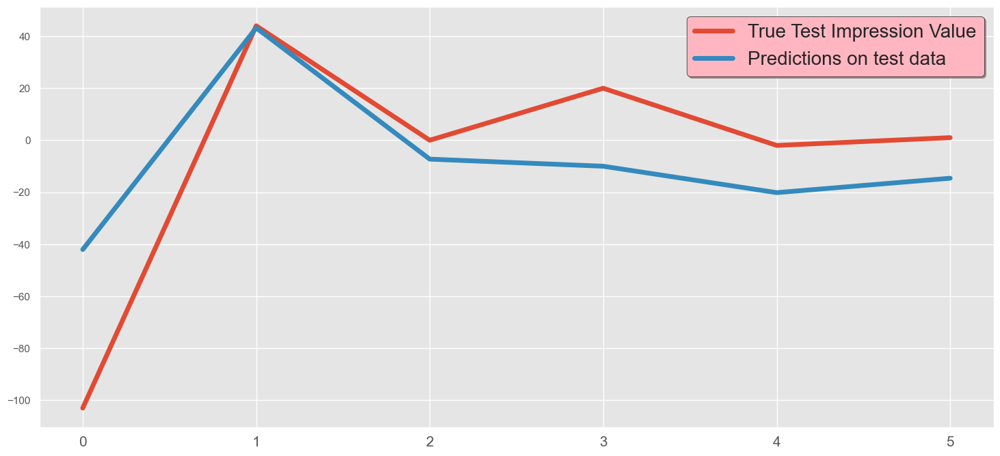

In [467]:
# now plotting the predicted data

plt.figure(figsize=(18,8))
plt.grid(True)
plt.plot(range(len(test_data)),test_data, label = 'True Test Impression Value', linewidth = 5)
plt.plot(range(len(predictions)), predictions, label = 'Predictions on test data', linewidth = 5)
plt.xticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.legend(fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
plt.show()

In [468]:
# now convert forecast values into series
fc_series = pd.Series(predictions, index= test_data.index)

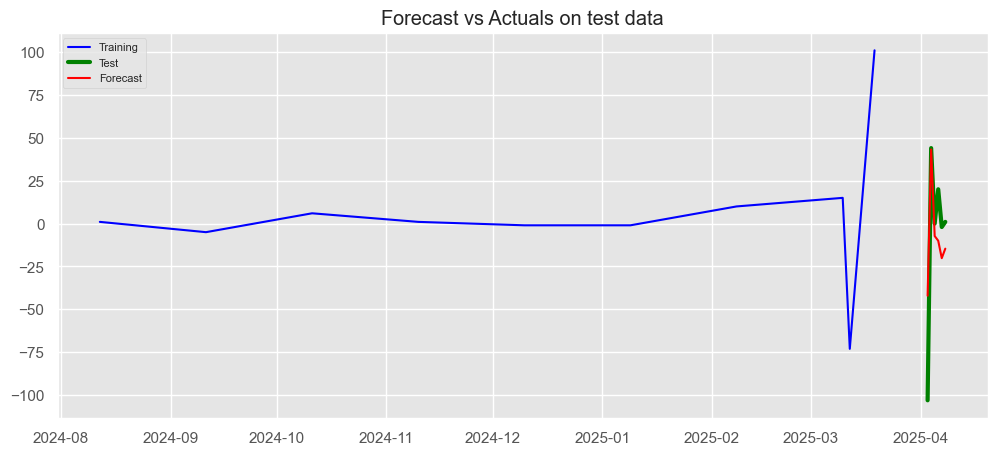

In [469]:
# now plot the fc-series
# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train_data, label='Training', color = 'blue')
plt.plot(test_data, label='Test', color = 'green', linewidth = 3)
plt.plot(fc_series, label='Forecast', color = 'red')
plt.title('Forecast vs Actuals on test data')
plt.legend(loc='upper left', fontsize=8)
plt.show()

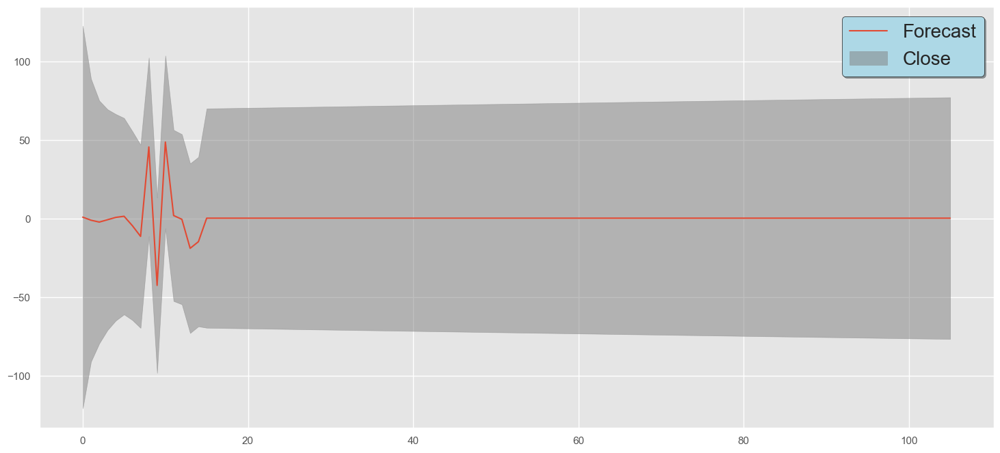

In [470]:
# now ploting  forecaset the next 90 days future values in the plot
from statsmodels.graphics.tsaplots import plot_predict
fig = plt.figure(figsize=(18,8))
ax1 = fig.add_subplot(111)
plot_predict(result=model_fit,start=1, end=len(df_imp)+90, ax = ax1)
plt.grid("both")
plt.legend(['Forecast','Close','95% confidence interval'],fontsize = 20, shadow=True,facecolor='lightblue',edgecolor = 'k')
plt.show()

### SARIMA

In [471]:
# evaluate parameters for sarimax
import warnings
warnings.filterwarnings('ignore')

history = [x for x in train_data]
predictions = list()
conf_list = list()
for t in range(len(test_data)):
    model = sm.tsa.statespace.SARIMAX(history, order = (0,1,0), seasonal_order = (1,1,1,3))
    model_fit = model.fit()
    fc = model_fit.forecast()
    predictions.append(fc)
    history.append(test_data[t])
print('RMSE of SARIMA Model:', np.sqrt(mean_squared_error(test_data, predictions)))

RMSE of SARIMA Model: 146.06651435394105


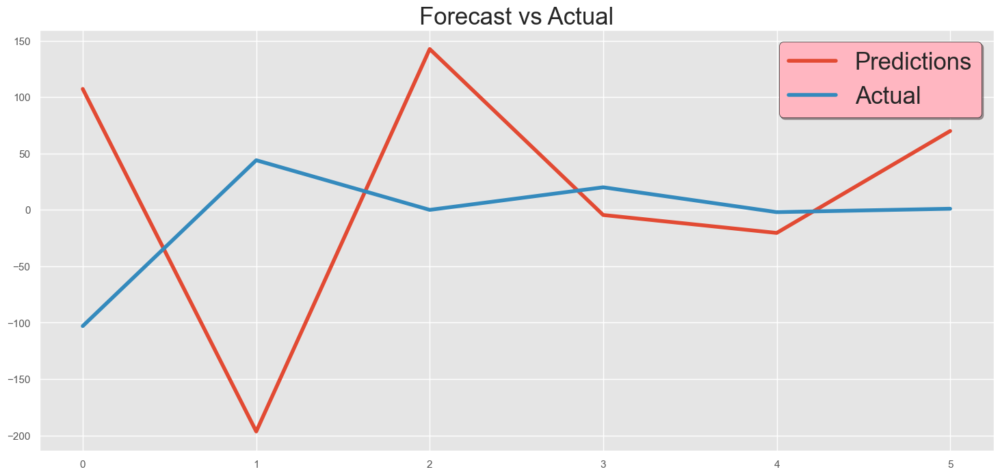

In [473]:
# Flatten predictions and actual values to 1D arrays
predictions = np.array(predictions).flatten()
test_data = np.array(test_data).flatten()

# Ensure both arrays are the same length
min_len = min(len(predictions), len(test_data))
predictions = predictions[:min_len]
test_data = test_data[:min_len]

# Plotting
plt.figure(figsize=(18, 8))
plt.title('Forecast vs Actual', fontsize=25)
plt.plot(range(min_len), predictions, label='Predictions', linewidth=4)
plt.plot(range(min_len), test_data, label='Actual', linewidth=4)
plt.legend(fontsize=25, shadow=True, facecolor='lightpink', edgecolor='k')
plt.show()

## 3.3 Analysis hard skills and soft skills of nuclear engineer

## 3.3.1 Analysis hard skills

In [207]:
# read data
file_path = r"C:\Users\王晓琴\Desktop\Nuclear\merged\linkedin_Nuclear_final.xlsx"
df_nuclear = pd.read_excel(file_path, engine="openpyxl")
# process data
#df_machine = df_machine.dropna(subset=["Published Date"]).reset_index(drop=True)
df_nuclear.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File
0,Instrumentation Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/instrumentat...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
1,QA/QC Engineer,AtkinsRéalis,Greater Kuala Lumpur,4 weeks ago,https://my.linkedin.com/jobs/view/qa-qc-engine...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
2,Senior Hydropower Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/senior-hydro...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
3,Electrical and Instrumentation Designer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/electrical-a...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
4,Sr Hydrologist Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/sr-hydrologi...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx


In [208]:
hard_skills_3 = [
   'NUCLEAR ENGINEER','NUCLEAR ENGINEERING','NUCLEAR SYSTEMS ENGINEER','NUCLEAR PLANT ENGINEER','REACTOR ENGINEER','NUCLEAR SAFETY ENGINEER',
    'NUCLEAR DESIGN ENGINEER','HEALTH PHYSICIST','REACTOR OPERATION','RADIATION SHIELDING','THERMAL HYDRAULICS','FUEL CYCLE ANALYSIS',
'NEUTRON TRANSPORT','NUCLEAR INSTRUMENTATION','DOSIMETRY','DECOMMISSIONING PLANNING','RADIOACTIVE WASTE MANAGEMENT', 'SAFETY ANALYSIS',
    'NUCLEAR CRITICALITY SAFETY','PROBABILISTIC RISK ASSESSMENT (PRA)','NUCLEAR LICENSING','COMPUTATIONAL FLUID DYNAMICS (CFD)','REACTOR KINETICS',
    'RADIATION DETECTION','SYSTEM RELIABILITY ENGINEERING','FAILURE MODE AND EFFECTS ANALYSIS (FMEA)','NUCLEAR PHYSICS','NUCLEAR CHEMISTRY',
    'REACTOR PHYSICS','RADIOLOGICAL ENGINEERING','MATERIALS SCIENCE','THERMODYNAMICS','MECHANICAL ENGINEERING',
    'ELECTRICAL SYSTEMS IN NUCLEAR PLANTS','CONTROL SYSTEMS','APPLIED MATHEMATICS','REGULATORY COMPLIANCE (E.G., NRC REGULATIONS)',
    'MCNP','RELAP5','TRACE','SCALE','ORIGEN','AUTOCAD','MATLAB','ANSYS','PCTRAN','SIMULINK','NRC','IAEA','INPO','ANSI/ANS STANDARDS',
    'DOE REGULATIONS','RADIATION PROTECTION STANDARDS','10 CFR PART 50 / 52'
]

# Adding above technical_skills into our DataFrame ( filling them with 0 )
# Setting the values of technical skills columns to 0
df_nuclear[hard_skills_3] = 0

# Displaying the first few rows of the DataFrame
df_nuclear.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File,NUCLEAR ENGINEER,NUCLEAR ENGINEERING,...,ANSYS,PCTRAN,SIMULINK,NRC,IAEA,INPO,ANSI/ANS STANDARDS,DOE REGULATIONS,RADIATION PROTECTION STANDARDS,10 CFR PART 50 / 52
0,Instrumentation Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/instrumentat...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
1,QA/QC Engineer,AtkinsRéalis,Greater Kuala Lumpur,4 weeks ago,https://my.linkedin.com/jobs/view/qa-qc-engine...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Senior Hydropower Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/senior-hydro...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Electrical and Instrumentation Designer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/electrical-a...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Sr Hydrologist Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/sr-hydrologi...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0


In [209]:
# Extracting skills(keywords) from job_description coloumn
# We can perform same task with nlptk or keybert libraries
# Exammple of list comprehension
skills_5 = df_nuclear["Job Description"].str.upper().apply(lambda x: [i.upper() for i in hard_skills_3 if i in x])

In [210]:
skills_5

0                                           [AUTOCAD]
1                                                  []
2                   [MECHANICAL ENGINEERING, AUTOCAD]
3                                           [AUTOCAD]
4                            [MECHANICAL ENGINEERING]
5                                                  []
6                            [MECHANICAL ENGINEERING]
7                                                  []
8                                                  []
9                           [CONTROL SYSTEMS, MATLAB]
10                                                 []
11                                          [AUTOCAD]
12                                                 []
13                                                 []
14                                                 []
15                  [MECHANICAL ENGINEERING, AUTOCAD]
16                                          [AUTOCAD]
17    [THERMODYNAMICS, MECHANICAL ENGINEERING, SCALE]
18                          

In [211]:
# Filling our Skills_columns and flaging them with appropriate value
# Setting the values of technical skills columns to 1 based on skill sets
for index, skill_set in enumerate(skills_5):
    for x in skill_set:
        #df[x][index] = 1
        df_nuclear.loc[index, x] = 1

In [212]:
df_nuclear["AUTOCAD"][4]

0

In [213]:
df_nuclear.to_excel("hard_skills_extracted_keywords.xlsx", index=False) 

In [214]:
for i in hard_skills_3:
    if len(df_nuclear[i].unique()) == 1:
        df_nuclear.drop(i, axis=1, inplace=True)

In [215]:
# Jobs that require Specific particular skill
# Creating a DataFrame for skills count

# Dropping unnecessary columns from the DataFrame
df_nuclear_hard = df_nuclear.drop(["Job Title", "Job Description", "Requirements", "Source File", "Company", "Published Date", "Job Link", "Location"], axis=1)

df_nuclear_hard

,THERMODYNAMICS,MECHANICAL ENGINEERING,CONTROL SYSTEMS,SCALE,AUTOCAD,MATLAB
0,0,0,0,0,1,0
1,0,0,0,0,0,0
2,0,1,0,0,1,0
3,0,0,0,0,1,0
4,0,1,0,0,0,0
5,0,0,0,0,0,0
6,0,1,0,0,0,0
7,0,0,0,0,0,0
8,0,0,0,0,0,0
9,0,0,1,0,0,1


In [216]:
# Initializing an empty dictionary to store skill counts
skill_dic = {}
# Counting the number of jobs requiring each skill
for i in df_nuclear_hard.columns:
    skill_dic[i] = df_nuclear[i].sum()

# Converting the dictionary to a list of tuples
data = list(skill_dic.items())

# Creating a DataFrame from the skill count data
skill_df = pd.DataFrame(data, columns=['Skill', 'Number of jobs requiring the skill'])
skill_df 

,Skill,Number of jobs requiring the skill
0,THERMODYNAMICS,1
1,MECHANICAL ENGINEERING,16
2,CONTROL SYSTEMS,1
3,SCALE,1
4,AUTOCAD,19
5,MATLAB,1


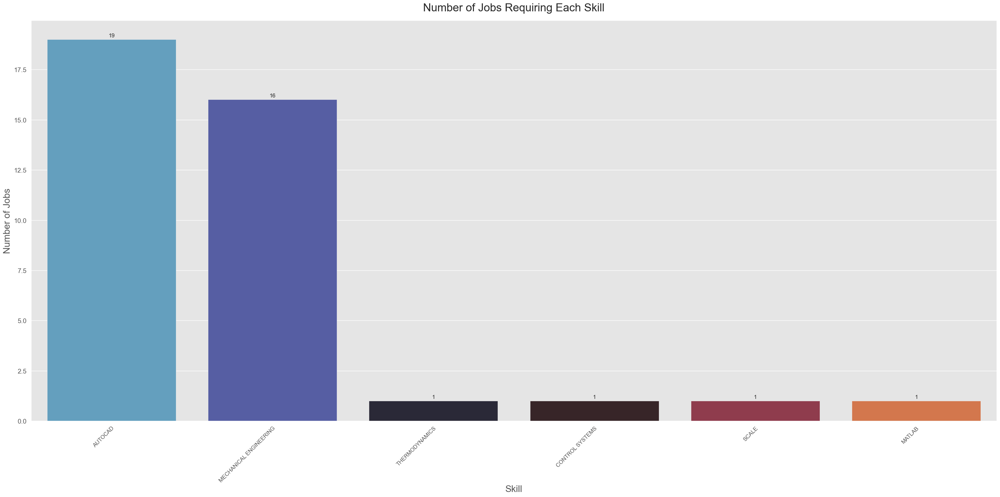

In [217]:
#plt.figure(figsize=(40,20),dpi=100)
#chart = sns.barplot(x=skill_df["Skill"],y=skill_df["Number of jobs requiring the skill"].astype(str),palette="icefire")
#plt.title("Number of jobs that require a particular skill",size=45)
#plt.ylabel("Number of jobs",size=42,rotation=90)
#plt.xlabel("Skill",size=42,rotation=90)
#plt.xticks(fontsize=48,rotation=90)
#plt.yticks(fontsize=48,rotation=90)
#chart.bar_label(chart.containers[0],size=48)
plt.figure(figsize=(30, 15), dpi=100)  # Slightly smaller figure for better proportions

# Convert y-values to numeric if they're strings
skill_df["Number of jobs requiring the skill"] = pd.to_numeric(skill_df["Number of jobs requiring the skill"], errors='coerce')

# Create the plot with adjusted parameters
chart = sns.barplot(
    x="Skill",
    y="Number of jobs requiring the skill",
    data=skill_df,
    palette="icefire",
    order=skill_df.sort_values("Number of jobs requiring the skill", ascending=False)["Skill"]
)

# Title and labels with improved formatting
plt.title("Number of Jobs Requiring Each Skill", size=24, pad=20)
plt.ylabel("Number of Jobs", size=20)
plt.xlabel("Skill", size=20)

# Rotate x-axis labels for better readability
chart.set_xticklabels(
    chart.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=12,
    rotation_mode='anchor'
)

# Adjust y-axis ticks
plt.yticks(fontsize=14)

# Add value labels on bars with improved formatting
for container in chart.containers:
    chart.bar_label(
        container,
        fmt='%.0f',
        label_type='edge',
        padding=3,
        fontsize=12,
        rotation=0
    )

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show plot
plt.show()

From the chart, it can be seen that nuclear engineer positions in the hard skills, AutoCAD (corresponding to the number of jobs 19) and Mechanical Engineering (corresponding to the number of jobs 16) outstanding demand. AutoCAD as a professional drafting software, used to accurately draw the design drawings of nuclear facilities and equipment, to ensure the accuracy and standardisation of the design for the construction and manufacturing process; mechanical engineering skills cover mechanical design, mechanical analysis and other knowledge to ensure the stability and reliability of the mechanical structure of nuclear equipment, as well as the operation and maintenance of the equipment. AutoCAD, as a professional drawing software, is used to accurately draw the design drawings of nuclear facilities and equipments to ensure the accuracy and standardisation of the design, which is conducive to the construction and manufacturing process; while Mechanical Engineering skills cover the knowledge of mechanical design, mechanical analysis, etc., to ensure the stability and reliability of the mechanical structure of nuclear equipments, as well as the normal operation and maintenance of equipments.
In addition, Thermodynamics, Control Systems, Scale (standardised computer analysis tools), MATLAB (mathematical computation and simulation software) and other skills are also in demand (corresponding to the number of posts are 1). Thermodynamic knowledge is used to understand the energy conversion and heat transfer process in nuclear reaction, which helps to optimise the thermal performance of nuclear reactors; control system skills can achieve accurate control and monitoring of the operating parameters of nuclear facilities to ensure operational safety; Scale tools are used for computer analysis of relevant licensing assessment, which assists in the review of compliance; and MATLAB can model, simulate and analyse data of complex nuclear systems, which provides support to engineering design and safety assessment. MATLAB can model, simulate and analyse data of complex nuclear systems, providing support for engineering design and safety assessment.

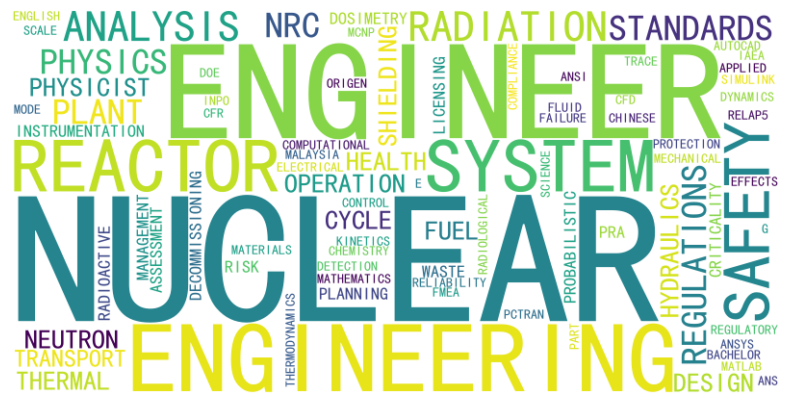

In [221]:
from docx import Document
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Read content from a Word document
def read_docx_file(file_path):
    doc = Document(file_path)
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return "\n".join(full_text)

# Example usage
file_path = 'tmp_nuclear_hard.docx'  # Replace with your Word document path
text = read_docx_file(file_path)

# Specify the font path that supports Chinese (adjust as needed)
font_path = 'simhei.ttf'  # Make sure the path to your font is correct

# Generate the word cloud with specified font
wordcloud = WordCloud(font_path=font_path, width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Save the word cloud as an image
wordcloud.to_file('wordcloud_machine_hard.png')

## 3.3.2 Analysis soft skills

In [222]:
# read data
file_path = r"C:\Users\王晓琴\Desktop\Nuclear\merged\linkedin_Nuclear_final.xlsx"
df_nuclear = pd.read_excel(file_path, engine="openpyxl")
# process data
#df_machine = df_machine.dropna(subset=["Published Date"]).reset_index(drop=True)
df_nuclear.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File
0,Instrumentation Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/instrumentat...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
1,QA/QC Engineer,AtkinsRéalis,Greater Kuala Lumpur,4 weeks ago,https://my.linkedin.com/jobs/view/qa-qc-engine...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
2,Senior Hydropower Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/senior-hydro...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
3,Electrical and Instrumentation Designer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/electrical-a...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
4,Sr Hydrologist Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/sr-hydrologi...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx


In [223]:
soft_skills_3 = [
   "COMMUNICATION", "TEAMWORK", "COLLABORATION", "PROBLEM SOLVING", "CRITICAL THINKING", "CREATIVITY", "ADAPTABILITY", "CURIOSITY", "EMPATHY",
    "TIME MANAGEMENT", "PROJECT MANAGEMENT", "LEADERSHIP", "EMOTIONAL INTELLIGENCE", "PRESENTATION", "NEGOTIATION", "INTERPERSONAL SKILLS",
    "STORYTELLING", "DECISION MAKING", "ACCOUNTABILITY", "ACTIVE LISTENING", "CONFLICT RESOLUTION", "GROWTH MINDSET", "STRATEGIC THINKING",
    "STAKEHOLDER MANAGEMENT", "RESILIENCE", "OPEN-MINDEDNESS", "INFLUENCING", "SELF-MOTIVATION", "INITIATIVE", "AGILITY",
    "MULTITASKING", "LEARNING AGILITY", "CROSS-FUNCTIONAL COMMUNICATION", "ANALYTICAL THINKING", "DETAIL ORIENTATION", "WORK ETHIC",
    "RESPONSIBILITY", "COLLABORATION WITH NON-TECHNICAL TEAMS", "FLEXIBILITY", "DIPLOMACY", "MENTORING", "FACILITATION",
    "CONSENSUS BUILDING", "BUSINESS COMMUNICATION", "PROFESSIONALISM", "CONFIDENCE", "RESPECTFULNESS", "FEEDBACK HANDLING",
    "DELEGATION", "TRUST BUILDING", "CULTURAL AWARENESS", "ORGANIZATIONAL SKILLS", "TASK PRIORITIZATION", "EXPECTATION MANAGEMENT",
    "CLIENT-FACING SKILLS", "NETWORKING", "PERSUASIVENESS", "RELATIONSHIP BUILDING", "CHANGE MANAGEMENT", "COACHING", "DECISION SUPPORT",
    "GOAL SETTING", "MOTIVATIONAL SKILLS", "PATIENCE", "ACCOUNT MANAGEMENT", "TEAM EMPOWERMENT", "USER EMPATHY", "INTERVIEWING SKILLS",
    "PEER REVIEW SKILLS", "CONSTRUCTIVE FEEDBACK", "REMOTE COLLABORATION", "VIRTUAL COMMUNICATION", "PERSUASIVE WRITING", "MEETING FACILITATION",
    "VISION SETTING", "EMPOWERMENT", "WORK-LIFE BALANCE AWARENESS", "NONVERBAL COMMUNICATION", "FOCUS MANAGEMENT", "PROCESS THINKING",
    "SENSEMAKING", "DIPLOMATIC COMMUNICATION", "SUPPORTIVENESS", "ETHICAL JUDGEMENT", "CONSENSUS THINKING", "COLLABORATIVE PLANNING",
    "TRANSPARENCY"
]

# Adding above technical_skills into our DataFrame ( filling them with 0 )
# Setting the values of technical skills columns to 0
df_nuclear[soft_skills_3] = 0

# Displaying the first few rows of the DataFrame
df_nuclear.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File,COMMUNICATION,TEAMWORK,...,NONVERBAL COMMUNICATION,FOCUS MANAGEMENT,PROCESS THINKING,SENSEMAKING,DIPLOMATIC COMMUNICATION,SUPPORTIVENESS,ETHICAL JUDGEMENT,CONSENSUS THINKING,COLLABORATIVE PLANNING,TRANSPARENCY
0,Instrumentation Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/instrumentat...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
1,QA/QC Engineer,AtkinsRéalis,Greater Kuala Lumpur,4 weeks ago,https://my.linkedin.com/jobs/view/qa-qc-engine...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Senior Hydropower Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/senior-hydro...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Electrical and Instrumentation Designer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/electrical-a...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Sr Hydrologist Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/sr-hydrologi...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0


In [224]:
# Extracting skills(keywords) from job_description coloumn
# We can perform same task with nlptk or keybert libraries
# Exammple of list comprehension
skills_6 = df_nuclear["Job Description"].str.upper().apply(lambda x: [i.upper() for i in soft_skills_3 if i in x])

In [225]:
skills_6

0                                       [COMMUNICATION]
1     [COMMUNICATION, LEADERSHIP, INTERPERSONAL SKILLS]
2     [COMMUNICATION, TEAMWORK, LEADERSHIP, PRESENTA...
3                             [COMMUNICATION, TEAMWORK]
4                                                    []
5     [COMMUNICATION, COLLABORATION, PROJECT MANAGEM...
6                                                    []
7                                       [COMMUNICATION]
8               [FLEXIBILITY, CONFIDENCE, TRANSPARENCY]
9     [COMMUNICATION, COLLABORATION, PROJECT MANAGEM...
10                                      [COMMUNICATION]
11                            [COMMUNICATION, TEAMWORK]
12    [COMMUNICATION, COLLABORATION, PROJECT MANAGEM...
13                                      [COMMUNICATION]
14                                      [COMMUNICATION]
15                                                   []
16                            [COMMUNICATION, TEAMWORK]
17    [COMMUNICATION, LEADERSHIP, INITIATIVE, FL

In [226]:
# Filling our Skills_columns and flaging them with appropriate value
# Setting the values of technical skills columns to 1 based on skill sets
for index, skill_set in enumerate(skills_6):
    for x in skill_set:
        #df[x][index] = 1
        df_nuclear.loc[index, x] = 1

In [227]:
df_nuclear["COMMUNICATION"][4]

0

In [228]:
df_nuclear.to_excel("soft_skills_nuclear_keywords.xlsx", index=False) 

In [229]:
for i in soft_skills_3:
    if len(df_nuclear[i].unique()) == 1:
        df_nuclear.drop(i, axis=1, inplace=True)

In [230]:
# Jobs that require Specific particular skill
# Creating a DataFrame for skills count

# Dropping unnecessary columns from the DataFrame
df_nuclear_soft = df_nuclear.drop(["Job Title", "Job Description", "Requirements", "Source File", "Company", "Published Date", "Job Link", "Location"], axis=1)

df_nuclear_soft

,COMMUNICATION,TEAMWORK,COLLABORATION,PROBLEM SOLVING,ADAPTABILITY,PROJECT MANAGEMENT,LEADERSHIP,PRESENTATION,INTERPERSONAL SKILLS,DECISION MAKING,...,RESPONSIBILITY,FLEXIBILITY,MENTORING,FACILITATION,CONFIDENCE,ORGANIZATIONAL SKILLS,RELATIONSHIP BUILDING,CHANGE MANAGEMENT,COACHING,TRANSPARENCY
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,1,1,0,0,0,0,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
9,1,0,1,0,0,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0


In [231]:
# Initializing an empty dictionary to store skill counts
skill_dic = {}
# Counting the number of jobs requiring each skill
for i in df_nuclear_soft.columns:
    skill_dic[i] = df_nuclear[i].sum()

# Converting the dictionary to a list of tuples
data = list(skill_dic.items())

# Creating a DataFrame from the skill count data
skill_df = pd.DataFrame(data, columns=['Skill', 'Number of jobs requiring the skill'])
skill_df 

,Skill,Number of jobs requiring the skill
0,COMMUNICATION,33
1,TEAMWORK,15
2,COLLABORATION,7
3,PROBLEM SOLVING,1
4,ADAPTABILITY,1
5,PROJECT MANAGEMENT,9
6,LEADERSHIP,8
7,PRESENTATION,3
8,INTERPERSONAL SKILLS,2
9,DECISION MAKING,2


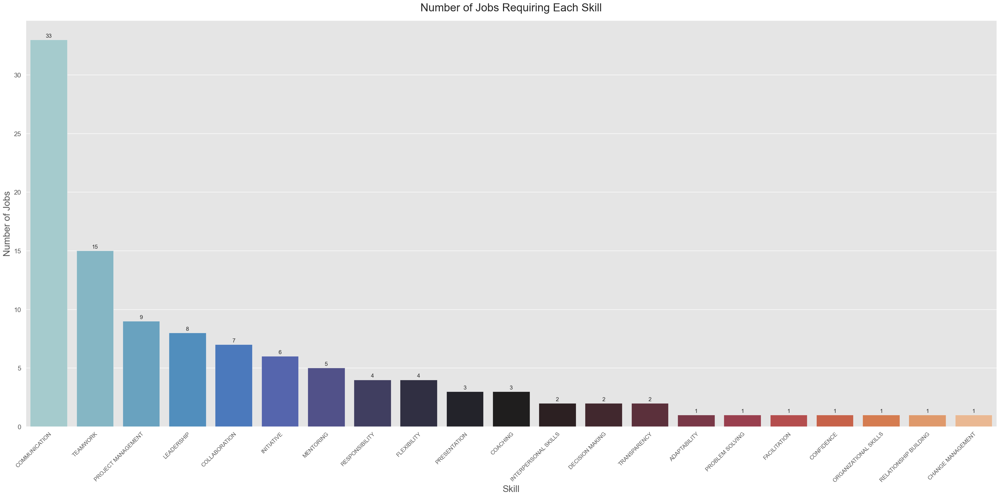

In [232]:
#plt.figure(figsize=(40,20),dpi=100)
#chart = sns.barplot(x=skill_df["Skill"],y=skill_df["Number of jobs requiring the skill"].astype(str),palette="icefire")
#plt.title("Number of jobs that require a particular skill",size=45)
#plt.ylabel("Number of jobs",size=42,rotation=90)
#plt.xlabel("Skill",size=42,rotation=90)
#plt.xticks(fontsize=48,rotation=90)
#plt.yticks(fontsize=48,rotation=90)
#chart.bar_label(chart.containers[0],size=48)
plt.figure(figsize=(30, 15), dpi=100)  # Slightly smaller figure for better proportions

# Convert y-values to numeric if they're strings
skill_df["Number of jobs requiring the skill"] = pd.to_numeric(skill_df["Number of jobs requiring the skill"], errors='coerce')

# Create the plot with adjusted parameters
chart = sns.barplot(
    x="Skill",
    y="Number of jobs requiring the skill",
    data=skill_df,
    palette="icefire",
    order=skill_df.sort_values("Number of jobs requiring the skill", ascending=False)["Skill"]
)

# Title and labels with improved formatting
plt.title("Number of Jobs Requiring Each Skill", size=24, pad=20)
plt.ylabel("Number of Jobs", size=20)
plt.xlabel("Skill", size=20)

# Rotate x-axis labels for better readability
chart.set_xticklabels(
    chart.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=12,
    rotation_mode='anchor'
)

# Adjust y-axis ticks
plt.yticks(fontsize=14)

# Add value labels on bars with improved formatting
for container in chart.containers:
    chart.bar_label(
        container,
        fmt='%.0f',
        label_type='edge',
        padding=3,
        fontsize=12,
        rotation=0
    )

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show plot
plt.show()

From the data provided, Communication is at the top of the list, with 33 positions required, indicating that staff in this position need to communicate clearly and effectively with team members, other departments and stakeholders, which is crucial to coordinating the complex work in nuclear projects and ensuring the smooth progress of all aspects. Teamwork and collaboration are also more important, the number of positions required is 15 and 7 respectively. Nuclear engineering work involves multi-disciplinary and multi-disciplinary collaborative operations, such as nuclear reactor design requires the cooperation of mechanical, electrical, physical and other professionals, good teamwork and collaboration can integrate the advantages of all parties to enhance the efficiency and quality of work. Project management skills are also valued, corresponding to the number of posts 9, nuclear engineering projects are usually large-scale, long cycle, high risk, with project management skills to help rational planning of resources, control the progress, to deal with risks, to ensure that the project is completed according to plan. In addition, soft skills such as leadership and sense of responsibility are also in demand to a certain extent, and these skills have a positive significance in leading the direction of the team and ensuring the quality and safety of the work in the project.

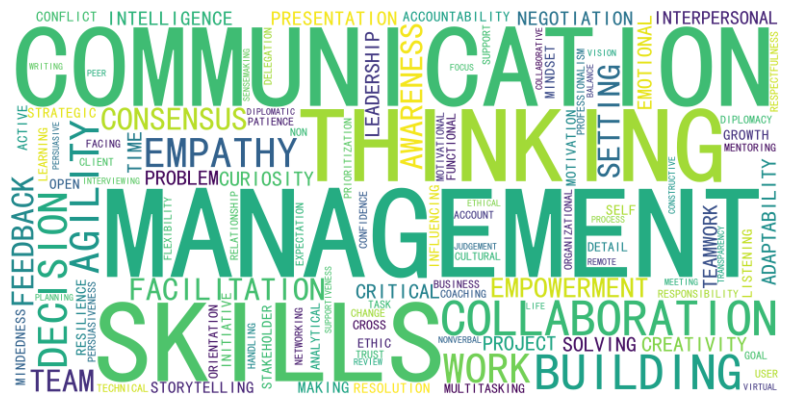

In [233]:
from docx import Document
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Read content from a Word document
def read_docx_file(file_path):
    doc = Document(file_path)
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return "\n".join(full_text)

# Example usage
file_path = 'tmp_machine_soft.docx'  # Replace with your Word document path
text = read_docx_file(file_path)

# Specify the font path that supports Chinese (adjust as needed)
font_path = 'simhei.ttf'  # Make sure the path to your font is correct

# Generate the word cloud with specified font
wordcloud = WordCloud(font_path=font_path, width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Save the word cloud as an image
wordcloud.to_file('wordcloud_machine_hard.png')

## 3.4 LDA about Nuclear Engineer

In [234]:
#read in data
# df = pd.read_csv('indeed_data.csv', encoding='cp1252')
file_path = r"C:\Users\王晓琴\Desktop\Nuclear\merged\linkedin_Nuclear_final.xlsx"
df = pd.read_excel(file_path, engine="openpyxl")
#print first few rows
print(df.shape)
df.head()

(41, 8)


,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File
0,Instrumentation Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/instrumentat...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
1,QA/QC Engineer,AtkinsRéalis,Greater Kuala Lumpur,4 weeks ago,https://my.linkedin.com/jobs/view/qa-qc-engine...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
2,Senior Hydropower Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/senior-hydro...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
3,Electrical and Instrumentation Designer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/electrical-a...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx
4,Sr Hydrologist Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/sr-hydrologi...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx


### 3.4.1 Topic modelling

In [235]:
import re
import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Download required NLTK resources (run only once)
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize tokenizer, stopwords, and lemmatizer
wpt = WordPunctTokenizer()
stop_words = set(stopwords.words('english'))
stop_words.update([
    'from', 'subject', 're', 'edu', 'use', 'personal', 'help', 'people', 'youll', 'whats', 'thats', 'inspire', 'equity',
    'excited', 'better', 'analyst', 'entry','filing', 'closing','cicd', 'devops', 'react', 'scalable', 'restful', 
    'dockor', 'jenkins', 'preventive', 'keysight', 'marital', 'regard', 'agoda', 'ancestry', 'seo', 'ubuntu', 'see',
    'enough','opportunity', 'global','customer', 'client', 'across', 'role', 'company', 'drive', 'world', 'value',
    'new', 'growth', 'career', 'need', 'insight', 'culture', 'platform', 'service', 'system', 'operation', 'including',
    'relevant', 'job', 'requirement', 'ensuring', 'within', 'internal', 'ability', 'policy', 'provide','activity',
    'improvement','knowledge', 'operational', 'task','issue','technology', 'technical', 'engineering', 'tool', 
    'test', 'using', 'computer', 'science', 'best', 'practice', 'understanding','basis','safe', 'design','disability', 
    'status', 'national', 'requirement', 'employer','origin', 'religion', 'together', 'employment', 'source','required', 
    'etc', 'added', 'committed', 'direct', 'equal', 'sale', 'part', 'strong', 'relationship', 'study', 'offer', 'financial',
    'key', 'looking', 'level', 'learning', 'content', 'join', 'make', 'one', 'user', 'every', 'diverse', 'bring', 'impact','life', 
    'maintain', 'good', 'report', 'time', 'service', 'drawing', 'well', 'existing', 'line', 'u', 'related', 'gender', 'policy'
])

lemmatizer = WordNetLemmatizer()

def normalize_document(doc, stop_words=stop_words):
    """
    Cleans and normalizes text by:
    - Removing special characters and digits
    - Lowercasing
    - Tokenizing
    - Removing stopwords and one-character tokens
    - Lemmatizing
    - Removing pure numeric tokens
    Returns cleaned text as a single string.
    """
    doc = re.sub(r'[^a-zA-Z\s]', '', doc, re.I | re.A)
    doc = doc.lower().strip()
    tokens = wpt.tokenize(doc)
    filtered_tokens = [
        t for t in tokens
        if t not in stop_words and len(t) > 1 and not t.isnumeric()
    ]
    lemmatized = [lemmatizer.lemmatize(token) for token in filtered_tokens]
    return ' '.join(lemmatized)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\王晓琴\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\王晓琴\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [236]:
df['Job Description Clean'] = df['Job Description'].apply(normalize_document)

In [237]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd

# Vectorization
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(df['Job Description Clean'])

# Compute cosine similarity matrix
cos_df = pd.DataFrame(cosine_similarity(X_train_counts))

# Create index pairs (i, j) with corresponding similarity values
i, j = np.indices(cos_df.shape).reshape(2, -1)
cos_values = cos_df.values.reshape(-1)
cos_sim_df = pd.DataFrame({'i': i, 'j': j, 'sim': cos_values})

# Find highly similar duplicates (excluding self-similarity)
cos_rem = cos_sim_df[(cos_sim_df['sim'] > 0.98) & (i != j)]

# Use product of indices to uniquely identify pairs and drop duplicates
cos_rem['i*j'] = cos_rem['i'] * cos_rem['j']
drop_rows = np.unique(cos_rem.drop_duplicates(subset=['i*j'], keep='first')['i'].values)

# Drop duplicate entries from the original dataframe
df = df[~df.index.isin(drop_rows)].reset_index(drop=True)

In [238]:
df.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File,Job Description Clean
0,Instrumentation Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/instrumentat...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,created integration longstanding organization ...
1,QA/QC Engineer,AtkinsRéalis,Greater Kuala Lumpur,4 weeks ago,https://my.linkedin.com/jobs/view/qa-qc-engine...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,created integration longstanding organization ...
2,Senior Hydropower Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",3 weeks ago,https://my.linkedin.com/jobs/view/senior-hydro...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,created integration longstanding organization ...
3,Senior Hydrologist Engineer,AtkinsRéalis,Greater Kuala Lumpur,4 weeks ago,https://my.linkedin.com/jobs/view/senior-hydro...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,created integration longstanding organization ...
4,Process Engineer,AtkinsRéalis,"Bukit Raja, Selangor, Malaysia",4 weeks ago,https://my.linkedin.com/jobs/view/process-engi...,Created by the integration of long-standing or...,Created by the integration of long-standing or...,linkedin_Nuclear_4_10.xlsx,created integration longstanding organization ...


In [239]:
corpus = df['Job Description Clean']

### 3.4.2 Top 2 topics for each document

In [240]:
import nltk 

wpt = nltk.WordPunctTokenizer()
stop_words = nltk.corpus.stopwords.words('english')
lemmatizer = nltk.WordNetLemmatizer()

#Function to pre-process the text information

def normalize_document(doc):
    
    # lower case and remove special characters\whitespaces
    doc = re.sub(r'[^a-zA-Z\s]', '', doc, re.I|re.A) #re.I (ignore case), re.A (ASCII-only matching)
    doc = doc.lower()
    doc = doc.strip()
    
    # tokenize document
    tokens = wpt.tokenize(doc)
    
    # filter stopwords out of document
    filtered_tokens = [token for token in tokens if token not in stop_words]
    
    # Lemmatise document from filtered tokens
    lem_text = [lemmatizer.lemmatize(i) for i in filtered_tokens]
    
    # Remove words that are only one character.
    lem_text = [token for token in lem_text if len(token) > 1]
    
    # Remove numbers, but not words that contain numbers.
    lem_text = [token for token in lem_text if not token.isnumeric()]
    
    doc = ' '.join(lem_text)
    return doc

normalize_corpus = np.vectorize(normalize_document)

norm_corpus = normalize_corpus(corpus)

In [241]:
from nltk.tokenize import word_tokenize
import gensim.corpora as corpora

#Tokenise the corpus
tokenized_corp = [word_tokenize(i) for i in norm_corpus]

# Create Dictionary
id2word = corpora.Dictionary(tokenized_corp)

#Remove words that don't feature 20 times and those that feature in over 50% of documents
id2word.filter_extremes(no_below=20, no_above=0.5)

texts = tokenized_corp

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [242]:
print(df['Job Description Clean'].head())

0    created integration longstanding organization ...
1    created integration longstanding organization ...
2    created integration longstanding organization ...
3    created integration longstanding organization ...
4    created integration longstanding organization ...
Name: Job Description Clean, dtype: object


In [243]:
from gensim.corpora import Dictionary

# Tokenize documents
tokenized_docs = [doc.split() for doc in df['Job Description Clean']]

# Create dictionary
id2word = Dictionary(tokenized_docs)

# Filter extremes (optional but recommended)
id2word.filter_extremes(no_below=2, no_above=0.95)

# Create corpus: list of Bag-of-Words
corpus = [id2word.doc2bow(doc) for doc in tokenized_docs]

# Check if corpus is empty
print(f"Corpus size: {len(corpus)}")
print(f"Dictionary size: {len(id2word)}")

Corpus size: 32
Dictionary size: 1034


In [244]:
from gensim.models import LdaMulticore

lda_model = LdaMulticore(
    corpus=corpus,
    id2word=id2word,
    num_topics=2,
    random_state=123,
    chunksize=100,
    passes=100,
    per_word_topics=True
)

In [245]:
from gensim.models import CoherenceModel
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  nan


In [246]:
from pprint import pprint
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.042*"project" + 0.011*"business" + 0.010*"product" + 0.010*"support" + '
  '0.010*"industrial" + 0.010*"management" + 0.008*"cost" + 0.008*"system" + '
  '0.008*"ups" + 0.008*"data"'),
 (1,
  '0.012*"project" + 0.011*"service" + 0.010*"process" + 0.008*"client" + '
  '0.007*"energy" + 0.007*"drawing" + 0.006*"code" + 0.006*"opportunity" + '
  '0.006*"future" + 0.006*"management"')]


In [247]:
lda_dict = {0:'Nuclear technical ', 
            1:'Interpersonal Abilities',
            # 4:'Equal Opportunities',
            # 5:'Analytics & Statistical Modelling',
            # 6:'Senior Projects',
            # 7:'ML, Big Data & Cloud Computing',
            # 8:'Referral Scheme', 
           '-':'-'}

In [248]:
import pyLDAvis
import pyLDAvis.gensim_models  
from gensim.models import LdaModel
from gensim.corpora import Dictionary
# Key setting: Avoid joblib multiprocessing errors (especially on Windows)
LDAvis_prepared = gensimvis.prepare(lda_model, corpus, id2word, n_jobs=1)

# Enable inline visualization in notebooks
pyLDAvis.enable_notebook()

# Prepare the visualization again
LDAvis_prepared = gensimvis.prepare(lda_model, corpus, id2word, n_jobs=1)

# Save the interactive LDA visualization as an HTML file
pyLDAvis.save_html(LDAvis_prepared, 'lda_visualization_nuclear.html')

print("✔️ The HTML file has been successfully saved as 'lda_visualization_nuclear.html'. Please open it in a browser to view the interactive visualization.")

# Automatically open the visualization in the default web browser
webbrowser.open('lda_visualization_nuclear.html')

✔️ The HTML file has been successfully saved as 'lda_visualization_nuclear.html'. Please open it in a browser to view the interactive visualization.


True

Topic 1: The words ‘code’, ‘process’, ‘software’, ‘mechanical’ and ‘equipment’ are closely related to the hard skills of nuclear engineers. The words ‘code’, ‘process’, ‘software’, ‘mechanical’ and ‘equipment’ are closely related to the hard skills of nuclear engineers. Nuclear engineers need to have knowledge of programming codes for simulation and data analysis of nuclear facilities; be familiar with the process flow to ensure that the operation of nuclear reactors and other equipment is scientifically sound; use professional software for design, simulation and monitoring; and have knowledge of the mechanical aspects to ensure that the mechanical structure of nuclear equipment is designed, installed and maintained in accordance with the requirements.

Topic 2: ‘ business’, “support”, “meeting” and “leading” reflect soft skills requirements. skills requirements. Nuclear engineers are expected to understand business-related content, collaborate with the team to provide technical support, exchange information and communicate through meetings, and in some cases take on leadership roles to lead the team to complete project tasks, demonstrating soft skills such as teamwork, communication and leadership.

# 4. Analysing energy engineer from linkedin

## 4.1 Exploratory Analysis about energy engineer

The first dataset used in the study was obtained by crawling LinkedIn, a professional social networking platform, with the keyword ‘energy engineer’. A total of 116 job postings related to this keyword were successfully collected through crawling techniques. The dataset covers the core fields such as job title, posting date, company information, job requirements, geographic location and so on.

In [474]:
# read data
file_path = r"C:\Users\王晓琴\Desktop\Energy\merged\linkedin_Energy_final.xlsx"
df_energy = pd.read_excel(file_path, engine="openpyxl")
# process data
#df_machine = df_machine.dropna(subset=["Published Date"]).reset_index(drop=True)
df_energy.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File
0,Customer Service Intern,Verdant Solar Sdn Bhd,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/customer-ser...,"At Verdant Solar, we see interns as part of ou...","At Verdant Solar, we see interns as part of ou...",linkedin_Energy_1_merged.xlsx
1,Trainee - Resource Center Malaysia,SBM Offshore,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",12 months ago,https://my.linkedin.com/jobs/view/trainee-reso...,Our Vision.SBM Offshore believes the oceans wi...,Our Vision.SBM Offshore believes the oceans wi...,linkedin_Energy_1_merged.xlsx
2,Marketing Intern,Saxon Renewables,"Petaling Jaya, Selangor, Malaysia",2 weeks ago,https://my.linkedin.com/jobs/view/marketing-in...,Marketing Intern – Saxon Renewables Energy Sdn...,Marketing Intern – Saxon Renewables Energy Sdn...,linkedin_Energy_1_merged.xlsx
3,"Intern, Creative",Gentari,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",2 weeks ago,https://my.linkedin.com/jobs/view/intern-creat...,Changing how we live todayto help secure our f...,Changing how we live todayto help secure our f...,linkedin_Energy_1_merged.xlsx
4,Postgraduate Researcher (PhD),Xiamen University Malaysia,"Sepang, Selangor, Malaysia",1 day ago,https://my.linkedin.com/jobs/view/postgraduate...,🚀 Join Our PhD Program in New Energy Science &...,🚀 Join Our PhD Program in New Energy Science &...,linkedin_Energy_1_merged.xlsx


In [475]:
df_energy.shape

(116, 8)

In [476]:
df_energy['Job Description'].apply(lambda x: len(x.split())).sum()

55403

In [477]:
df_energy = df_energy.drop_duplicates(subset =['Location', 'Job Description']).reset_index(drop=True)

#Replace missing values so reg expressions can be used for contract and salary
df_energy = df_energy.fillna('-')

In [478]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import pandas as pd

# Cleaning function (standardised)
def clean_title(title):
    title = str(title).lower()
    title = re.sub(r'[^a-z\s]', '', title)
    title = re.sub(r'\s+', ' ', title).strip()
    return title

df_energy['Job Title Clean'] = df_energy['Job Title'].apply(clean_title)
df_energy.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File,Job Title Clean
0,Customer Service Intern,Verdant Solar Sdn Bhd,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/customer-ser...,"At Verdant Solar, we see interns as part of ou...","At Verdant Solar, we see interns as part of ou...",linkedin_Energy_1_merged.xlsx,customer service intern
1,Trainee - Resource Center Malaysia,SBM Offshore,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",12 months ago,https://my.linkedin.com/jobs/view/trainee-reso...,Our Vision.SBM Offshore believes the oceans wi...,Our Vision.SBM Offshore believes the oceans wi...,linkedin_Energy_1_merged.xlsx,trainee resource center malaysia
2,Marketing Intern,Saxon Renewables,"Petaling Jaya, Selangor, Malaysia",2 weeks ago,https://my.linkedin.com/jobs/view/marketing-in...,Marketing Intern – Saxon Renewables Energy Sdn...,Marketing Intern – Saxon Renewables Energy Sdn...,linkedin_Energy_1_merged.xlsx,marketing intern
3,"Intern, Creative",Gentari,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",2 weeks ago,https://my.linkedin.com/jobs/view/intern-creat...,Changing how we live todayto help secure our f...,Changing how we live todayto help secure our f...,linkedin_Energy_1_merged.xlsx,intern creative
4,Postgraduate Researcher (PhD),Xiamen University Malaysia,"Sepang, Selangor, Malaysia",1 day ago,https://my.linkedin.com/jobs/view/postgraduate...,🚀 Join Our PhD Program in New Energy Science &...,🚀 Join Our PhD Program in New Energy Science &...,linkedin_Energy_1_merged.xlsx,postgraduate researcher phd


### 4.1.1 Most frequent companies

When analysing LinkedIn Malaysia job posting data, identifying high-frequency recruiters is important to understand the dominant players in the local job market. These companies are typically large or in constant demand for talent, and their hiring activity measures industry dynamism, labour mobility and job supply, revealing the source of employment opportunities and providing empirical evidence for job seekers and policy makers.

In [479]:
SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 16

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize

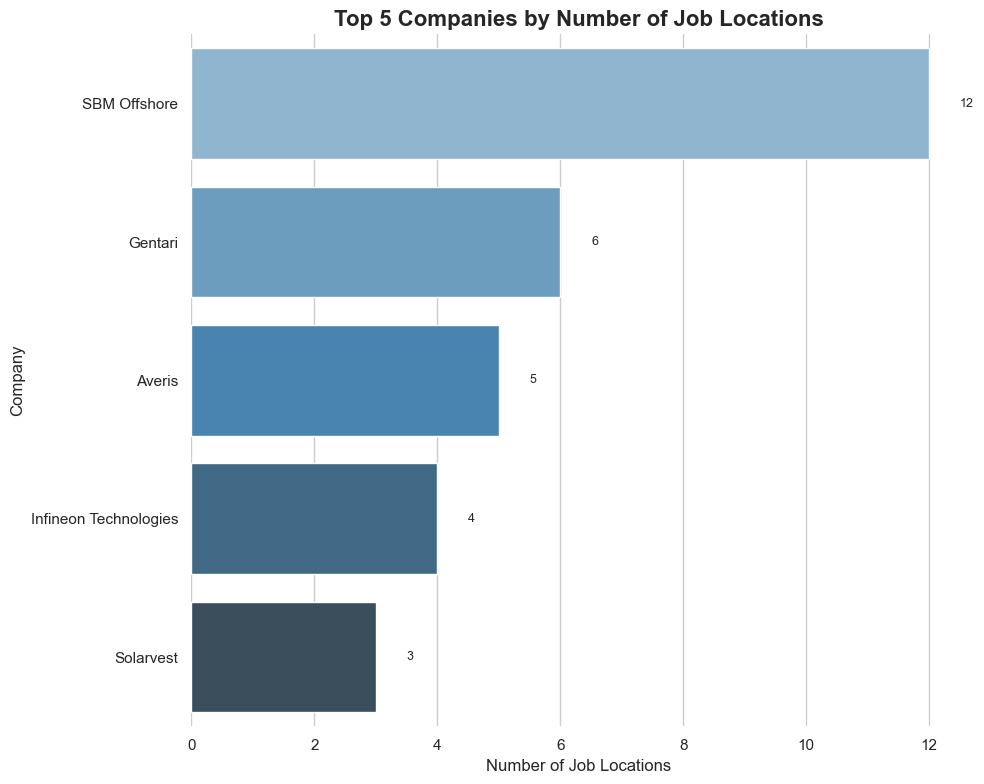

In [480]:
# Group by company and count the number of job locations
rec_df = df_energy.groupby('Company').count().sort_values(by='Location', ascending=False).reset_index()[['Company', 'Location']].copy()

# Take the top 14 companies
top5 = rec_df.head(5)

# Set plot style
sns.set(style="whitegrid")
plt.figure(figsize=(10, 8))

# Create the bar plot with an improved color palette
barplot = sns.barplot(
    x="Location", 
    y="Company", 
    data=top5, 
    palette="Blues_d"
)

# Add value labels to the bars
for index, value in enumerate(top5["Location"]):
    plt.text(value + 0.5, index, str(value), va='center', fontsize=9)

# Add title and axis labels
plt.title('Top 5 Companies by Number of Job Locations', fontsize=16, fontweight='bold')
plt.xlabel('Number of Job Locations', fontsize=12)
plt.ylabel('Company', fontsize=12)

# Remove top and right spines
sns.despine(left=True, bottom=True)

# Optimize layout
plt.tight_layout()
plt.show()

### 4.1.2 regional distribution

In [481]:
list(df_energy[(df_energy['Location'].str.contains('Bukit'))  & (df_energy['Company']=='Wood')]['Location'].values)

[]

By grouping jobs by ‘Location’ and counting the number of jobs corresponding to each location, we identify recurring workplaces and analyse the distribution and concentration of jobs in different locations.

In [482]:
#Set to lower case so capitalised titles don't get counted separately
df_energy['Location'] = df_energy['Location'].apply(lambda x: x.lower())

#Group by Role to investigate different types
df_grp = df_energy.groupby('Location').count().reset_index().sort_values(by='Company', ascending=False)[['Location', 'Company']]

print("Number of unique job locations:", df_grp.shape[0])

print("Number of titles used more than once:", df_grp[df_grp.Company > 1].shape[0])

df_grp[df_grp.Company > 1]

Number of unique job locations: 24
Number of titles used more than once: 12


,Location,Company
12,"kuala lumpur, federal territory of kuala lumpu...",33
17,"petaling jaya, selangor, malaysia",14
4,"federal territory of kuala lumpur, malaysia",9
6,greater kuala lumpur,8
5,"georgetown, penang, malaysia",5
15,malaysia,4
20,"shah alam, selangor, malaysia",4
16,"melaka, malacca, malaysia",4
23,"wp. kuala lumpur, federal territory of kuala l...",4
7,"johor baharu, johore, malaysia",4


In [483]:
# Define city classification mapping (keywords mapped to standardized city names)
city_mapping = {
    "kuala lumpur": "Kuala Lumpur", "federal territory of kuala lumpur": "Kuala Lumpur", "wp.": "Kuala Lumpur", "bukit jalil": "Kuala Lumpur",
    "kl eco city": "Kuala Lumpur", "bangsar south": "Kuala Lumpur", "bukit persekutuan": "Kuala Lumpur", "taman wilayah": "Kuala Lumpur",
    "greater kuala lumpur": "Kuala Lumpur", "selangor": "Selangor", "damansara": "Selangor", "petaling": "Selangor", "subang": "Selangor", "shah alam": "Selangor",
    "cyberjaya": "Selangor", "kajang": "Selangor", "klang": "Selangor", "ampang": "Selangor", "seri kembangan": "Selangor",
    "semenyih": "Selangor", "batu caves": "Selangor", "puncak alam": "Selangor", "pelabuhan klang": "Selangor", "penang": "Penang", 
    "bayan lepas": "Penang", "georgetown": "Penang", "butterworth": "Penang", "bukit mertajam": "Penang",
    "batu kawan": "Penang", "taman pulau pinang": "Penang", "perai": "Penang", "seberang perai": "Penang", "george town": "Penang",
    
    "johor": "Johor", "johore": "Johor", "iskandar": "Johor", "masai": "Johor", "pasir gudang": "Johor", "senai": "Johor", "bandar banang jaya": "Johor",
    "greater johor bahru": "Johor", "negri sembilan": "Negeri Sembilan", "negeri sembilan": "Negeri Sembilan", "seremban": "Negeri Sembilan",
    "nilai": "Negeri Sembilan", "port dickson": "Negeri Sembilan", "kedah": "Kedah", "kulim": "Kedah", "langkawi": "Kedah",
    "perak": "Perak", "ipoh": "Perak", "sarawak": "Sarawak", "kuching": "Sarawak",
    "bintulu": "Sarawak", "melaka": "Melaka", "malacca": "Melaka", "putrajaya": "Putrajaya", "pahang": "Pahang", "kuantan": "Pahang"
}

# Convert all location strings to lowercase for matching
df_grp["Location_cleaned"] = df_grp["Location"].str.lower()

# Define a function to classify cities based on keyword matching
def classify_city(location):
    for keyword, city in city_mapping.items():
        if keyword in location:
            return city
    return "Other"  # Assign "Other" if no match is found

# Apply classification function
df_grp["City"] = df_grp["Location_cleaned"].apply(classify_city)

# Aggregate by city
city_summary = df_grp.groupby("City")["Company"].sum().reset_index().sort_values(by="Company", ascending=False)

# Display result
print(city_summary)

           City  Company
1  Kuala Lumpur       58
6      Selangor       25
0         Johor        7
5        Penang        7
3         Other        5
2        Melaka        4
4        Pahang        1


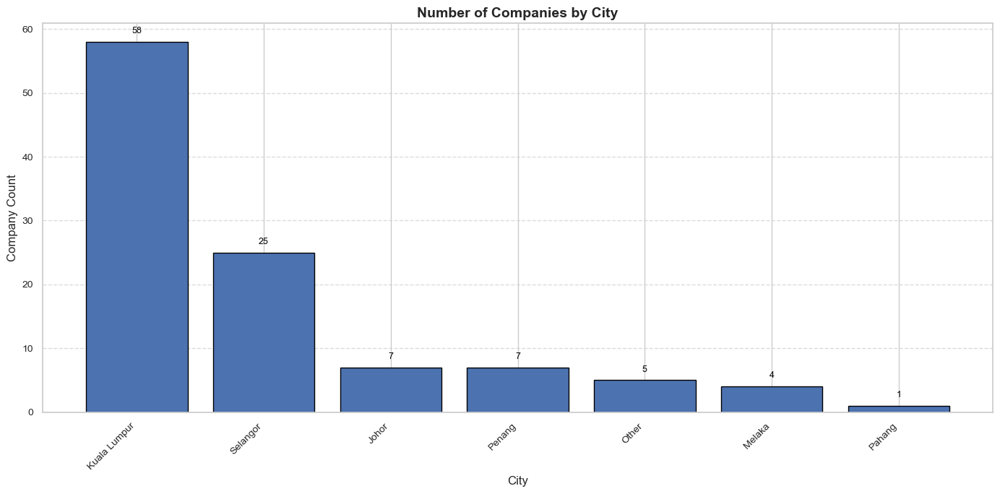

In [484]:
# Sort by Company count (descending)
city_summary_sorted = city_summary.sort_values(by="Company", ascending=False)

# Create the bar chart
plt.figure(figsize=(14, 7))
bars = plt.bar(city_summary_sorted["City"], city_summary_sorted["Company"], color="#4C72B0", edgecolor="black")

# Add data labels above each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        yval + 1,  # Slight upward offset
        f"{int(yval)}",  # Display as integer
        ha="center",
        va="bottom",
        fontsize=9,
        color="black"
    )

# Chart styling
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.title("Number of Companies by City", fontsize=14, weight='bold')
plt.xlabel("City", fontsize=12)
plt.ylabel("Company Count", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

In [485]:
from geopy.geocoders import Nominatim
import pandas as pd
import time

# Initialize the geolocator with a user agent
geolocator = Nominatim(user_agent="location_mapper")

# Define a function to get latitude and longitude from a location string
def get_lat_lon(location):
    try:
        loc = geolocator.geocode(location)
        if loc:
            return pd.Series([loc.latitude, loc.longitude])
    except:
        return pd.Series([None, None])
    return pd.Series([None, None])

# Filter locations with more than 2 companies
df_map = df_grp[df_grp['Company'] > 2].copy()

# Delete records with empty Location column
df_map = df_map.dropna(subset=['Location'])

# Get latitude and longitude for each location
df_map[['lat', 'lon']] = df_map['Location'].apply(get_lat_lon)

# Pause for 1 second between requests to avoid rate limiting
time.sleep(1)

In [486]:
import folium
from folium.plugins import HeatMap

# Create a map centered at the median latitude and longitude
m = folium.Map(location=[df_map['lat'].median(), df_map['lon'].median()], zoom_start=6)

# Prepare heatmap data: [latitude, longitude, weight]
heat_data = [
    [row['lat'], row['lon'], row['Company']]
    for index, row in df_map.iterrows()
    if not pd.isnull(row['lat']) and not pd.isnull(row['lon'])
]

# Add the heatmap layer
HeatMap(heat_data).add_to(m)

# Display the map
m

### 4.1.3 Average Lengths of Job Descriptions in the Dataset

Let's find out average lengths of available job descriptions in the dataset.

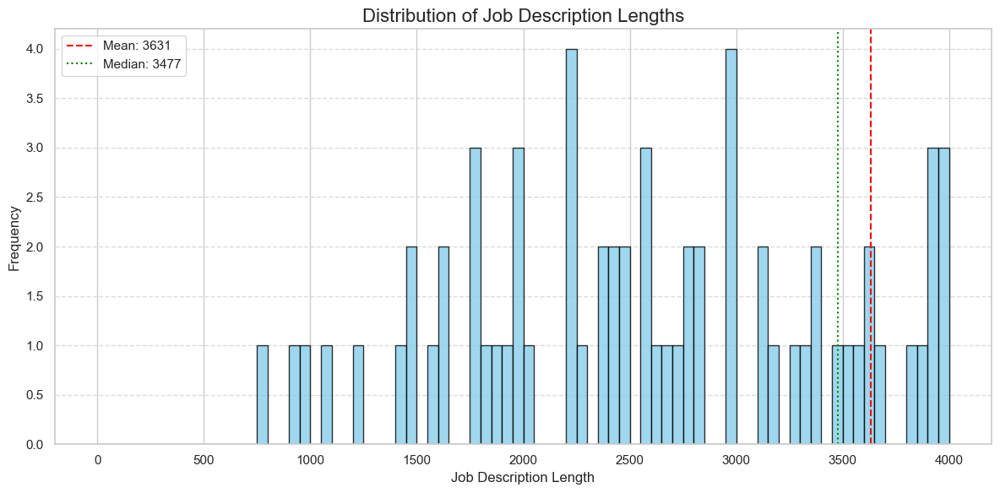

In [487]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the length of each job description
desc_len = [len(desc) for desc in df_energy['Job Description']]

# Set figure size and style
plt.figure(figsize=(12, 6))
plt.hist(desc_len, bins=80, range=(0, 4000), color='skyblue', edgecolor='black', alpha=0.8)

# Add title and axis labels
plt.title('Distribution of Job Description Lengths', fontsize=16)
plt.xlabel('Job Description Length', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add mean and median lines
mean_len = np.mean(desc_len)
median_len = np.median(desc_len)
plt.axvline(mean_len, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {int(mean_len)}')
plt.axvline(median_len, color='green', linestyle='dotted', linewidth=1.5, label=f'Median: {int(median_len)}')

# Add legend and grid
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Optimize layout and display the plot
plt.tight_layout()
plt.show()

## 4.2 Time series about energy engineer

In [488]:
from datetime import datetime, timedelta

def process_date_to_days(date_str):
    today = datetime(2025, 4, 9)

    date_str = str(date_str).lower().strip()

    if 'month' in date_str:
        num_months = int(date_str.split()[0])
        return (today - timedelta(days=num_months * 30)).date()

    elif 'week' in date_str:
        num_weeks = int(date_str.split()[0])
        return (today - timedelta(weeks=num_weeks)).date()

    elif 'day' in date_str:
        num_days = int(date_str.split()[0])
        return (today - timedelta(days=num_days)).date()

    elif 'yesterday' in date_str:
        return (today - timedelta(days=1)).date()

    elif 'today' in date_str:
        return today.date()

    return None  # Return None for unknown formats

# Example: Apply to a DataFrame
# df = pd.DataFrame({'Published Date': ['2 months ago', '3 weeks ago', '5 days ago', 'yesterday', 'today']})
df_energy['Published Date'] = df_energy['Published Date'].apply(process_date_to_days)

print(df_energy.head(50))

                                            Job Title  \
0                             Customer Service Intern   
1                  Trainee - Resource Center Malaysia   
2                                    Marketing Intern   
3                                    Intern, Creative   
4                       Postgraduate Researcher (PhD)   
5                                  Operation Engineer   
6                                 Electrical Engineer   
7                              Site Safety Supervisor   
8             Sustainability Research & Advocacy Lead   
9             Project Development Engineer (Northern)   
10                     Business Development Executive   
11  Business Growth Representative, Corporate Even...   
12                                    Site Technician   
13  Trainee, Shipping / Supply Chain (Penang: Open...   
14                     Energy Hero - Sales Consultant   
15  Quantity Surveyor or Cost & Contract Executive...   
16                             

In [489]:
# Sort the dataframe by the 'Published Date Parsed' column
df_energy = df_energy.sort_values(by='Published Date')

# Count the number of job postings for each date to create a time series
time_series = df_energy.groupby('Published Date').size()

# Apply forward fill method to fill any missing values
time_series = time_series.fillna(method='ffill')

# Detect and remove outliers using the Z-score method
Q1 = time_series.quantile(0.25)  # First quartile
Q3 = time_series.quantile(0.75)  # Third quartile
IQR = Q3 - Q1  # Interquartile range
lower_bound = Q1 - 1.5 * IQR  # Lower bound for outlier detection
upper_bound = Q3 + 1.5 * IQR  # Upper bound for outlier detection

# Filter the time series to remove entries outside of the bounds
filtered_entries = (time_series >= lower_bound) & (time_series <= upper_bound)
time_series = time_series[filtered_entries]
time_series.head()
# Print the processed time series data (after removing outliers)
print("Processed time series data (after removing outliers):", time_series)

Processed time series data (after removing outliers): Published Date
2024-04-14    1
2024-05-14    3
2024-06-13    2
2024-08-12    1
2024-12-10    2
2025-01-09    3
2025-02-08    6
2025-03-10    9
2025-03-19    7
2025-04-03    3
2025-04-04    5
2025-04-05    1
2025-04-06    3
2025-04-07    9
2025-04-08    5
dtype: int64


In [490]:
# create new DataFrame
new_df = pd.DataFrame({'Published Date': time_series.index, 'JobPostings': time_series.values})
new_df

,Published Date,JobPostings
0,2024-04-14,1
1,2024-05-14,3
2,2024-06-13,2
3,2024-08-12,1
4,2024-12-10,2
5,2025-01-09,3
6,2025-02-08,6
7,2025-03-10,9
8,2025-03-19,7
9,2025-04-03,3


In [491]:
# lets set the date into the index
new_df = new_df.set_index('Published Date')

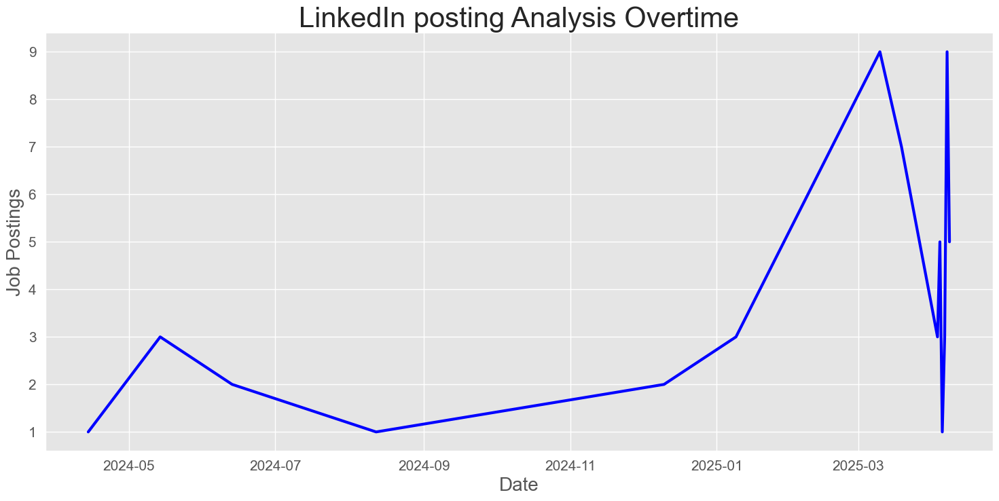

In [492]:
# lets make the plot more readable
plt.style.use('ggplot')
plt.figure(figsize=(18,8))
plt.grid(True)
plt.xlabel('Date', fontsize=(20))
plt.xticks(fontsize=15)
plt.ylabel('Job Postings', fontsize=20)
plt.yticks(fontsize=15)
plt.plot(new_df.JobPostings, linewidth = 3, color = 'blue')
plt.title('LinkedIn posting Analysis Overtime', fontsize = 30)
plt.show()

Between May 2024 and September 2024, the number of job postings was low and fluctuating, with a small increase in May 2024, followed by a decline to a relatively low point in September 2024, suggesting that the demand for Energy Engineer jobs was not strong during this period, and that the market was relatively stable and in low demand. The market is in a relatively stable state with low demand.

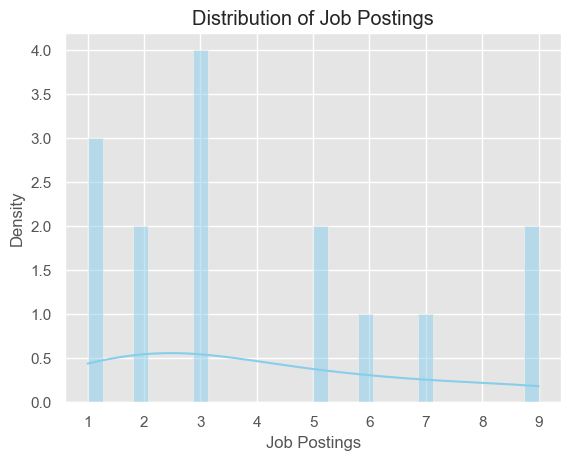

In [493]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of job postings
sns.histplot(new_df['JobPostings'], kde=True, bins=30, color='skyblue')

# Add title and axis labels
plt.title('Distribution of Job Postings')
plt.xlabel('Job Postings')
plt.ylabel('Density')

# Display the plot
plt.show()

In [494]:
# lets plot the rolling mean and rolling standard deviation of the time series data
new_df['JobPostings']

Published Date
2024-04-14    1
2024-05-14    3
2024-06-13    2
2024-08-12    1
2024-12-10    2
2025-01-09    3
2025-02-08    6
2025-03-10    9
2025-03-19    7
2025-04-03    3
2025-04-04    5
2025-04-05    1
2025-04-06    3
2025-04-07    9
2025-04-08    5
Name: JobPostings, dtype: int64

In [495]:
# rolling mean
new_df['JobPostings'].rolling(3)

Rolling [window=3,center=False,axis=0,method=single]

In [496]:
# check the rolling mean
rolmean = new_df['JobPostings'].rolling(3).mean()
rolmean

Published Date
2024-04-14         NaN
2024-05-14         NaN
2024-06-13    2.000000
2024-08-12    2.000000
2024-12-10    1.666667
2025-01-09    2.000000
2025-02-08    3.666667
2025-03-10    6.000000
2025-03-19    7.333333
2025-04-03    6.333333
2025-04-04    5.000000
2025-04-05    3.000000
2025-04-06    3.000000
2025-04-07    4.333333
2025-04-08    5.666667
Name: JobPostings, dtype: float64

In [497]:
# lets check the rolling standard deviation
rolstd = new_df['JobPostings'].rolling(3).std()
rolstd

Published Date
2024-04-14         NaN
2024-05-14         NaN
2024-06-13    1.000000
2024-08-12    1.000000
2024-12-10    0.577350
2025-01-09    1.000000
2025-02-08    2.081666
2025-03-10    3.000000
2025-03-19    1.527525
2025-04-03    3.055050
2025-04-04    2.000000
2025-04-05    2.000000
2025-04-06    2.000000
2025-04-07    4.163332
2025-04-08    3.055050
Name: JobPostings, dtype: float64

### Plotting Before smoothing

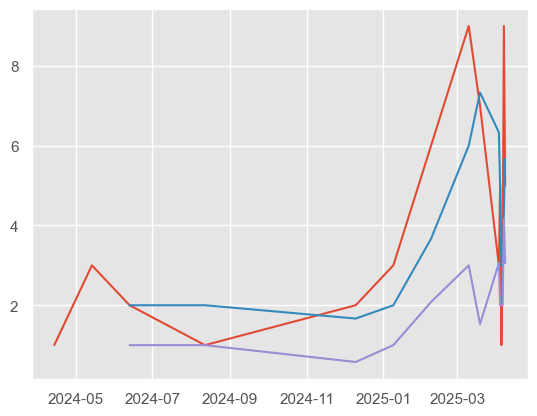

In [498]:
# lets plot those values
plt.plot(new_df.JobPostings)   ##time series data
plt.plot(rolmean)   ## rolling mean
plt.plot(rolstd)      ## rolling std

### plotting After smoothening

In [499]:
# lets plot after smoothing
rolmean = new_df['JobPostings'].rolling(3).mean()  ## smoothning by changing the rolling mean values

rolstd = new_df['JobPostings'].rolling(3).std()    ## smothning by changing the rolling standard deviation values

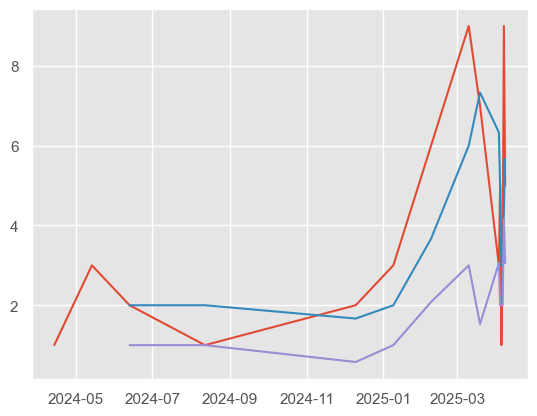

In [500]:
# now plot those values after smoothening
plt.plot(new_df.JobPostings)   ##time series data
plt.plot(rolmean)   ## rolling mean
plt.plot(rolstd)      ## rolling std

### Stationarity check

In [501]:
# importing the adfuller for checking the stationarity
from statsmodels.tsa.stattools import adfuller
diff_series = new_df['JobPostings'].diff().dropna()
adft = adfuller(diff_series)
adft[0:4]

(0.45343700378230795, 0.9833869869729256, 5, 8)

In [502]:
# lets index on adft values
pd.Series(adft[0:4], index= ['test stats', 'P-value', 'lag', 'data points'])

test stats     0.453437
P-value        0.983387
lag            5.000000
data points    8.000000
dtype: float64

In [503]:
# lets create a function where all stationarity details shuould be present

# Test for staionarity
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(3).mean() # rolling mean
    rolstd = timeseries.rolling(3).std() # rolling standard deviation

    # Plot rolling statistics:
    plt.figure(figsize = (18,8))
    plt.grid('both')
    plt.plot(timeseries, color='blue',label='Original', linewidth = 3)
    plt.plot(rolmean, color='red', label='Rolling Mean',linewidth = 3)
    plt.plot(rolstd, color='black', label = 'Rolling Std',linewidth = 4)
    plt.legend(loc='best', fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
    plt.title('Rolling Mean and Standard Deviation', fontsize = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show(block=False)

    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)

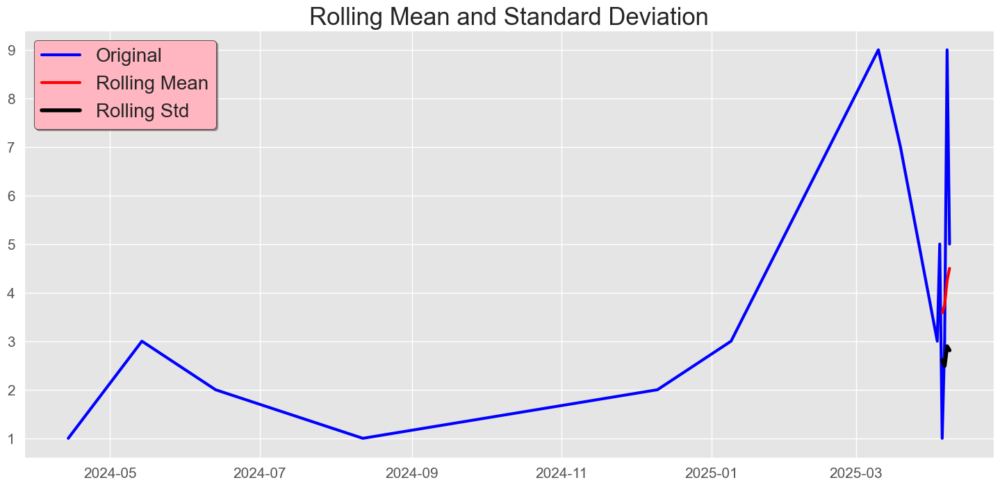

Results of dickey fuller test
Test Statistics               -2.979908
p-value                        0.036814
No. of lags used               5.000000
Number of observations used    9.000000
critical value (1%)           -4.473135
critical value (5%)           -3.289881
critical value (10%)          -2.772382
dtype: float64


In [505]:
# lets test for stationarity
test_stationarity(new_df.JobPostings)

In [506]:
 # smoothening on linkedin data

# lets create a function where all stationarity details shuould be present

# Test for staionarity
def test_stationarity(timeseries):

    # Determing rolling statistics
    rolmean = timeseries.rolling(3).mean() # rolling mean
    rolstd = timeseries.rolling(3).std() # rolling standard deviation

    # Plot rolling statistics:
    plt.figure(figsize = (18,8))
    plt.grid('both')
    plt.plot(timeseries, color='blue',label='Original', linewidth = 3)
    plt.plot(rolmean, color='red', label='Rolling Mean',linewidth = 3)
    plt.plot(rolstd, color='black', label = 'Rolling Std',linewidth = 4)
    plt.legend(loc='best', fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
    plt.title('Rolling Mean and Standard Deviation', fontsize = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show(block=False)

    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)

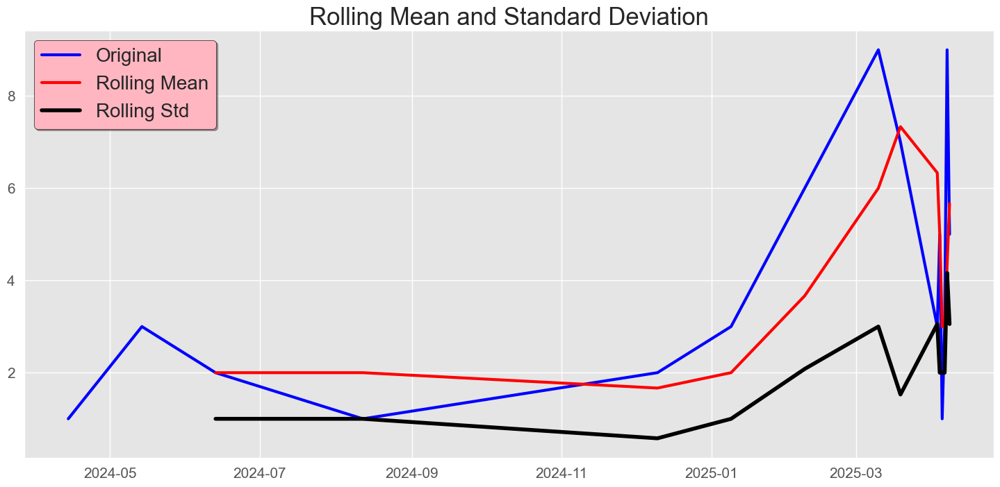

Results of dickey fuller test
Test Statistics               -2.979908
p-value                        0.036814
No. of lags used               5.000000
Number of observations used    9.000000
critical value (1%)           -4.473135
critical value (5%)           -3.289881
critical value (10%)          -2.772382
dtype: float64


In [507]:
# performing the stationaruty test on our linkedin data
test_stationarity(new_df.JobPostings)

### Time series Decomposition

In [509]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(new_df['JobPostings'], period= 3)
result

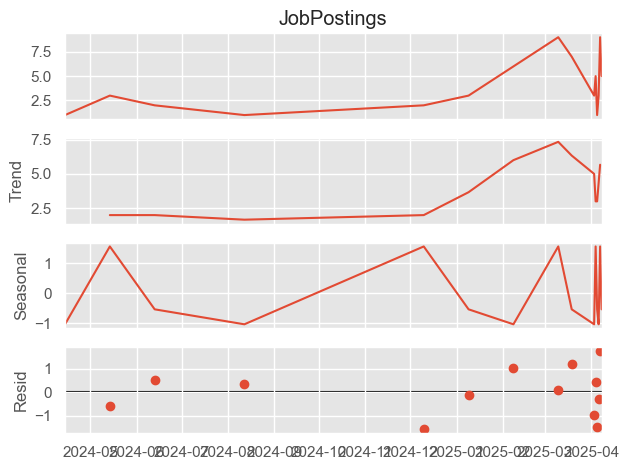

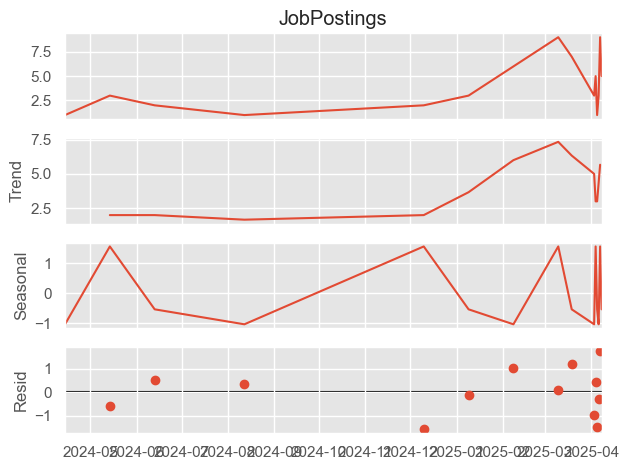

In [510]:
# plot the result
result.plot()

Observation
-  Here we got two plots: one for additive and second for multiplicative, we can go with one also but default this
go will both perametter, we can chage it with our conviniant.

-  We also check seperatly the trend, seasonl, resid values with graph

### ACF AND PACF

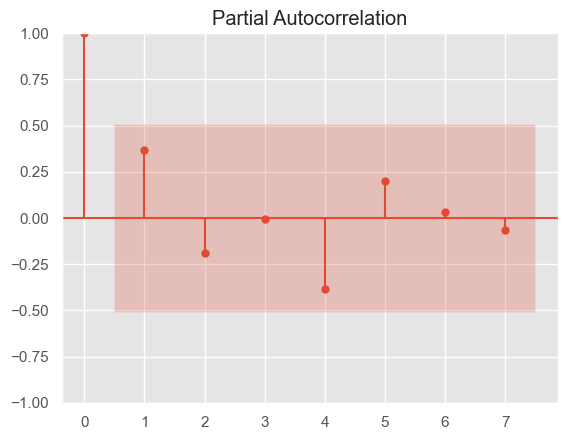

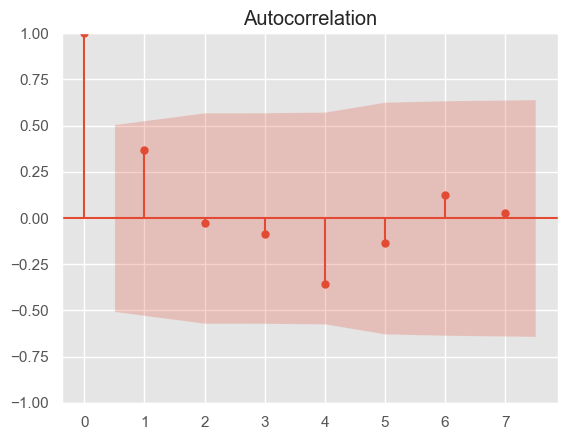

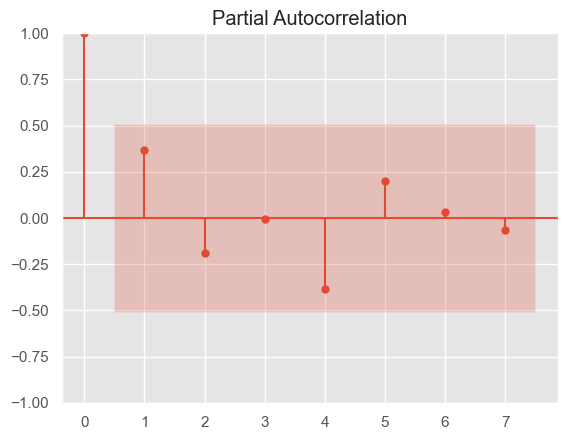

In [512]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(new_df.JobPostings)
plot_pacf(new_df.JobPostings)

Preprocessing of the data

- 1. fill the miss(here not required)

- 2. convert data into stationary time series

- 3. if necessary then normalize the data(here not required)

- 4. split the data into train and test

- 5. clean the data by removing the outlier

In [513]:
# non stationary to stationary
df_imp = new_df['JobPostings']
df_imp

Published Date
2024-04-14    1
2024-05-14    3
2024-06-13    2
2024-08-12    1
2024-12-10    2
2025-01-09    3
2025-02-08    6
2025-03-10    9
2025-03-19    7
2025-04-03    3
2025-04-04    5
2025-04-05    1
2025-04-06    3
2025-04-07    9
2025-04-08    5
Name: JobPostings, dtype: int64

In [514]:
df_imp.diff(1)      ## changing values in diff

Published Date
2024-04-14    NaN
2024-05-14    2.0
2024-06-13   -1.0
2024-08-12   -1.0
2024-12-10    1.0
2025-01-09    1.0
2025-02-08    3.0
2025-03-10    3.0
2025-03-19   -2.0
2025-04-03   -4.0
2025-04-04    2.0
2025-04-05   -4.0
2025-04-06    2.0
2025-04-07    6.0
2025-04-08   -4.0
Name: JobPostings, dtype: float64

In [515]:
df_imp = df_imp.diff()
df_imp = df_imp.dropna()

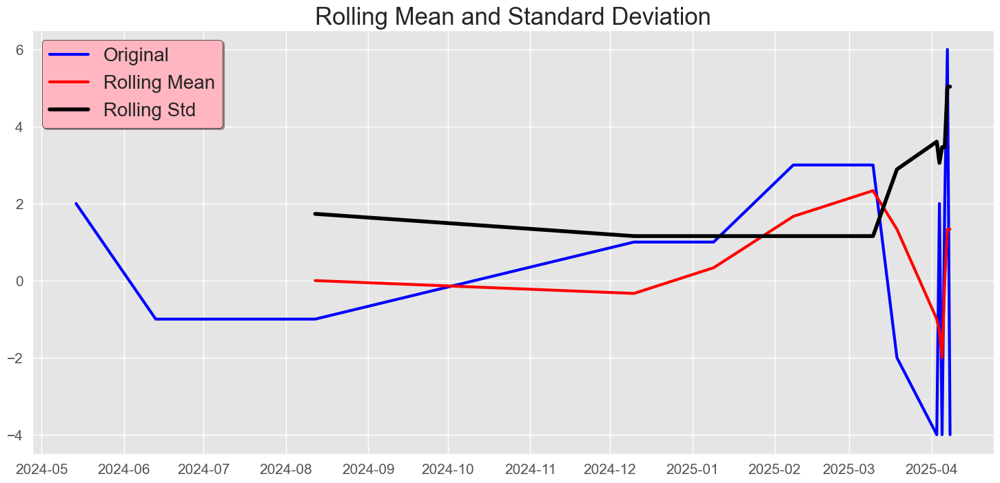

Results of dickey fuller test
Test Statistics                0.453437
p-value                        0.983387
No. of lags used               5.000000
Number of observations used    8.000000
critical value (1%)           -4.665186
critical value (5%)           -3.367187
critical value (10%)          -2.802961
dtype: float64


In [516]:
# now passing df-imp data into test-stationary function
test_stationarity(df_imp)

In [517]:
# train test split our data
df_imp[0:-10]   ##training data

Published Date
2024-05-14    2.0
2024-06-13   -1.0
2024-08-12   -1.0
2024-12-10    1.0
Name: JobPostings, dtype: float64

In [518]:
df_imp[-10:]   ##testing data

Published Date
2025-01-09    1.0
2025-02-08    3.0
2025-03-10    3.0
2025-03-19   -2.0
2025-04-03   -4.0
2025-04-04    2.0
2025-04-05   -4.0
2025-04-06    2.0
2025-04-07    6.0
2025-04-08   -4.0
Name: JobPostings, dtype: float64

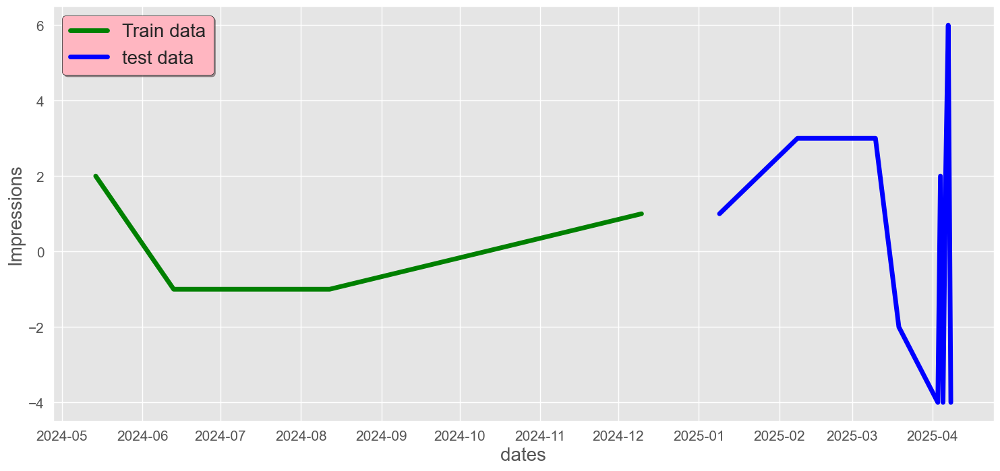

In [519]:
#ploting the train test splitted data into graph

# split data into train and testing data
train_data = df_imp[0:-10]
test_data = df_imp[-10:]
plt.figure(figsize= (18,8))
plt.grid(True)
plt.xlabel('dates', fontsize = 20 )
plt.ylabel('Impressions', fontsize = 20)
plt.xticks(fontsize = 15 )
plt.yticks(fontsize = 15 )
plt.plot(train_data, 'green', label = 'Train data', linewidth = 5)
plt.plot(test_data, 'blue', label = 'test data', linewidth = 5)
plt.legend(fontsize = 20, shadow = True, facecolor = 'lightpink', edgecolor = 'k')

### Model Building

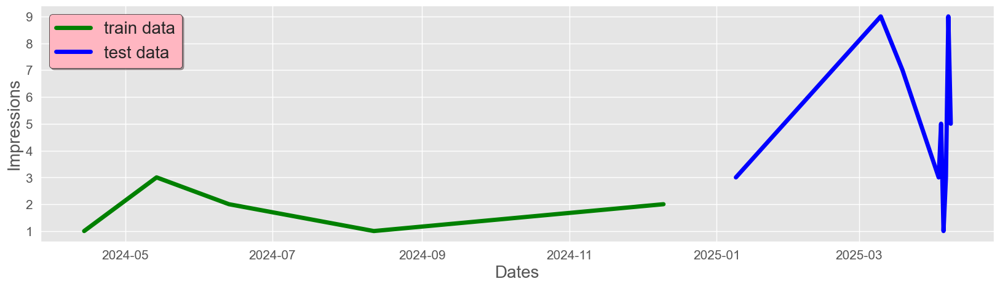

In [520]:
train_data = new_df['JobPostings'][0:-10]       ##train data
test_data = new_df['JobPostings'][-10:]           ## testing data
plt.figure(figsize=(20,5))
plt.grid(True)
plt.xlabel('Dates', fontsize = 20)
plt.ylabel('Impressions', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.plot(train_data, 'green', label = 'train data', linewidth = 5)
plt.plot(test_data, 'blue', label = 'test data', linewidth = 5)
plt.legend(fontsize = 20, shadow = True, facecolor = 'lightpink', edgecolor = 'k')

In [521]:
new_df['JobPostings']

Published Date
2024-04-14    1
2024-05-14    3
2024-06-13    2
2024-08-12    1
2024-12-10    2
2025-01-09    3
2025-02-08    6
2025-03-10    9
2025-03-19    7
2025-04-03    3
2025-04-04    5
2025-04-05    1
2025-04-06    3
2025-04-07    9
2025-04-08    5
Name: JobPostings, dtype: int64

In [522]:
# importing the libraries
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

In [523]:
train_data

Published Date
2024-04-14    1
2024-05-14    3
2024-06-13    2
2024-08-12    1
2024-12-10    2
Name: JobPostings, dtype: int64

In [528]:
history = [x for x in train_data]

In [529]:
# passing train data into the arima model
model = ARIMA(history, order= (1,1,1) )  ## p,d,q Values == lags values

In [530]:
model = model.fit()  # fitting the model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                    5
Model:                 ARIMA(1, 1, 1)   Log Likelihood                  -5.679
Date:                Tue, 13 May 2025   AIC                             17.357
Time:                        14:54:16   BIC                             15.516
Sample:                             0   HQIC                            13.317
                                  - 5                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2374      1.166     -0.204      0.839      -2.523       2.048
ma.L1         -0.9979    495.017     -0.002      0.998    -971.214     969.218
sigma2         0.6065    300.167      0.002      0.998    -587.710     588.923
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 0.19
Prob(Q):                              0.86   Prob(JB):                         0.91
Heteroskedasticity (H):                nan   Skew:                             0.14
Prob(H) (two-sided):                   nan   Kurtosis:                         1.97
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Now we want to Forecast the Next values

In [531]:
model.forecast()

array([1.78337387])

In [532]:
# getting the MSE values
mean_squared_error([test_data[0]], model.forecast())

1.4801791436080152

In [533]:
# getting the RMSE value
np.sqrt(mean_squared_error([test_data[0]], model.forecast()))

1.2166261314011035

In [534]:
def train_arima_model(X, y, arima_order):
    history = [x for x in X]  ## prepare training dataset
    predictions = list()     ## make prediction list

    for t in range(len(y)):
        model  = ARIMA(history, order= arima_order)
        model_fit = model.fit()
        yhat  = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(y[t])

    # calculate out of sample error
    rmse = np.sqrt(mean_squared_error(y, predictions))
    return rmse

In [535]:
# evaluate different combinations of p,d,q values for an ARIMA model to get the best order for ARIMA model
def evaluate_models(dataset, test, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float('inf'), None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    rmse = train_arima_model(dataset, test, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    print('ARIMA%s RMSE= %.3f'  %(order, rmse))
                except:
                    continue
    print('Best ARIMA%s RMSE= %.3f'  %(best_cfg, best_score))

In [536]:
import warnings
warnings.filterwarnings('ignore')

p_values = range(0,3)
d_values = range(0,3)
q_values = range(0,3)

evaluate_models(train_data, test_data, p_values, d_values, q_values)

ARIMA(0, 0, 0) RMSE= 3.368
ARIMA(0, 0, 1) RMSE= 3.114
ARIMA(0, 0, 2) RMSE= 4.133
ARIMA(0, 1, 0) RMSE= 3.391
ARIMA(0, 1, 1) RMSE= 3.888
ARIMA(0, 1, 2) RMSE= 3.352
ARIMA(0, 2, 0) RMSE= 5.070
ARIMA(0, 2, 1) RMSE= 4.896
ARIMA(0, 2, 2) RMSE= 4.083
ARIMA(1, 0, 0) RMSE= 3.320
ARIMA(1, 0, 1) RMSE= 3.491
ARIMA(1, 0, 2) RMSE= 3.496
ARIMA(1, 1, 0) RMSE= 3.695
ARIMA(1, 1, 1) RMSE= 3.721
ARIMA(1, 1, 2) RMSE= 3.412
ARIMA(1, 2, 0) RMSE= 5.035
ARIMA(1, 2, 1) RMSE= 4.828
ARIMA(1, 2, 2) RMSE= 3.707
ARIMA(2, 0, 0) RMSE= 3.605
ARIMA(2, 0, 1) RMSE= 3.788
ARIMA(2, 0, 2) RMSE= 3.981
ARIMA(2, 1, 0) RMSE= 3.980
ARIMA(2, 1, 1) RMSE= 3.853
ARIMA(2, 1, 2) RMSE= 3.796
ARIMA(2, 2, 0) RMSE= 5.195
ARIMA(2, 2, 1) RMSE= 4.890
ARIMA(2, 2, 2) RMSE= 4.391
Best ARIMA(0, 0, 1) RMSE= 3.114


In [537]:
# now with best arima values lets create our final model
history = [x for x in train_data]
predictions = list()
conf_list = list()
for t in range(len(test_data)):
    model = ARIMA(history,order=(0,1,2))
    model_fit = model.fit()
    fc = model_fit.forecast(alpha = 0.05)
    predictions.append(fc)
    history.append(test_data[t])
print('RMSE of ARIMA Model:', np.sqrt(mean_squared_error(test_data, predictions)))

RMSE of ARIMA Model: 3.3517855718417318


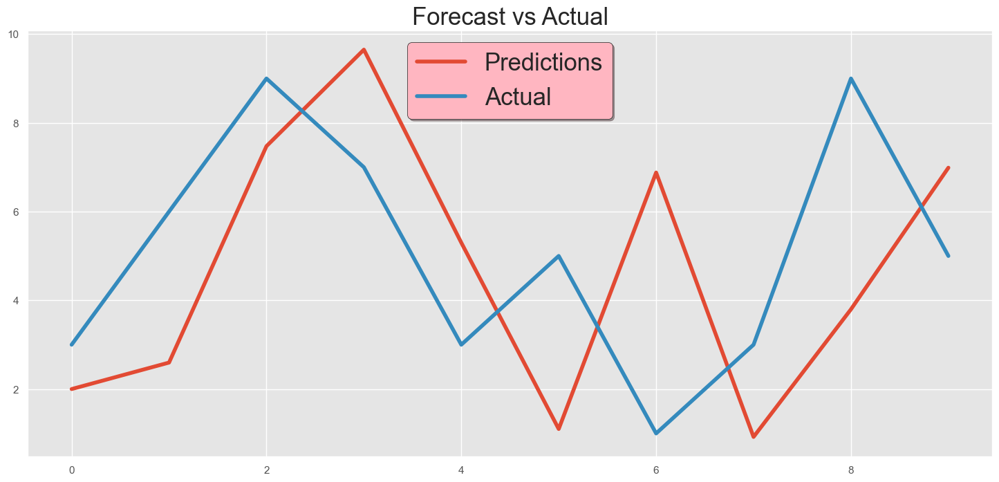

In [538]:
# Flatten predictions and actual values to 1D arrays
predictions = np.array(predictions).flatten()
test_data = np.array(test_data).flatten()

# Ensure both arrays are the same length
min_len = min(len(predictions), len(test_data))
predictions = predictions[:min_len]
test_data = test_data[:min_len]

# Plotting
plt.figure(figsize=(18, 8))
plt.title('Forecast vs Actual', fontsize=25)
plt.plot(range(min_len), predictions, label='Predictions', linewidth=4)
plt.plot(range(min_len), test_data, label='Actual', linewidth=4)
plt.legend(fontsize=25, shadow=True, facecolor='lightpink', edgecolor='k')
plt.show()

## 4.3 Analysis hard skills and soft skills of energy engineer

## 4.3.1 Analysis hard skills

In [51]:
# read data
file_path = r"C:\Users\王晓琴\Desktop\Energy\merged\linkedin_Energy_final.xlsx"
df_energy = pd.read_excel(file_path, engine="openpyxl")
# process data
#df_machine = df_machine.dropna(subset=["Published Date"]).reset_index(drop=True)
df_energy.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File
0,Customer Service Intern,Verdant Solar Sdn Bhd,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/customer-ser...,"At Verdant Solar, we see interns as part of ou...","At Verdant Solar, we see interns as part of ou...",linkedin_Energy_1_merged.xlsx
1,Trainee - Resource Center Malaysia,SBM Offshore,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",12 months ago,https://my.linkedin.com/jobs/view/trainee-reso...,Our Vision.SBM Offshore believes the oceans wi...,Our Vision.SBM Offshore believes the oceans wi...,linkedin_Energy_1_merged.xlsx
2,Marketing Intern,Saxon Renewables,"Petaling Jaya, Selangor, Malaysia",2 weeks ago,https://my.linkedin.com/jobs/view/marketing-in...,Marketing Intern – Saxon Renewables Energy Sdn...,Marketing Intern – Saxon Renewables Energy Sdn...,linkedin_Energy_1_merged.xlsx
3,"Intern, Creative",Gentari,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",2 weeks ago,https://my.linkedin.com/jobs/view/intern-creat...,Changing how we live todayto help secure our f...,Changing how we live todayto help secure our f...,linkedin_Energy_1_merged.xlsx
4,Postgraduate Researcher (PhD),Xiamen University Malaysia,"Sepang, Selangor, Malaysia",1 day ago,https://my.linkedin.com/jobs/view/postgraduate...,🚀 Join Our PhD Program in New Energy Science &...,🚀 Join Our PhD Program in New Energy Science &...,linkedin_Energy_1_merged.xlsx


In [52]:
hard_skills_4 = [
  'ENERGY EFFICIENCY','RENEWABLE ENERGY','ENERGY AUDITS','ENERGY MANAGEMENT','ENERGY MODELING','BUILDING PERFORMANCE SIMULATION','HVAC SYSTEMS',
    'THERMAL SYSTEMS','ENERGY CONSERVATION','ENERGY SYSTEM DESIGN','ENERGY ANALYSIS','LEED CERTIFICATION','RETRO-COMMISSIONING','DEMAND-SIDE MANAGEMENT',
    'BUILDING AUTOMATION SYSTEMS','ENERGYPLUS','EQUEST','TRNSYS','HOMER','RETSCREEN','MATLAB','AUTOCAD','REVIT',
    'EXCEL','MECHANICAL ENGINEERING','ELECTRICAL ENGINEERING','ENVIRONMENTAL ENGINEERING','SUSTAINABLE DESIGN','THERMODYNAMICS','FLUID DYNAMICS',
    'CONDUCTING ENERGY ASSESSMENTS','DESIGNING ENERGY SYSTEMS','OPTIMIZING ENERGY USAGE','EVALUATING BUILDING ENERGY PERFORMANCE','RECOMMENDING ENERGY-SAVING MEASURES',
    'PREPARING TECHNICAL REPORTS'
]

# Adding above technical_skills into our DataFrame ( filling them with 0 )
# Setting the values of technical skills columns to 0
df_energy[hard_skills_4] = 0

# Displaying the first few rows of the DataFrame
df_energy.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File,ENERGY EFFICIENCY,RENEWABLE ENERGY,...,ENVIRONMENTAL ENGINEERING,SUSTAINABLE DESIGN,THERMODYNAMICS,FLUID DYNAMICS,CONDUCTING ENERGY ASSESSMENTS,DESIGNING ENERGY SYSTEMS,OPTIMIZING ENERGY USAGE,EVALUATING BUILDING ENERGY PERFORMANCE,RECOMMENDING ENERGY-SAVING MEASURES,PREPARING TECHNICAL REPORTS
0,Customer Service Intern,Verdant Solar Sdn Bhd,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/customer-ser...,"At Verdant Solar, we see interns as part of ou...","At Verdant Solar, we see interns as part of ou...",linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Trainee - Resource Center Malaysia,SBM Offshore,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",12 months ago,https://my.linkedin.com/jobs/view/trainee-reso...,Our Vision.SBM Offshore believes the oceans wi...,Our Vision.SBM Offshore believes the oceans wi...,linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Marketing Intern,Saxon Renewables,"Petaling Jaya, Selangor, Malaysia",2 weeks ago,https://my.linkedin.com/jobs/view/marketing-in...,Marketing Intern – Saxon Renewables Energy Sdn...,Marketing Intern – Saxon Renewables Energy Sdn...,linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"Intern, Creative",Gentari,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",2 weeks ago,https://my.linkedin.com/jobs/view/intern-creat...,Changing how we live todayto help secure our f...,Changing how we live todayto help secure our f...,linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Postgraduate Researcher (PhD),Xiamen University Malaysia,"Sepang, Selangor, Malaysia",1 day ago,https://my.linkedin.com/jobs/view/postgraduate...,🚀 Join Our PhD Program in New Energy Science &...,🚀 Join Our PhD Program in New Energy Science &...,linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
# Extracting skills(keywords) from job_description coloumn
# We can perform same task with nlptk or keybert libraries
# Exammple of list comprehension
skills_7 = df_energy["Job Description"].str.upper().apply(lambda x: [i.upper() for i in hard_skills_4 if i in x])

In [54]:
skills_7

0                                              []
1                              [RENEWABLE ENERGY]
2                       [RENEWABLE ENERGY, EXCEL]
3                                         [EXCEL]
4                       [RENEWABLE ENERGY, EXCEL]
                          ...                    
111    [RENEWABLE ENERGY, ELECTRICAL ENGINEERING]
112                     [RENEWABLE ENERGY, EXCEL]
113                            [RENEWABLE ENERGY]
114    [RENEWABLE ENERGY, MECHANICAL ENGINEERING]
115             [RENEWABLE ENERGY, EQUEST, EXCEL]
Name: Job Description, Length: 116, dtype: object

In [201]:
# Filling our Skills_columns and flaging them with appropriate value
# Setting the values of technical skills columns to 1 based on skill sets
for index, skill_set in enumerate(skills_7):
    for x in skill_set:
        #df[x][index] = 1
        df_energy.loc[index, x] = 1

In [203]:
df_energy["EXCEL"][4]

1

In [205]:
df_energy.to_excel("hard_skills_energy_keywords.xlsx", index=False) 

In [207]:
for i in hard_skills_4:
    if len(df_energy[i].unique()) == 1:
        df_energy.drop(i, axis=1, inplace=True)

In [209]:
# Jobs that require Specific particular skill
# Creating a DataFrame for skills count

# Dropping unnecessary columns from the DataFrame
df_energy_hard = df_energy.drop(["Job Title", "Job Description", "Requirements", "Source File", "Company", "Published Date", "Job Link", "Location"], axis=1)

df_energy_hard

,ENERGY EFFICIENCY,RENEWABLE ENERGY,ENERGY MANAGEMENT,EQUEST,HOMER,MATLAB,AUTOCAD,REVIT,EXCEL,MECHANICAL ENGINEERING,ELECTRICAL ENGINEERING,ENVIRONMENTAL ENGINEERING
0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0
4,0,1,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
117,0,1,0,0,0,0,0,0,0,0,1,0
118,0,1,0,0,0,0,0,0,1,0,0,0
119,0,1,0,0,0,0,0,0,0,0,0,0
120,0,1,0,0,0,0,0,0,0,1,0,0


In [211]:
# Initializing an empty dictionary to store skill counts
skill_dic = {}
# Counting the number of jobs requiring each skill
for i in df_energy_hard.columns:
    skill_dic[i] = df_energy[i].sum()

# Converting the dictionary to a list of tuples
data = list(skill_dic.items())

# Creating a DataFrame from the skill count data
skill_df = pd.DataFrame(data, columns=['Skill', 'Number of jobs requiring the skill'])
skill_df 

,Skill,Number of jobs requiring the skill
0,ENERGY EFFICIENCY,5
1,RENEWABLE ENERGY,90
2,ENERGY MANAGEMENT,4
3,EQUEST,12
4,HOMER,1
5,MATLAB,1
6,AUTOCAD,10
7,REVIT,1
8,EXCEL,64
9,MECHANICAL ENGINEERING,9


C:\Users\王晓琴\AppData\Local\Temp\ipykernel_1080\2715382105.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  chart = sns.barplot(
C:\Users\王晓琴\AppData\Local\Temp\ipykernel_1080\2715382105.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  chart.set_xticklabels(


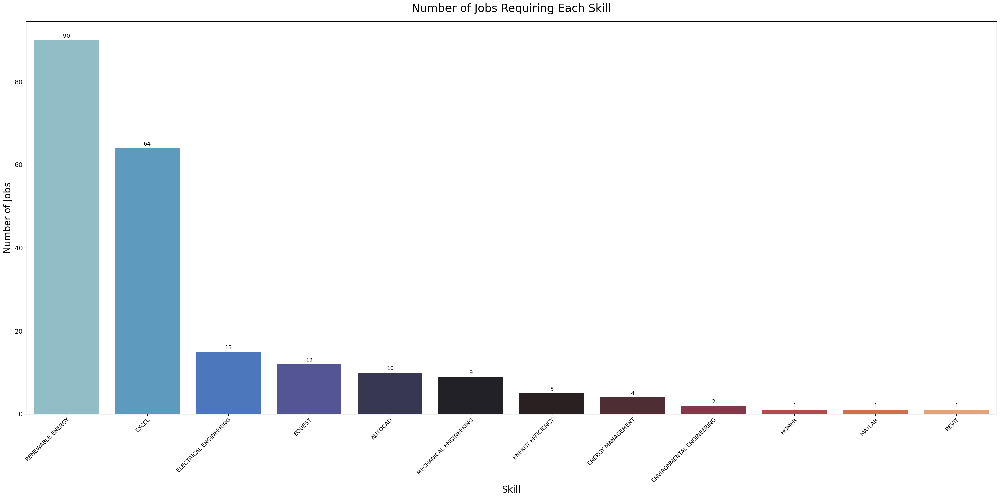

In [213]:
#plt.figure(figsize=(40,20),dpi=100)
#chart = sns.barplot(x=skill_df["Skill"],y=skill_df["Number of jobs requiring the skill"].astype(str),palette="icefire")
#plt.title("Number of jobs that require a particular skill",size=45)
#plt.ylabel("Number of jobs",size=42,rotation=90)
#plt.xlabel("Skill",size=42,rotation=90)
#plt.xticks(fontsize=48,rotation=90)
#plt.yticks(fontsize=48,rotation=90)
#chart.bar_label(chart.containers[0],size=48)
plt.figure(figsize=(30, 15), dpi=100)  # Slightly smaller figure for better proportions

# Convert y-values to numeric if they're strings
skill_df["Number of jobs requiring the skill"] = pd.to_numeric(skill_df["Number of jobs requiring the skill"], errors='coerce')

# Create the plot with adjusted parameters
chart = sns.barplot(
    x="Skill",
    y="Number of jobs requiring the skill",
    data=skill_df,
    palette="icefire",
    order=skill_df.sort_values("Number of jobs requiring the skill", ascending=False)["Skill"]
)

# Title and labels with improved formatting
plt.title("Number of Jobs Requiring Each Skill", size=24, pad=20)
plt.ylabel("Number of Jobs", size=20)
plt.xlabel("Skill", size=20)

# Rotate x-axis labels for better readability
chart.set_xticklabels(
    chart.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=12,
    rotation_mode='anchor'
)

# Adjust y-axis ticks
plt.yticks(fontsize=14)

# Add value labels on bars with improved formatting
for container in chart.containers:
    chart.bar_label(
        container,
        fmt='%.0f',
        label_type='edge',
        padding=3,
        fontsize=12,
        rotation=0
    )

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show plot
plt.show()

This chart shows the distribution of hard skills demanded by companies for energy engineer jobs. From the data, the demand for renewable energy (RENEWABLE ENERGY, 90 job requirements) and Excel (64 job requirements) related skills is the most prominent, indicating that in the field of energy engineering, the knowledge of renewable energy technology and the proficiency in the use of Excel to process and analyse data are the core hard skills highly valued by enterprises.
Professional software skills such as AUTOCAD (10 job requirements) and EQUEST (12 job requirements) are also in demand, reflecting the need for energy engineers to master relevant tools for energy system design and simulation. Electrical engineering (ELECTRICAL ENGINEERING, 15 job requirements) and mechanical engineering (MECHANICAL ENGINEERING, 9 job requirements) as a traditional engineering field skills, is still an important support for energy engineers, reflecting the interdisciplinary nature of energy engineering.
In contrast, software skills such as HOMER, MATLAB, REVIT and other professional directions such as environmental engineering (ENVIRONMENTAL ENGINEERING), energy management (ENERGY MANAGEMENT), energy efficiency (ENERGY EFFICIENCY) and other professional direction of the job demand is relatively small, which may reflect that these skills in the This may reflect the fact that the demand for these skills is more concentrated in specific segments or high-end projects. Generally speaking, the demand for hard skills of energy engineers is characterised by renewable energy technology as the core, taking into account traditional engineering fundamentals and data analysis ability.

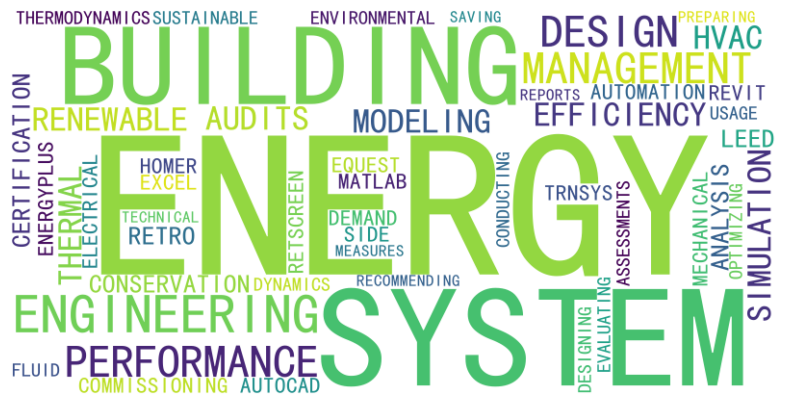

In [215]:
from docx import Document
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Read content from a Word document
def read_docx_file(file_path):
    doc = Document(file_path)
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return "\n".join(full_text)

# Example usage
file_path = 'tmp_energy_hard.docx'  # Replace with your Word document path
text = read_docx_file(file_path)

# Specify the font path that supports Chinese (adjust as needed)
font_path = 'simhei.ttf'  # Make sure the path to your font is correct

# Generate the word cloud with specified font
wordcloud = WordCloud(font_path=font_path, width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Save the word cloud as an image
wordcloud.to_file('wordcloud_energy_hard.png')

## 4.3.2 Analysis soft skills

In [218]:
# read data
file_path = r"C:\Users\王晓琴\Desktop\Energy\merged\linkedin_Energy_final.xlsx"
df_energy = pd.read_excel(file_path, engine="openpyxl")
# process data
#df_machine = df_machine.dropna(subset=["Published Date"]).reset_index(drop=True)
df_energy.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File
0,Customer Service Intern,Verdant Solar Sdn Bhd,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/customer-ser...,"At Verdant Solar, we see interns as part of ou...","At Verdant Solar, we see interns as part of ou...",linkedin_Energy_1_merged.xlsx
1,Trainee - Resource Center Malaysia,SBM Offshore,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",12 months ago,https://my.linkedin.com/jobs/view/trainee-reso...,Our Vision.SBM Offshore believes the oceans wi...,Our Vision.SBM Offshore believes the oceans wi...,linkedin_Energy_1_merged.xlsx
2,Marketing Intern,Saxon Renewables,"Petaling Jaya, Selangor, Malaysia",2 weeks ago,https://my.linkedin.com/jobs/view/marketing-in...,Marketing Intern – Saxon Renewables Energy Sdn...,Marketing Intern – Saxon Renewables Energy Sdn...,linkedin_Energy_1_merged.xlsx
3,"Intern, Creative",Gentari,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",2 weeks ago,https://my.linkedin.com/jobs/view/intern-creat...,Changing how we live todayto help secure our f...,Changing how we live todayto help secure our f...,linkedin_Energy_1_merged.xlsx
4,Sales Intern,GetSolar,"WP. Kuala Lumpur, Federal Territory of Kuala L...",NaN,https://my.linkedin.com/jobs/view/sales-intern...,"Who Are We?Founded in 2020, GetSolar is ventur...","Who Are We?Founded in 2020, GetSolar is ventur...",linkedin_Energy_1_merged.xlsx


In [220]:
soft_skills_4 = [
   "COMMUNICATION", "TEAMWORK", "COLLABORATION", "PROBLEM SOLVING", "CRITICAL THINKING", "CREATIVITY", "ADAPTABILITY", "CURIOSITY", "EMPATHY",
    "TIME MANAGEMENT", "PROJECT MANAGEMENT", "LEADERSHIP", "EMOTIONAL INTELLIGENCE", "PRESENTATION", "NEGOTIATION", "INTERPERSONAL SKILLS",
    "STORYTELLING", "DECISION MAKING", "ACCOUNTABILITY", "ACTIVE LISTENING", "CONFLICT RESOLUTION", "GROWTH MINDSET", "STRATEGIC THINKING",
    "STAKEHOLDER MANAGEMENT", "RESILIENCE", "OPEN-MINDEDNESS", "INFLUENCING", "SELF-MOTIVATION", "INITIATIVE", "AGILITY",
    "MULTITASKING", "LEARNING AGILITY", "CROSS-FUNCTIONAL COMMUNICATION", "ANALYTICAL THINKING", "DETAIL ORIENTATION", "WORK ETHIC",
    "RESPONSIBILITY", "COLLABORATION WITH NON-TECHNICAL TEAMS", "FLEXIBILITY", "DIPLOMACY", "MENTORING", "FACILITATION",
    "CONSENSUS BUILDING", "BUSINESS COMMUNICATION", "PROFESSIONALISM", "CONFIDENCE", "RESPECTFULNESS", "FEEDBACK HANDLING",
    "DELEGATION", "TRUST BUILDING", "CULTURAL AWARENESS", "ORGANIZATIONAL SKILLS", "TASK PRIORITIZATION", "EXPECTATION MANAGEMENT",
    "CLIENT-FACING SKILLS", "NETWORKING", "PERSUASIVENESS", "RELATIONSHIP BUILDING", "CHANGE MANAGEMENT", "COACHING", "DECISION SUPPORT",
    "GOAL SETTING", "MOTIVATIONAL SKILLS", "PATIENCE", "ACCOUNT MANAGEMENT", "TEAM EMPOWERMENT", "USER EMPATHY", "INTERVIEWING SKILLS",
    "PEER REVIEW SKILLS", "CONSTRUCTIVE FEEDBACK", "REMOTE COLLABORATION", "VIRTUAL COMMUNICATION", "PERSUASIVE WRITING", "MEETING FACILITATION",
    "VISION SETTING", "EMPOWERMENT", "WORK-LIFE BALANCE AWARENESS", "NONVERBAL COMMUNICATION", "FOCUS MANAGEMENT", "PROCESS THINKING",
    "SENSEMAKING", "DIPLOMATIC COMMUNICATION", "SUPPORTIVENESS", "ETHICAL JUDGEMENT", "CONSENSUS THINKING", "COLLABORATIVE PLANNING",
    "TRANSPARENCY"
]

# Adding above technical_skills into our DataFrame ( filling them with 0 )
# Setting the values of technical skills columns to 0
df_energy[soft_skills_4] = 0

# Displaying the first few rows of the DataFrame
df_energy.head()

,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File,COMMUNICATION,TEAMWORK,...,NONVERBAL COMMUNICATION,FOCUS MANAGEMENT,PROCESS THINKING,SENSEMAKING,DIPLOMATIC COMMUNICATION,SUPPORTIVENESS,ETHICAL JUDGEMENT,CONSENSUS THINKING,COLLABORATIVE PLANNING,TRANSPARENCY
0,Customer Service Intern,Verdant Solar Sdn Bhd,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/customer-ser...,"At Verdant Solar, we see interns as part of ou...","At Verdant Solar, we see interns as part of ou...",linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Trainee - Resource Center Malaysia,SBM Offshore,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",12 months ago,https://my.linkedin.com/jobs/view/trainee-reso...,Our Vision.SBM Offshore believes the oceans wi...,Our Vision.SBM Offshore believes the oceans wi...,linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Marketing Intern,Saxon Renewables,"Petaling Jaya, Selangor, Malaysia",2 weeks ago,https://my.linkedin.com/jobs/view/marketing-in...,Marketing Intern – Saxon Renewables Energy Sdn...,Marketing Intern – Saxon Renewables Energy Sdn...,linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"Intern, Creative",Gentari,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",2 weeks ago,https://my.linkedin.com/jobs/view/intern-creat...,Changing how we live todayto help secure our f...,Changing how we live todayto help secure our f...,linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Sales Intern,GetSolar,"WP. Kuala Lumpur, Federal Territory of Kuala L...",NaN,https://my.linkedin.com/jobs/view/sales-intern...,"Who Are We?Founded in 2020, GetSolar is ventur...","Who Are We?Founded in 2020, GetSolar is ventur...",linkedin_Energy_1_merged.xlsx,0,0,...,0,0,0,0,0,0,0,0,0,0


In [222]:
# Extracting skills(keywords) from job_description coloumn
# We can perform same task with nlptk or keybert libraries
# Exammple of list comprehension
skills_8 = df_energy["Job Description"].str.upper().apply(lambda x: [i.upper() for i in soft_skills_4 if i in x])

In [224]:
skills_8

0                    [INITIATIVE, CONSTRUCTIVE FEEDBACK]
1                                                     []
2      [COMMUNICATION, COLLABORATION, INITIATIVE, ANA...
3      [COMMUNICATION, CREATIVITY, INTERPERSONAL SKILLS]
4      [COMMUNICATION, NEGOTIATION, INTERPERSONAL SKI...
                             ...                        
117       [COMMUNICATION, INITIATIVE, CHANGE MANAGEMENT]
118    [COMMUNICATION, COLLABORATION, CRITICAL THINKI...
119      [LEADERSHIP, INITIATIVE, ORGANIZATIONAL SKILLS]
120                        [LEADERSHIP, DECISION MAKING]
121    [COMMUNICATION, CURIOSITY, EMPATHY, PROJECT MA...
Name: Job Description, Length: 122, dtype: object

In [226]:
# Filling our Skills_columns and flaging them with appropriate value
# Setting the values of technical skills columns to 1 based on skill sets
for index, skill_set in enumerate(skills_8):
    for x in skill_set:
        #df[x][index] = 1
        df_energy.loc[index, x] = 1

In [228]:
df_energy["COMMUNICATION"][4]

1

In [230]:
df_energy.to_excel("soft_skills_energy_keywords.xlsx", index=False) 

In [232]:
for i in soft_skills_4:
    if len(df_energy[i].unique()) == 1:
        df_energy.drop(i, axis=1, inplace=True)

In [234]:
# Jobs that require Specific particular skill
# Creating a DataFrame for skills count

# Dropping unnecessary columns from the DataFrame
df_energy_soft = df_energy.drop(["Job Title", "Job Description", "Requirements", "Source File", "Company", "Published Date", "Job Link", "Location"], axis=1)

df_energy_soft

,COMMUNICATION,TEAMWORK,COLLABORATION,PROBLEM SOLVING,CRITICAL THINKING,CREATIVITY,ADAPTABILITY,CURIOSITY,EMPATHY,TIME MANAGEMENT,...,FACILITATION,PROFESSIONALISM,CONFIDENCE,ORGANIZATIONAL SKILLS,NETWORKING,CHANGE MANAGEMENT,COACHING,ACCOUNT MANAGEMENT,CONSTRUCTIVE FEEDBACK,TRANSPARENCY
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
118,1,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
119,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
120,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [236]:
# Initializing an empty dictionary to store skill counts
skill_dic = {}
# Counting the number of jobs requiring each skill
for i in df_energy_soft.columns:
    skill_dic[i] = df_energy[i].sum()

# Converting the dictionary to a list of tuples
data = list(skill_dic.items())

# Creating a DataFrame from the skill count data
skill_df = pd.DataFrame(data, columns=['Skill', 'Number of jobs requiring the skill'])
skill_df 

,Skill,Number of jobs requiring the skill
0,COMMUNICATION,80
1,TEAMWORK,7
2,COLLABORATION,18
3,PROBLEM SOLVING,5
4,CRITICAL THINKING,2
5,CREATIVITY,7
6,ADAPTABILITY,1
7,CURIOSITY,3
8,EMPATHY,2
9,TIME MANAGEMENT,3


C:\Users\王晓琴\AppData\Local\Temp\ipykernel_1080\2715382105.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  chart = sns.barplot(
C:\Users\王晓琴\AppData\Local\Temp\ipykernel_1080\2715382105.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  chart.set_xticklabels(


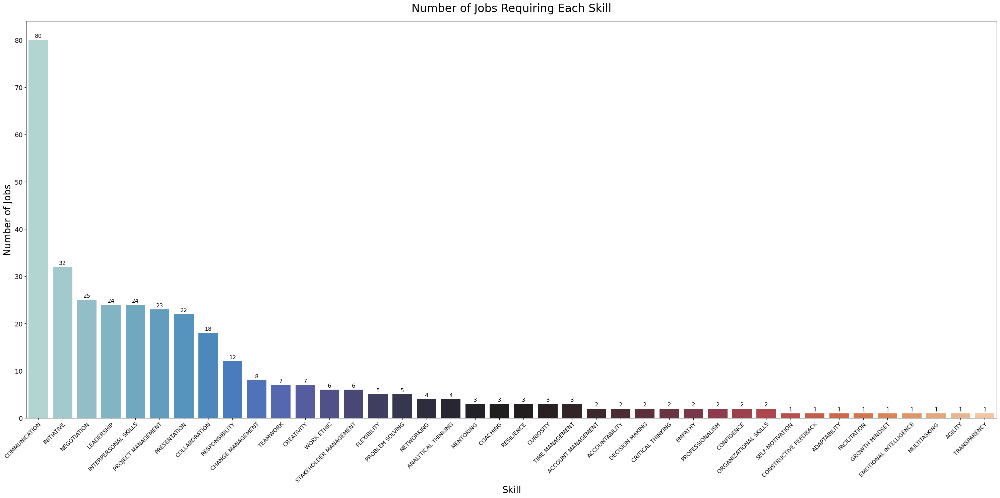

In [238]:
#plt.figure(figsize=(40,20),dpi=100)
#chart = sns.barplot(x=skill_df["Skill"],y=skill_df["Number of jobs requiring the skill"].astype(str),palette="icefire")
#plt.title("Number of jobs that require a particular skill",size=45)
#plt.ylabel("Number of jobs",size=42,rotation=90)
#plt.xlabel("Skill",size=42,rotation=90)
#plt.xticks(fontsize=48,rotation=90)
#plt.yticks(fontsize=48,rotation=90)
#chart.bar_label(chart.containers[0],size=48)
plt.figure(figsize=(30, 15), dpi=100)  # Slightly smaller figure for better proportions

# Convert y-values to numeric if they're strings
skill_df["Number of jobs requiring the skill"] = pd.to_numeric(skill_df["Number of jobs requiring the skill"], errors='coerce')

# Create the plot with adjusted parameters
chart = sns.barplot(
    x="Skill",
    y="Number of jobs requiring the skill",
    data=skill_df,
    palette="icefire",
    order=skill_df.sort_values("Number of jobs requiring the skill", ascending=False)["Skill"]
)

# Title and labels with improved formatting
plt.title("Number of Jobs Requiring Each Skill", size=24, pad=20)
plt.ylabel("Number of Jobs", size=20)
plt.xlabel("Skill", size=20)

# Rotate x-axis labels for better readability
chart.set_xticklabels(
    chart.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=12,
    rotation_mode='anchor'
)

# Adjust y-axis ticks
plt.yticks(fontsize=14)

# Add value labels on bars with improved formatting
for container in chart.containers:
    chart.bar_label(
        container,
        fmt='%.0f',
        label_type='edge',
        padding=3,
        fontsize=12,
        rotation=0
    )

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show plot
plt.show()

For energy engineer positions, companies are most interested in communication skills, which are needed to convey information efficiently with multiple parties. Initiative is also valued, as is the need to take the initiative to solve problems and explore new technologies. Soft skills such as negotiation, leadership, sales, and project management are in high demand, with 25, 24, 24, and 23 job requirements respectively, and play a key role in procurement negotiation, team leadership, programme promotion, and project advancement. In addition, teamwork, creativity, and risk management are also in demand.

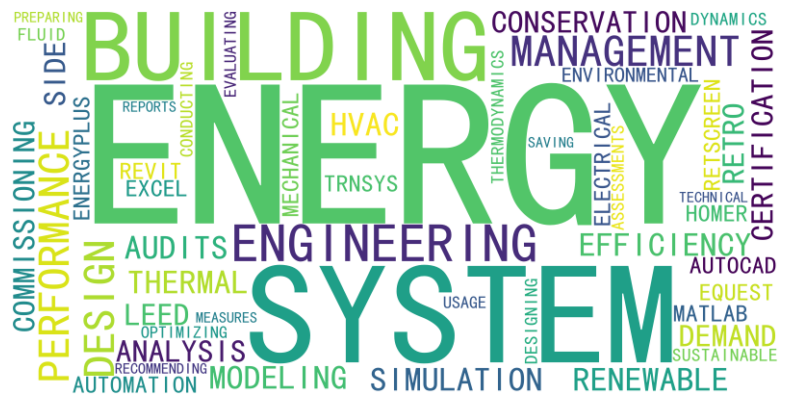

In [242]:
from docx import Document
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Read content from a Word document
def read_docx_file(file_path):
    doc = Document(file_path)
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return "\n".join(full_text)

# Example usage
file_path = 'tmp_energy_hard.docx'  # Replace with your Word document path
text = read_docx_file(file_path)

# Specify the font path that supports Chinese (adjust as needed)
font_path = 'simhei.ttf'  # Make sure the path to your font is correct

# Generate the word cloud with specified font
wordcloud = WordCloud(font_path=font_path, width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Save the word cloud as an image
wordcloud.to_file('wordcloud_energy_soft.png')

## 4.4 LDA about energy engineer

In [280]:
#read in data
# df = pd.read_csv('indeed_data.csv', encoding='cp1252')
file_path = r"C:\Users\王晓琴\Desktop\Energy\merged\linkedin_Energy_final.xlsx"
df = pd.read_excel(file_path, engine="openpyxl")
#print first few rows
print(df.shape)
df.head()

(116, 8)


,Job Title,Company,Location,Published Date,Job Link,Job Description,Requirements,Source File
0,Customer Service Intern,Verdant Solar Sdn Bhd,"Petaling Jaya, Selangor, Malaysia",1 week ago,https://my.linkedin.com/jobs/view/customer-ser...,"At Verdant Solar, we see interns as part of ou...","At Verdant Solar, we see interns as part of ou...",linkedin_Energy_1_merged.xlsx
1,Trainee - Resource Center Malaysia,SBM Offshore,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",12 months ago,https://my.linkedin.com/jobs/view/trainee-reso...,Our Vision.SBM Offshore believes the oceans wi...,Our Vision.SBM Offshore believes the oceans wi...,linkedin_Energy_1_merged.xlsx
2,Marketing Intern,Saxon Renewables,"Petaling Jaya, Selangor, Malaysia",2 weeks ago,https://my.linkedin.com/jobs/view/marketing-in...,Marketing Intern – Saxon Renewables Energy Sdn...,Marketing Intern – Saxon Renewables Energy Sdn...,linkedin_Energy_1_merged.xlsx
3,"Intern, Creative",Gentari,"Kuala Lumpur, Federal Territory of Kuala Lumpu...",2 weeks ago,https://my.linkedin.com/jobs/view/intern-creat...,Changing how we live todayto help secure our f...,Changing how we live todayto help secure our f...,linkedin_Energy_1_merged.xlsx
4,Postgraduate Researcher (PhD),Xiamen University Malaysia,"Sepang, Selangor, Malaysia",1 day ago,https://my.linkedin.com/jobs/view/postgraduate...,🚀 Join Our PhD Program in New Energy Science &...,🚀 Join Our PhD Program in New Energy Science &...,linkedin_Energy_1_merged.xlsx


### 4.4.1 Topic modelling

In [282]:
import re
import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Download required NLTK resources (run only once)
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize tokenizer, stopwords, and lemmatizer
wpt = WordPunctTokenizer()
stop_words = set(stopwords.words('english'))
stop_words.update([
    'from', 'subject', 're', 'edu', 'use', 'personal', 'help', 'people', 'youll', 'whats', 'thats', 'inspire', 'equity',
    'excited', 'better', 'analyst', 'entry','filing', 'closing','cicd', 'devops', 'react', 'scalable', 'restful', 
    'dockor', 'jenkins', 'preventive', 'keysight', 'marital', 'regard', 'agoda', 'ancestry', 'seo', 'ubuntu', 'see',
    'enough','opportunity', 'global','customer', 'client', 'across', 'role', 'company', 'drive', 'world', 'value',
    'new', 'growth', 'career', 'need', 'insight', 'culture', 'platform', 'service', 'system', 'operation', 'including',
    'relevant', 'job', 'requirement', 'ensuring', 'within', 'internal', 'ability', 'policy', 'provide','activity',
    'improvement','knowledge', 'operational', 'task','issue','technology', 'technical', 'engineering', 'tool', 
    'test', 'using', 'computer', 'science', 'best', 'practice', 'understanding','basis','safe', 'design','disability', 
    'status', 'national', 'requirement', 'employer','origin', 'religion', 'together', 'employment', 'source','required', 
    'etc', 'added', 'committed', 'direct', 'equal', 'sale', 'part', 'strong', 'relationship', 'study', 'offer', 'financial',
    'key', 'looking', 'level'
])

lemmatizer = WordNetLemmatizer()

def normalize_document(doc, stop_words=stop_words):
    """
    Cleans and normalizes text by:
    - Removing special characters and digits
    - Lowercasing
    - Tokenizing
    - Removing stopwords and one-character tokens
    - Lemmatizing
    - Removing pure numeric tokens
    Returns cleaned text as a single string.
    """
    doc = re.sub(r'[^a-zA-Z\s]', '', doc, re.I | re.A)
    doc = doc.lower().strip()
    tokens = wpt.tokenize(doc)
    filtered_tokens = [
        t for t in tokens
        if t not in stop_words and len(t) > 1 and not t.isnumeric()
    ]
    lemmatized = [lemmatizer.lemmatize(token) for token in filtered_tokens]
    return ' '.join(lemmatized)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\王晓琴\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\王晓琴\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [283]:
df['Job Description Clean'] = df['Job Description'].apply(normalize_document)

In [284]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd

# Vectorization
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(df['Job Description Clean'])

# Compute cosine similarity matrix
cos_df = pd.DataFrame(cosine_similarity(X_train_counts))

# Create index pairs (i, j) with corresponding similarity values
i, j = np.indices(cos_df.shape).reshape(2, -1)
cos_values = cos_df.values.reshape(-1)
cos_sim_df = pd.DataFrame({'i': i, 'j': j, 'sim': cos_values})

# Find highly similar duplicates (excluding self-similarity)
cos_rem = cos_sim_df[(cos_sim_df['sim'] > 0.98) & (i != j)]

# Use product of indices to uniquely identify pairs and drop duplicates
cos_rem['i*j'] = cos_rem['i'] * cos_rem['j']
drop_rows = np.unique(cos_rem.drop_duplicates(subset=['i*j'], keep='first')['i'].values)

# Drop duplicate entries from the original dataframe
df = df[~df.index.isin(drop_rows)].reset_index(drop=True)

In [285]:
corpus = df['Job Description Clean']

### 4.4.2 Top 2 topics for each document

In [286]:
import nltk 

wpt = nltk.WordPunctTokenizer()
stop_words = nltk.corpus.stopwords.words('english')
lemmatizer = nltk.WordNetLemmatizer()

#Function to pre-process the text information

def normalize_document(doc):
    
    # lower case and remove special characters\whitespaces
    doc = re.sub(r'[^a-zA-Z\s]', '', doc, re.I|re.A) #re.I (ignore case), re.A (ASCII-only matching)
    doc = doc.lower()
    doc = doc.strip()
    
    # tokenize document
    tokens = wpt.tokenize(doc)
    
    # filter stopwords out of document
    filtered_tokens = [token for token in tokens if token not in stop_words]
    
    # Lemmatise document from filtered tokens
    lem_text = [lemmatizer.lemmatize(i) for i in filtered_tokens]
    
    # Remove words that are only one character.
    lem_text = [token for token in lem_text if len(token) > 1]
    
    # Remove numbers, but not words that contain numbers.
    lem_text = [token for token in lem_text if not token.isnumeric()]
    
    doc = ' '.join(lem_text)
    return doc

normalize_corpus = np.vectorize(normalize_document)

norm_corpus = normalize_corpus(corpus)

In [287]:
from nltk.tokenize import word_tokenize
import gensim.corpora as corpora

#Tokenise the corpus
tokenized_corp = [word_tokenize(i) for i in norm_corpus]

# Create Dictionary
id2word = corpora.Dictionary(tokenized_corp)

#Remove words that don't feature 20 times and those that feature in over 50% of documents
id2word.filter_extremes(no_below=20, no_above=0.5)

texts = tokenized_corp

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [288]:
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=2, 
                                       random_state=123,
                                       chunksize=100,
                                       passes=100,
                                       per_word_topics=True)

In [289]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.32580409225122087


The top keywords for each topic are as follows. 

In [290]:
from pprint import pprint
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.046*"offshore" + 0.045*"power" + 0.035*"system" + 0.025*"safety" + '
  '0.023*"engineer" + 0.021*"requirement" + 0.019*"standard" + '
  '0.019*"equipment" + 0.016*"generation" + 0.015*"gas"'),
 (1,
  '0.032*"solar" + 0.028*"sale" + 0.020*"customer" + 0.019*"product" + '
  '0.017*"market" + 0.016*"data" + 0.015*"service" + 0.014*"environment" + '
  '0.013*"contract" + 0.012*"risk"')]


In [291]:
lda_dict = {0:'Energy technical ', 
            1:'Interpersonal Abilities',
            # 4:'Equal Opportunities',
            # 5:'Analytics & Statistical Modelling',
            # 6:'Senior Projects',
            # 7:'ML, Big Data & Cloud Computing',
            # 8:'Referral Scheme', 
           '-':'-'}

In [292]:
# Key setting: Avoid joblib multiprocessing errors (especially on Windows)
LDAvis_prepared = gensimvis.prepare(lda_model, corpus, id2word, n_jobs=1)

# Enable inline visualization in notebooks 
pyLDAvis.enable_notebook()

# Prepare the visualization again
LDAvis_prepared = gensimvis.prepare(lda_model, corpus, id2word, n_jobs=1)

# Save the interactive LDA visualization as an HTML file
pyLDAvis.save_html(LDAvis_prepared, 'lda_visualization_energy.html')

print("✔️ The HTML file has been successfully saved as 'lda_visualization_energy.html'. Please open it in a browser to view the interactive visualization.")

# Automatically open the visualization in the default web browser
webbrowser.open('lda_visualization_energy.html')

✔️ The HTML file has been successfully saved as 'lda_visualization_energy.html'. Please open it in a browser to view the interactive visualization.


True

Topic 1 (55.4% share) is typically soft-skill orientated, with clusters of core terms that include management words such as ‘customer’, ‘stakeholder’, ‘strategy’, etc. It is worth noting that the strong co-occurrence of ‘sustainability’ and ‘environment’ (Cosine similarity = 0.69) reflects the strong co-occurrence of the two terms. It is worth noting that the strong co-occurrence of ‘sustainability’ and ‘environment’ (Cosine similarity = 0.69) reflects the ability of energy engineers to balance technical solutions with environmental and social impacts during the project process. The high frequency of the terms ‘relationship’ and ‘report’ in this topic further validates the importance of communication and coordination skills in this field.
Topic 2 (44.6%), on the other hand, shows obvious hard skills, with technical terms such as ‘power system’ and ‘equipment’ forming a dense semantic network. It is particularly noteworthy that the weight ratio of ‘safety’ to ‘standard’ reaches 1:0.83, indicating the centrality of industry norms and safety regulations in technical implementation. The high within-subject frequency of the term ‘expertise’ (length of red bar = 3.8 units) further highlights the rigidity of the requirement for professional and technical competence.

# 5. Compare pyLDAvis results and Manual text analysis results

Comparative analysis reveals that pyLDAvis and manual extraction methods each have their own advantages in skill identification. pyLDAvis automatically identifies clusters of topics through topic modelling, which has the advantage of revealing potential semantic associations between terms, while manual extraction can accurately quantify specific skill requirements, but it is difficult to capture patterns of skill combinations. For systematic analyses, pyLDAvis' topic structure is more instructive, while for job-specific JD analyses, manually extracted enumerated data is more direct and effective.